# Lesson 3: Basic Python for Data Analytics (Stocks Prediction)

# Introduction of Pandas


pandas is a DataFrame Framework, a library that stores data in a highly efficient spreadsheet format and functions.
Efficient in:
1. Data Structure (numpy)
2. Computing time (since DataFrame is processed by C++, it runs in a well streamlined computing environment)
3. Highly optimized and updated processes


[For more details of numpy](https://en.wikipedia.org/wiki/NumPy)

[For more details of pandas cookbook and 10 minutes basic](http://pandas.pydata.org/pandas-docs/stable/10min.html)

## Objective

* To use pandas to load the latest updated data from Yahoo Finance
* To explore and understand the dataset 
    * Viewing the data
    * Correlation Analysis
    * Graphing using matplotlib
* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)
* Comparing models and discuss improvements
* Challenges:
    * Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
    * Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
    * Cleaning out the data
    * Importing data files
* Next lesson:
    * Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

## Loading YahooFinance Dataset

In this demonstration, we will use pandas web data reader. This is an extension of pandas library to communicate with most updated financial data. 

This will include sources as:
* Yahoo! Finance
* Google Finance
* Enigma
* FRED
* Fama/French
* World Bank
* OECD
* Eurostat
* EDGAR Index
* TSP Fund Data
* Oanda currency historical rate
* Nasdaq Trader Symbol Definitions

[For more details of pandas webreader](https://pandas-datareader.readthedocs.io/en/latest/)  

In [35]:
import sys
print (sys.prefix)

/usr


In [36]:
!pip install pandas
!pip show pandas_datareader
!pip install --upgrade pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Name: pandas-datareader
Version: 0.10.0
Summary: Data readers extracted from the pandas codebase,should be compatible with recent pandas versions
Home-page: https://github.com/pydata/pandas-datareader
Author: The PyData Development Team
Author-email: pydata@googlegroups.com
License: BSD License
Location: /usr/local/lib/python3.7/dist-packages
Requires: requests, lxml, pandas
Required-by: 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
pip install pandas-datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [38]:
!pip install yfinance
import yfinance as yf


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [39]:
ipsa = ['HLAG.DE','MAERSK-B.CO','VALE','INVERCAP.SN','SQM-B.SN','CHILE.SN','BSANTANDER.SN','COPEC.SN','CENCOSUD.SN','FALABELLA.SN','ENELAM.SN','CMPC.SN','BCI.SN','VAPORES.SN','CAP.SN','CCU.SN','ENELCHILE.SN','ANDINA-B.SN','CONCHATORO.SN','PARAUCO.SN','ITAUCORP.SN','AGUAS-A.SN','COLBUN.SN','CENCOSHOPP.SN','ENTEL.SN','MALLPLAZA.SN','IAM.SN','SMU.SN','ECL.SN','SONDA.SN','RIPLEY.SN','SECURITY.SN', 'QUINENCO.SN', 'BESALCO.SN','MASISA.SN', 'LTM.SN','ENJOY.SN']
ipsa2 = ['NVDA','AMD','TSLA', 'LMT','AMZN', 'FB']
accion_predecir = 'QUINENCO.SN'


In [40]:
import pandas as pd
import datetime
import pandas_datareader.data as web
from pandas import Series, DataFrame

#start = datetime.datetime(2002, 1, 1)
start = datetime.datetime(2000, 1, 1)
end = datetime.datetime(2022, 11, 17)

df = web.DataReader(accion_predecir, 'yahoo', start, end)
df.tail()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2022-11-11,2718.000000,2650.100098,2700.0,2701.399902,7891.0,2701.399902
2022-11-14,2721.100098,2646.100098,2665.0,2668.800049,10898.0,2668.800049
2022-11-15,2695.399902,2650.000000,2680.0,2680.000000,98368.0,2680.000000
2022-11-16,2678.699951,2660.000000,2675.0,2673.699951,12080.0,2673.699951
2022-11-17,2700.000000,2650.000000,2700.0,2670.100098,236915.0,2670.100098


In [41]:
#CODIGO EN DESARROLLO

def acciones(accion_predecirs):
  df = accion_predecirs[0:-3]
  globals()[str(accion_predecirs.replace(".",""))] = web.DataReader(accion_predecirs, 'yahoo', start, end)
  return globals()[str(accion_predecirs).replace(".","")]
 
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  print(d)
  d.tail()
  print(d)

  print(type(d))
  print("dataframe name: "+str(d))
 

******************************************************************************
HLAG.DE
                  High         Low        Open       Close     Volume  \
Date                                                                    
2015-11-06   20.181255   19.785543   19.835009   19.993292  1775788.0   
2015-11-09   20.131790   19.859739   20.131790   19.924044    52918.0   
2015-11-10   20.240612   19.785543   19.933935   19.825115   236784.0   
2015-11-11   20.428574   19.513493   19.884472   19.736080  1004556.0   
2015-11-12   19.958668   19.686617   19.696508   19.785543    56239.0   
...                ...         ...         ...         ...        ...   
2022-11-11  189.000000  179.100006  182.100006  185.800003    61961.0   
2022-11-14  200.399994  184.300003  190.399994  193.100006    56625.0   
2022-11-15  196.600006  182.199997  194.699997  190.899994    30326.0   
2022-11-16  190.199997  185.100006  190.000000  188.000000    26424.0   
2022-11-17  191.899994  185.199997  1

Get the dimension of dataframe

In [42]:
'''
for i in ipsa:
  print("******************************************************************************")
  print(i)
  d = acciones(i)
  d.tail()
  print(d)
  print("******************************************************************************")

'''

'\nfor i in ipsa:\n  print("******************************************************************************")\n  print(i)\n  d = acciones(i)\n  d.tail()\n  print(d)\n  print("******************************************************************************")\n\n'

## Exploring the data 

First we will need to explore the data.
This means understanding the stocks data trend thoroughly by finding key measures
* rolling mean (moving average) -- to determine trend
* return deviation -- to determine return deviation

[For more details of rolling mean](http://www.investopedia.com/articles/active-trading/052014/how-use-moving-average-buy-stocks.asp) 


In [43]:
close_px = VAPORESSN['Adj Close']
mavg = close_px.rolling(window=100).mean()
mavg.tail(10)

Date
2022-11-04    81.523276
2022-11-07    81.062638
2022-11-08    80.635500
2022-11-09    80.379500
2022-11-10    80.200000
2022-11-11    80.072000
2022-11-14    79.937500
2022-11-15    79.840500
2022-11-16    79.740700
2022-11-17    79.609700
Name: Adj Close, dtype: float64

In [44]:

for i in ipsa:

  globals()["close_px_" + str(i).replace(".","")] = globals()[str(i).replace(".","")]['Adj Close']
  globals()["mavg" + str(i).replace(".","")] = close_px.rolling(window=100).mean()
  globals()["mavg" + str(i).replace(".","")].tail(10)

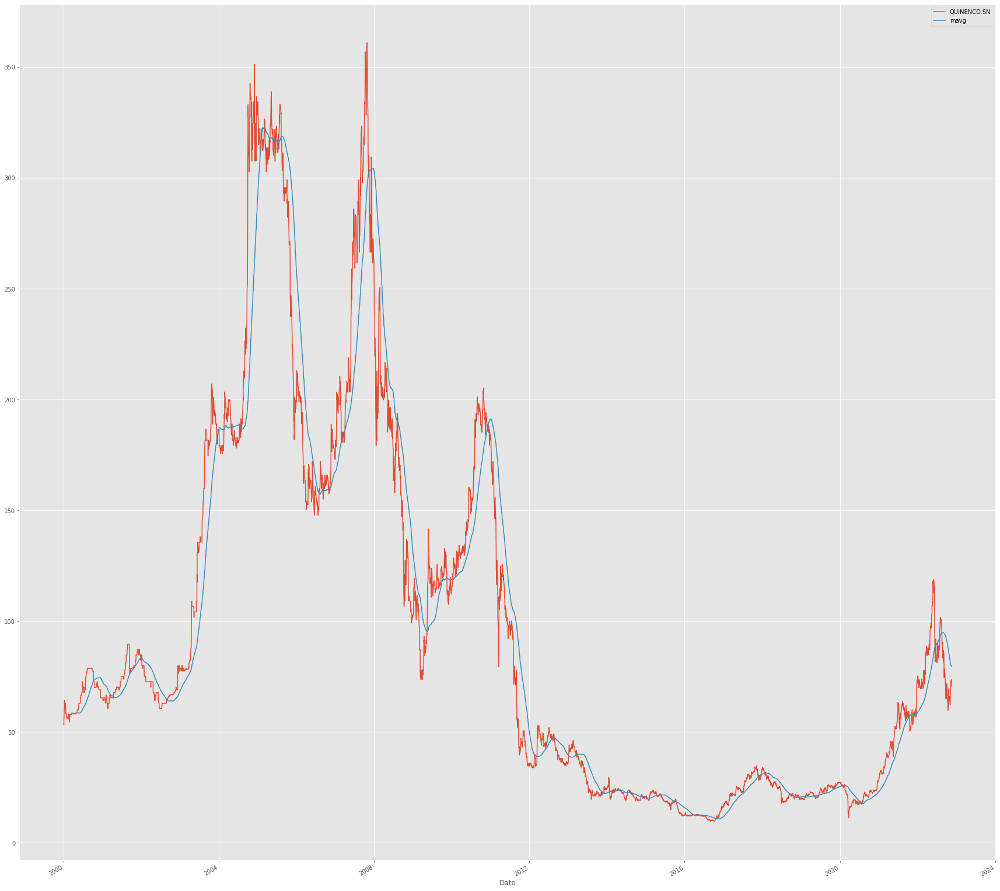

In [45]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import style

# Adjusting the size of matplotlib
import matplotlib as mpl
mpl.rc('figure', figsize=(30, 30))
mpl.__version__

# Adjusting the style of matplotlib
style.use('ggplot')

close_px.plot(label=accion_predecir)
mavg.plot(label='mavg')
plt.legend()

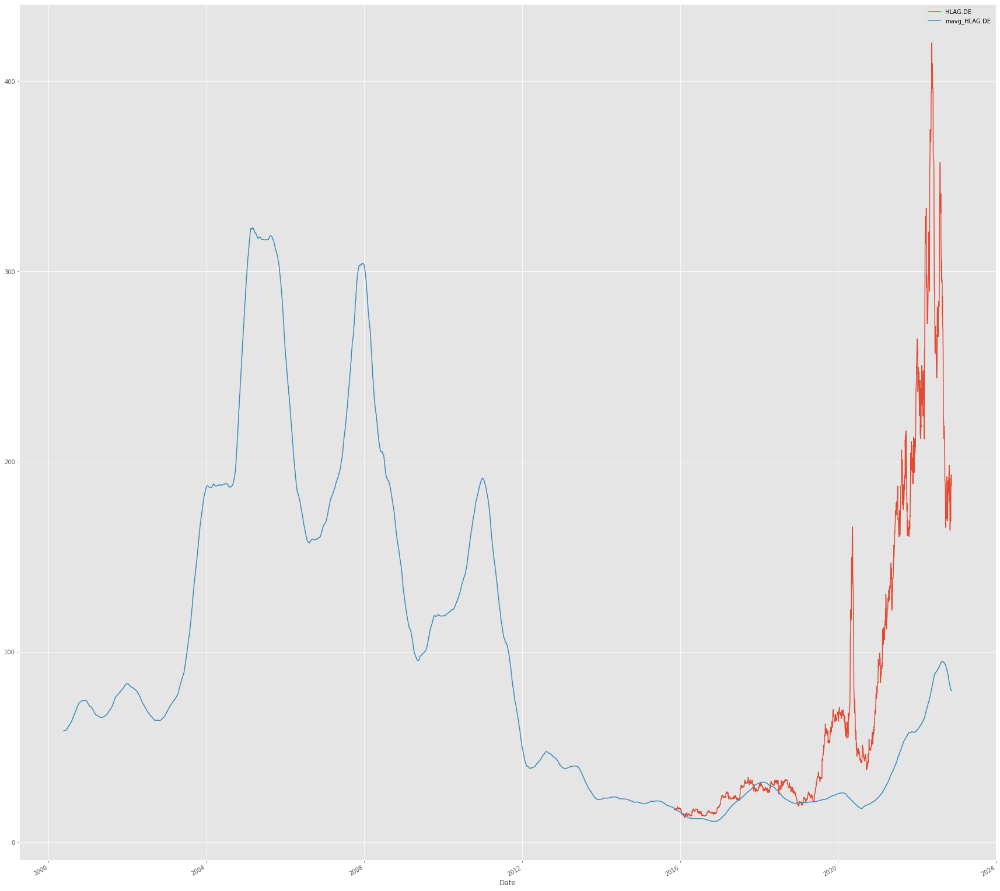

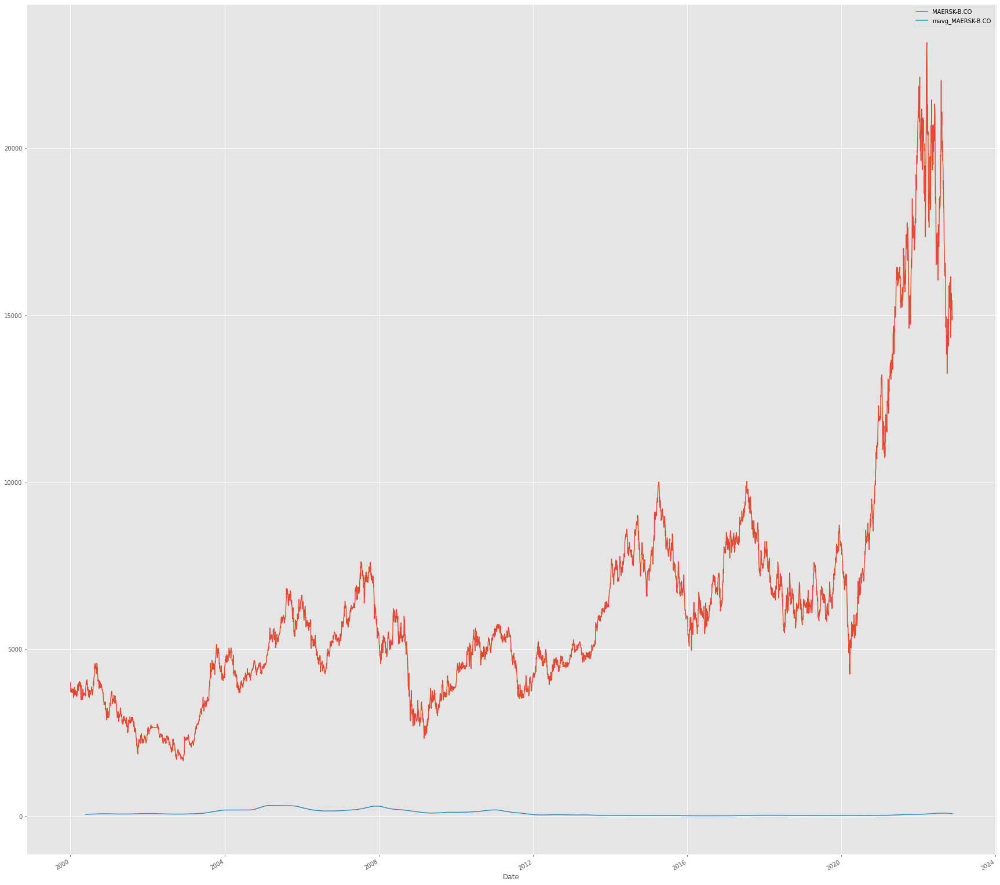

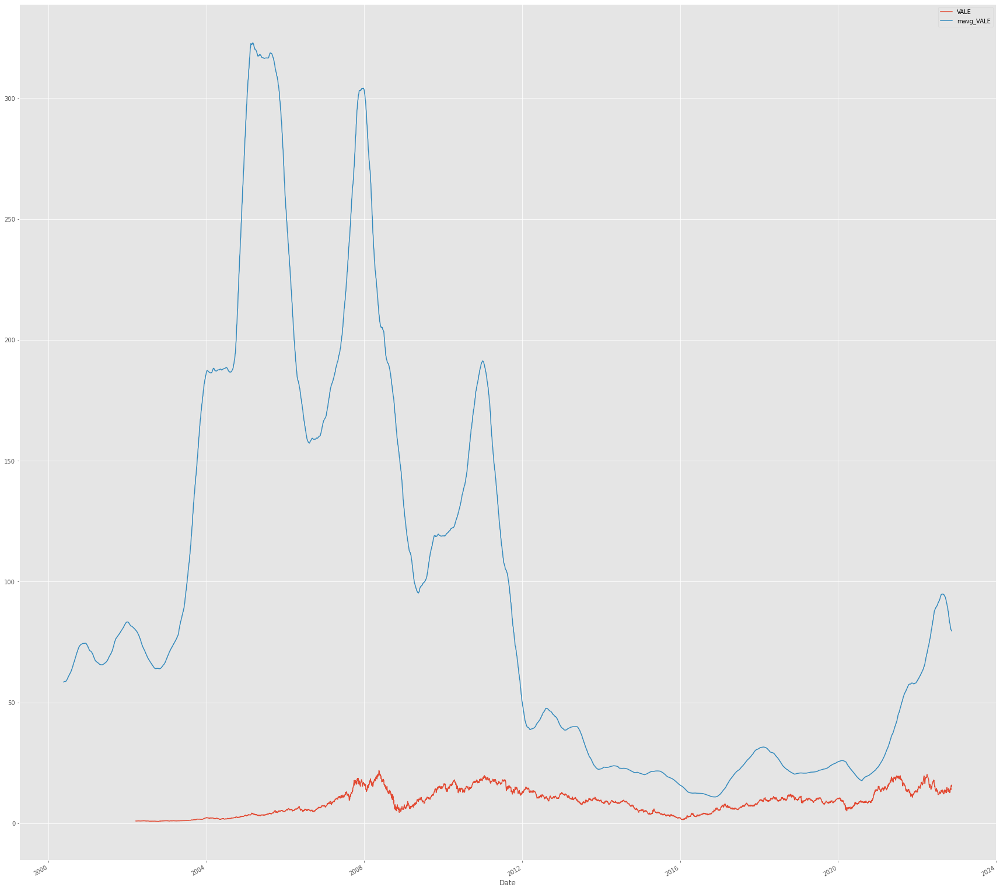

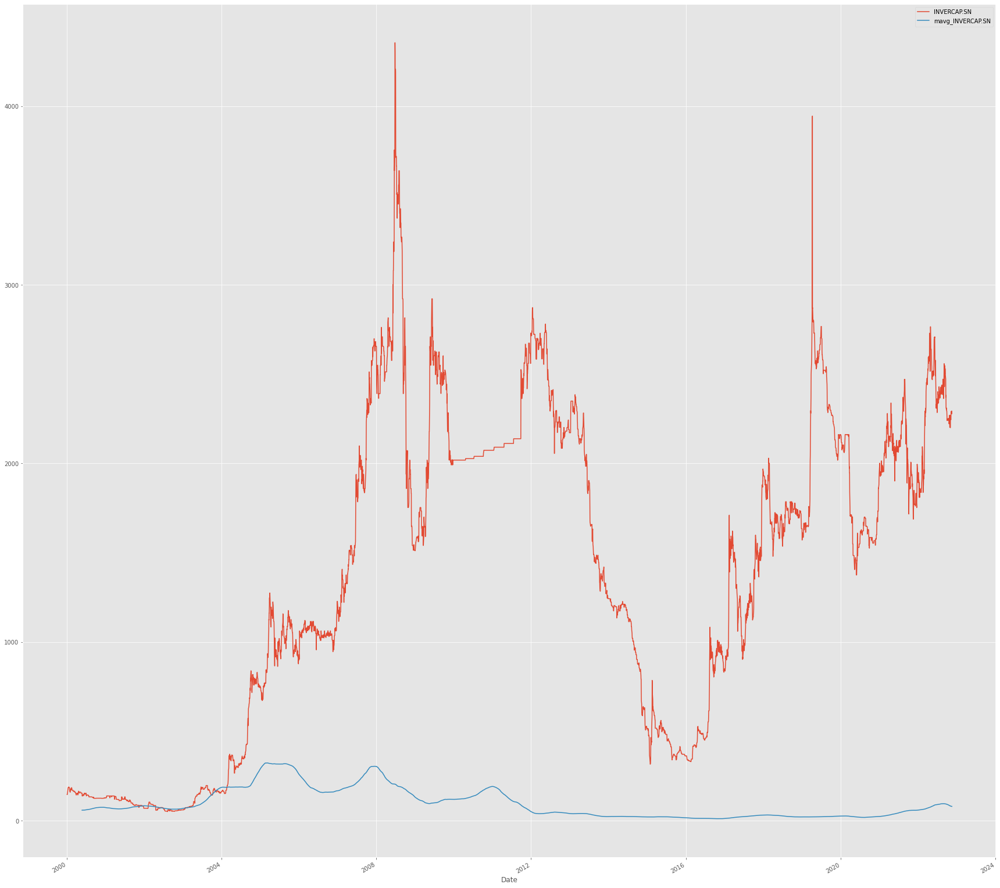

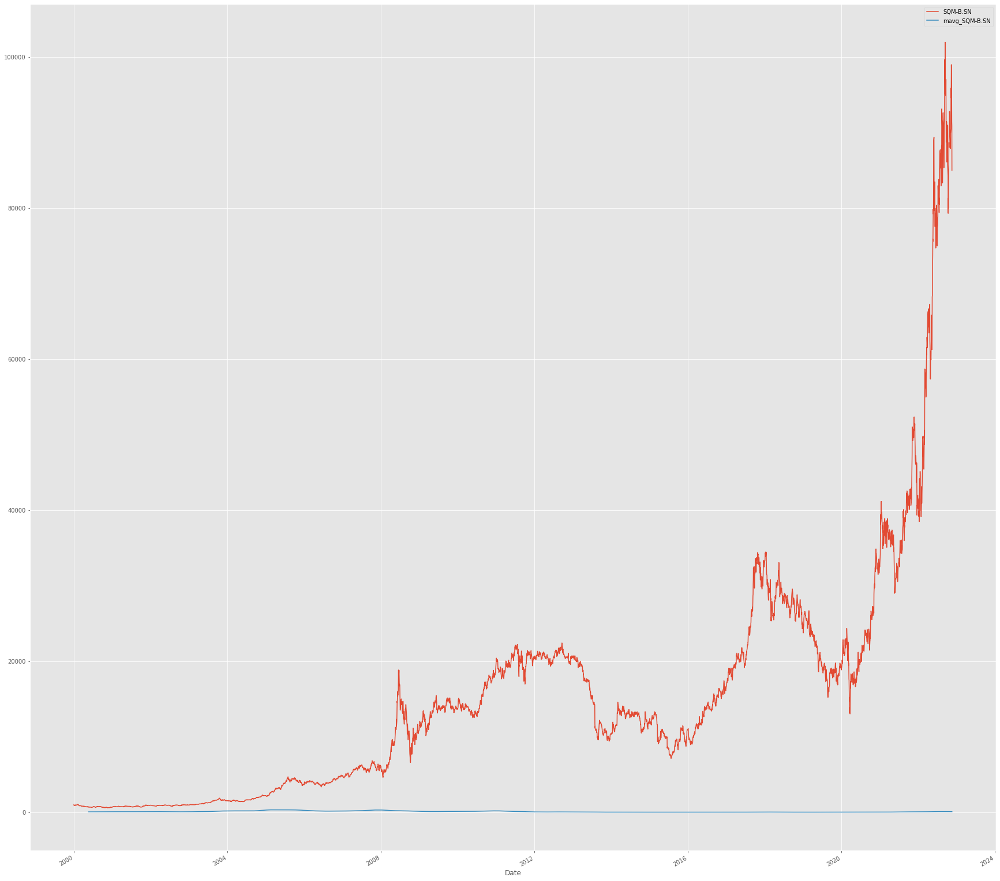

...

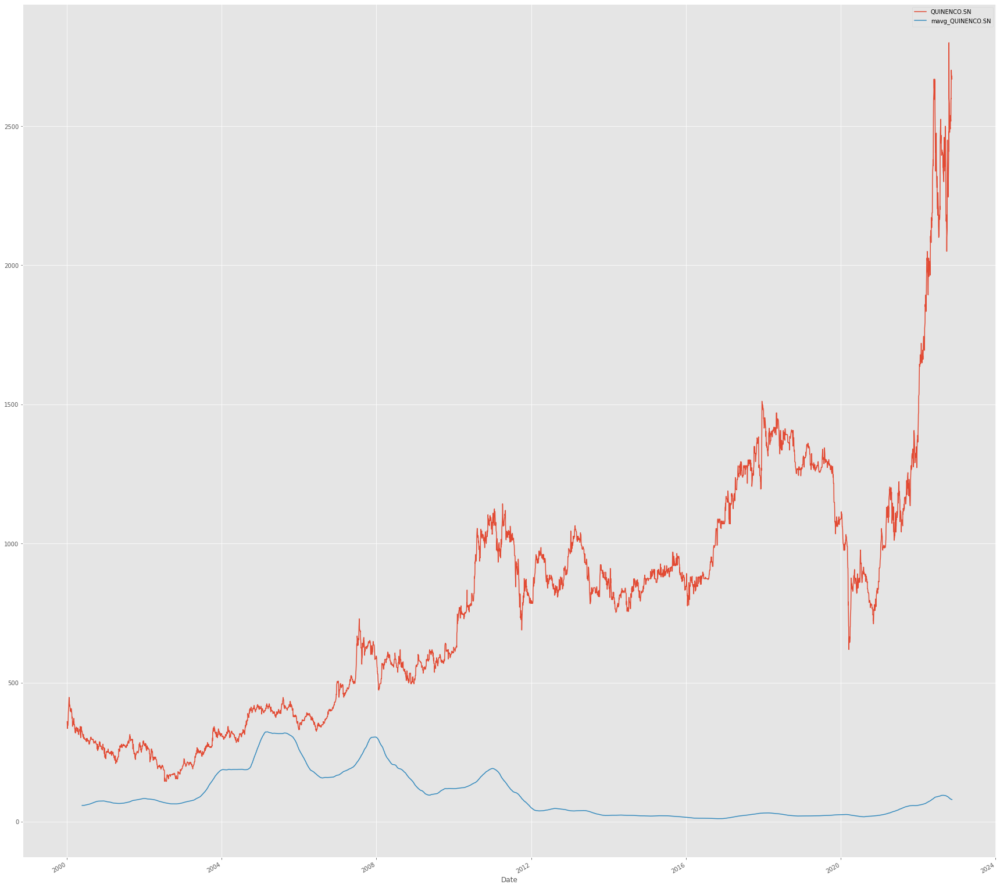

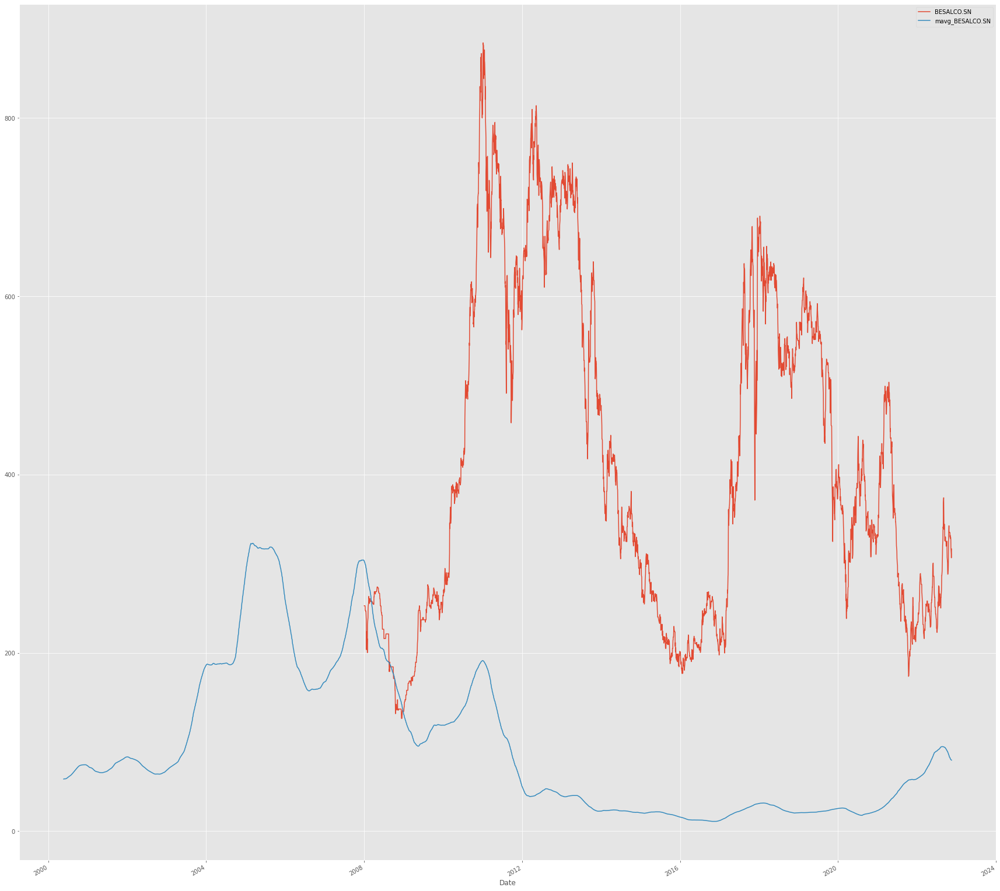

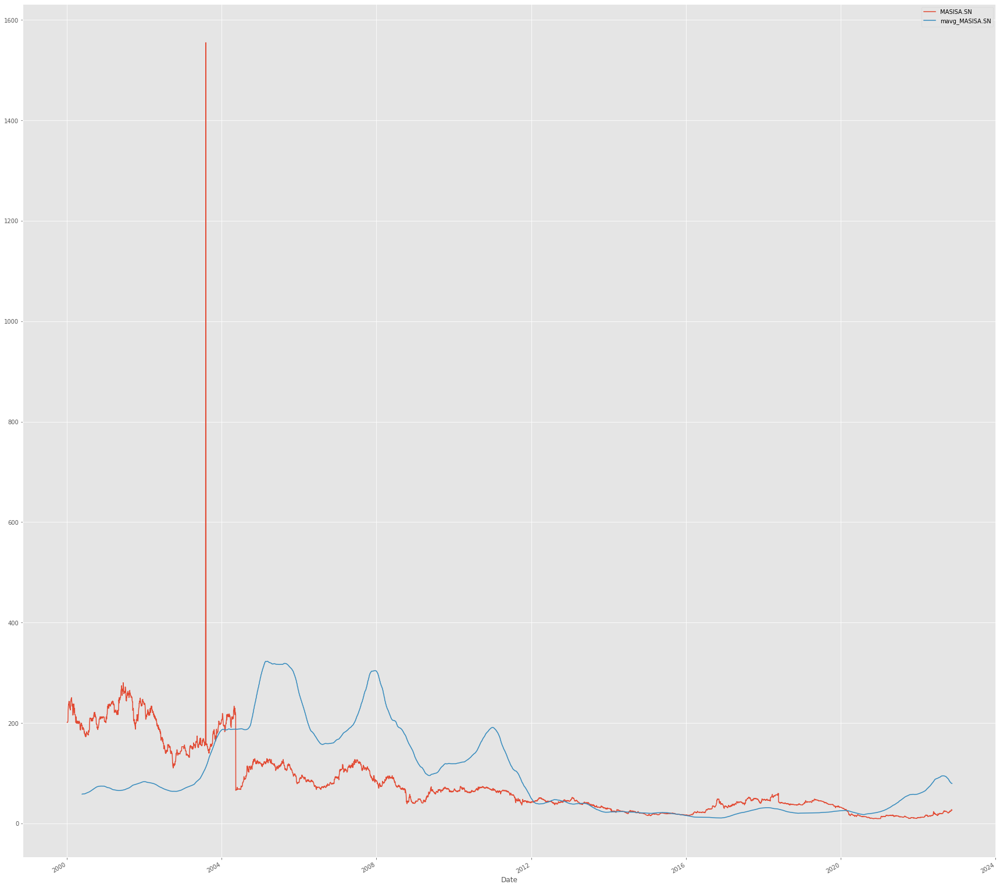

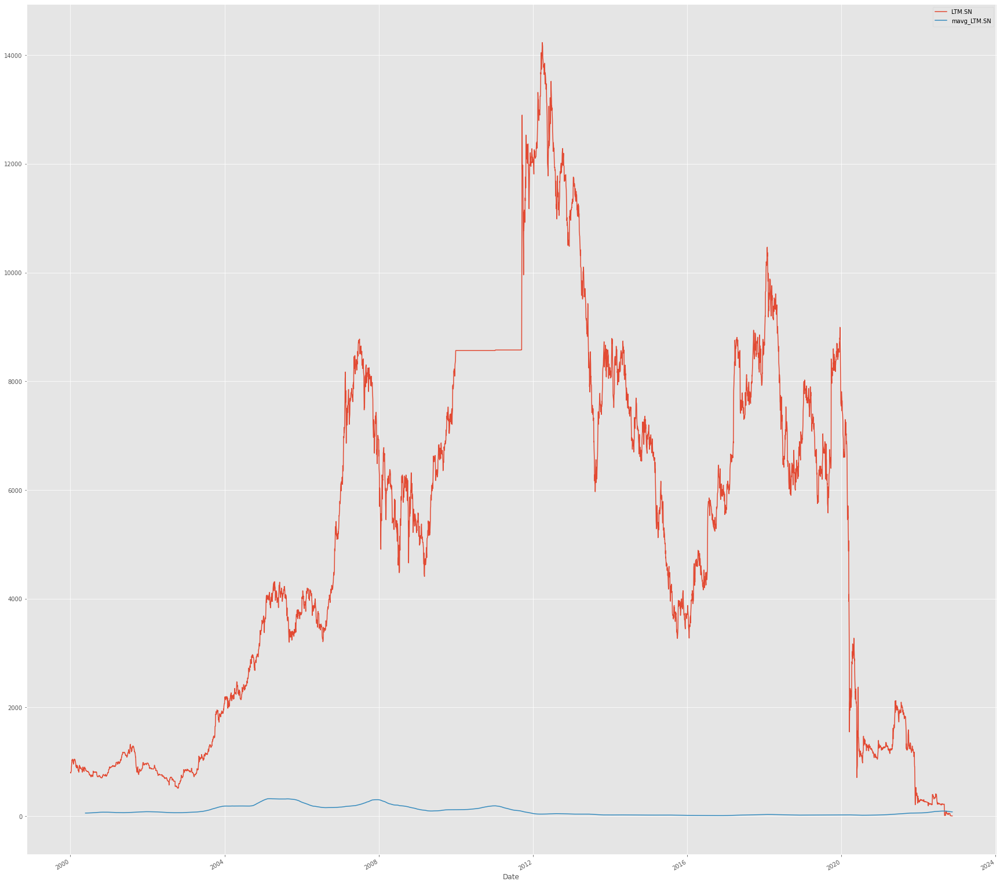

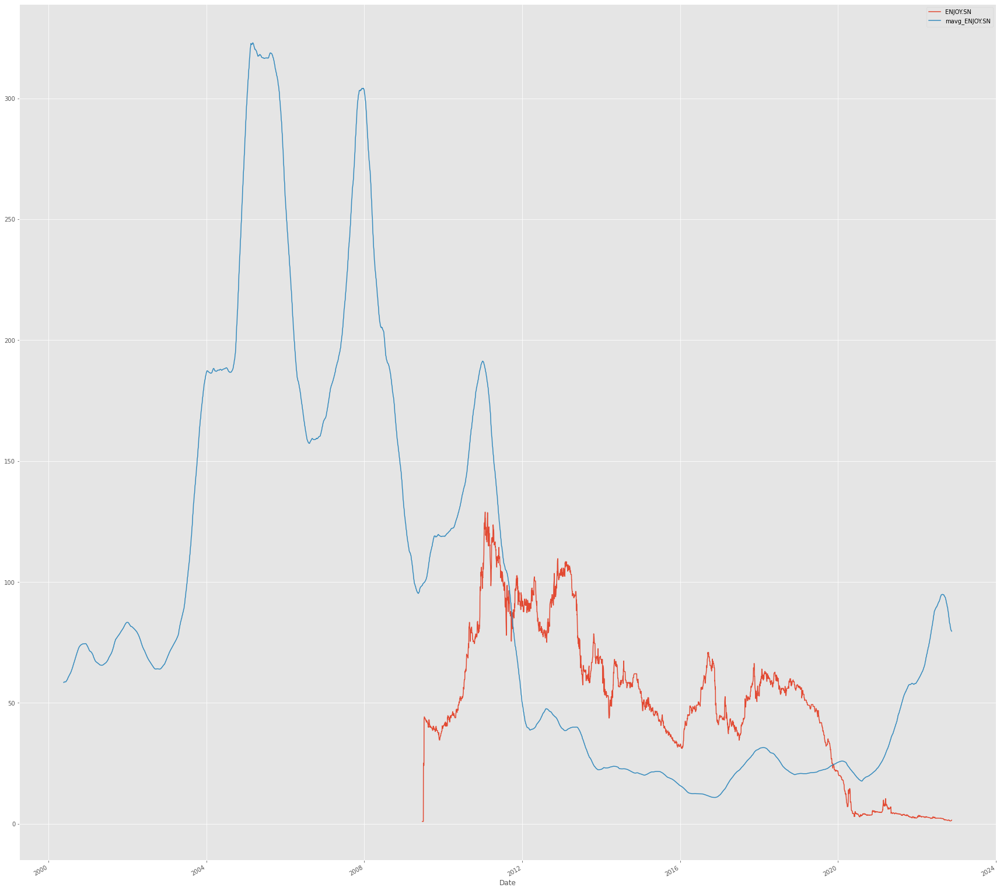

In [46]:
for i in ipsa:
  %matplotlib inline
  import matplotlib.pyplot as plt
  from matplotlib import style

  # Adjusting the size of matplotlib
  import matplotlib as mpl
  mpl.rc('figure', figsize=(30, 30))
  mpl.__version__

  # Adjusting the style of matplotlib
  style.use('ggplot')

  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)
  plt.legend()
  plt.show()


Returns defined as: 
$$ $$
$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

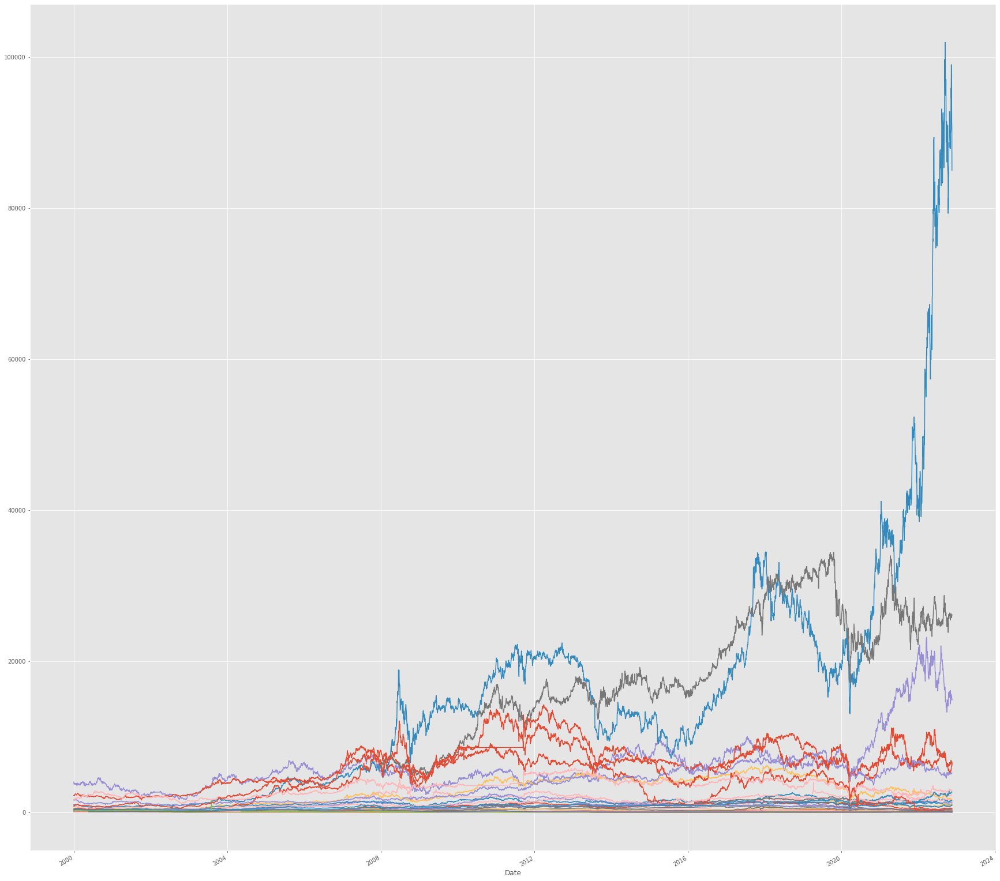

In [47]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()["rets"+str(i).replace(".","")] = globals()["close_px_" + str(i).replace(".","")] / globals()["close_px_" + str(i).replace(".","")] - 1
  globals()["rets"+str(i).replace(".","")].head()

  globals()["close_px_" + str(i).replace(".","")].pct_change().head()

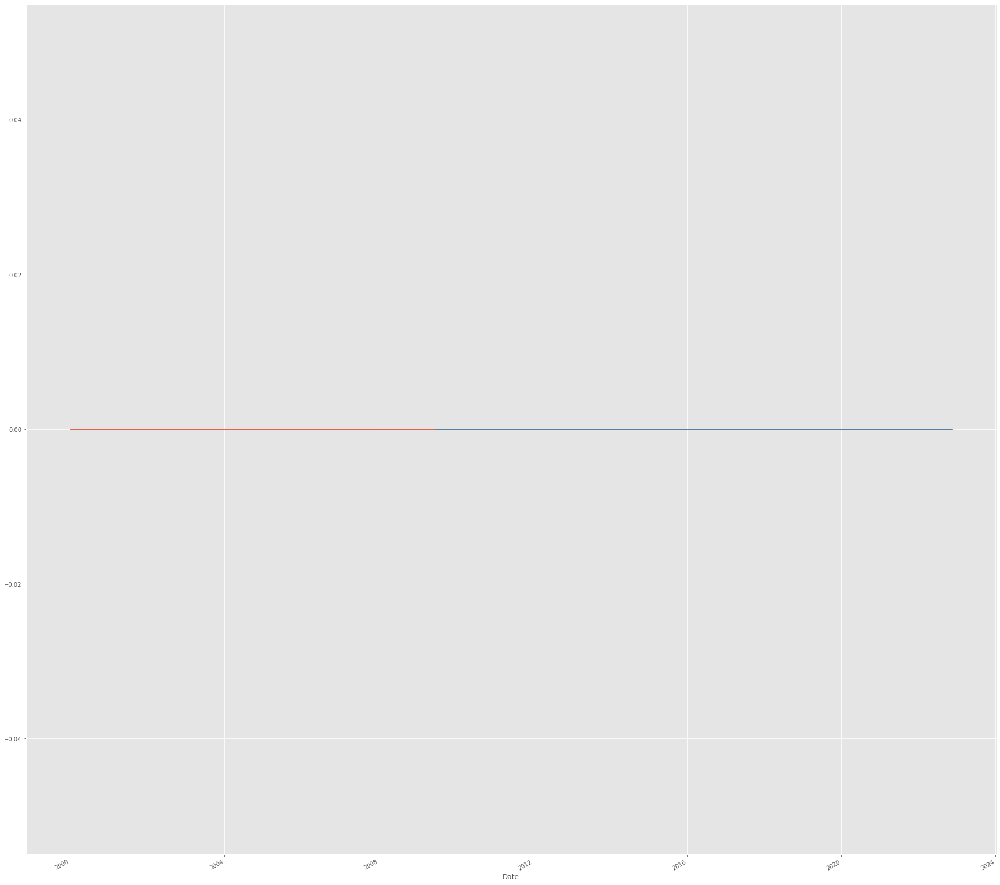

In [48]:
for i in ipsa:
  globals()["rets"+str(i).replace(".","")].plot(label='return')

## Doing the competitor analysis/Correlation

1. How does one company perform in relative with its competitor
2. What are the correlations among these companies

In [49]:

dfcomp = web.DataReader(ipsa,'yahoo',
                               start=start, 
                               end=end)['Adj Close']
dfcomp.tail()

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Date,,,,,,,,,,,,,,,,,,,,,
2022-11-11,185.800003,15450.0,15.45,2288.300049,99000.0,84.500000,33.970001,6585.000000,1300.0,1738.0,...,100.949997,500.000000,328.890015,147.410004,155.000000,2701.399902,317.619995,27.370001,6.000,1.246
2022-11-14,193.100006,15425.0,15.71,2293.100098,95150.0,84.500000,33.849998,6560.000000,1285.0,1685.0,...,100.650002,512.809998,324.339996,144.789993,156.119995,2668.800049,310.890015,27.340000,5.865,1.307
2022-11-15,190.899994,15315.0,15.81,2293.100098,91414.0,83.900002,33.360001,6385.000000,1291.0,1670.0,...,103.669998,500.109985,327.600006,141.839996,154.100006,2680.000000,306.559998,27.340000,5.719,1.369
2022-11-16,188.000000,14855.0,15.22,2293.199951,90900.0,84.389999,33.000000,6360.000000,1300.0,1646.0,...,106.500000,503.450012,325.000000,143.320007,154.789993,2673.699951,313.290009,26.740000,5.881,1.487
2022-11-17,187.699997,14970.0,15.33,2278.300049,85000.0,84.959999,33.000000,6389.899902,1300.0,1605.0,...,108.419998,504.410004,324.690002,146.000000,155.839996,2670.100098,316.559998,26.559999,5.879,1.518


Get the dimension of dataframes

In [50]:
dfcomp.shape

(5933, 37)

In [51]:
retscomp = dfcomp.pct_change()

corr = retscomp.corr()
corr

Symbols,HLAG.DE,MAERSK-B.CO,VALE,INVERCAP.SN,SQM-B.SN,CHILE.SN,BSANTANDER.SN,COPEC.SN,CENCOSUD.SN,FALABELLA.SN,...,SMU.SN,ECL.SN,SONDA.SN,RIPLEY.SN,SECURITY.SN,QUINENCO.SN,BESALCO.SN,MASISA.SN,LTM.SN,ENJOY.SN
Symbols,,,,,,,,,,,,,,,,,,,,,
HLAG.DE,1.000000,0.388565,0.117555,0.036344,0.113413,0.059315,0.080493,0.062754,0.006300,0.083929,...,0.058972,0.043347,0.081244,0.032992,0.082582,0.097641,0.044301,0.052438,0.013835,0.066028
MAERSK-B.CO,0.388565,1.000000,0.309075,0.104848,0.197217,0.168726,0.203435,0.178773,0.157733,0.170470,...,0.137833,0.110512,0.169481,0.183358,0.111406,0.110996,0.144114,0.024744,0.066211,-0.021574
VALE,0.117555,0.309075,1.000000,0.149113,0.358165,0.235067,0.292560,0.272133,0.233986,0.253457,...,0.126546,0.146598,0.210979,0.232461,0.114226,0.129637,0.139572,0.018386,0.088740,-0.009620
INVERCAP.SN,0.036344,0.104848,0.149113,1.000000,0.144574,0.132044,0.126027,0.137055,0.115274,0.134523,...,0.136415,0.101024,0.115745,0.149771,0.115176,0.095914,0.127495,0.020051,0.025509,0.004759
SQM-B.SN,0.113413,0.197217,0.358165,0.144574,1.000000,0.334365,0.358231,0.345500,0.301918,0.326235,...,0.214331,0.163510,0.286747,0.247934,0.172601,0.179793,0.208045,0.037020,0.130325,0.029881
CHILE.SN,0.059315,0.168726,0.235067,0.132044,0.334365,1.000000,0.587172,0.487133,0.458737,0.477362,...,0.421329,0.391420,0.384491,0.377228,0.301011,0.251233,0.292026,0.223949,0.087840,0.007722
BSANTANDER.SN,0.080493,0.203435,0.292560,0.126027,0.358231,0.587172,1.000000,0.446202,0.408605,0.432337,...,0.369095,0.268354,0.366774,0.372674,0.289375,0.238839,0.285717,0.030206,0.130333,0.011715
COPEC.SN,0.062754,0.178773,0.272133,0.137055,0.345500,0.487133,0.446202,1.000000,0.414883,0.475706,...,0.336954,0.237125,0.369469,0.408748,0.245419,0.255579,0.287035,0.049295,0.100496,0.007354
CENCOSUD.SN,0.006300,0.157733,0.233986,0.115274,0.301918,0.458737,0.408605,0.414883,1.000000,0.452176,...,0.379465,0.209003,0.383709,0.434222,0.262957,0.187135,0.290127,0.044813,0.102830,0.004057


In [52]:
#plt.scatter(retscomp.CAP.SN, retscomp.VAPORES.SN)
#plt.xlabel('Returns CAP.SN')
#plt.ylabel('Returns VAPORES.SN')

You can do scatter matrix with all the competitors data and find the kde of each m
KDE will determine if your chart is more normally distributed leaning to the 
* left: Returns are more likely to be negative in the long run
* centre: Returns are more likely to be 0 in the long run
* right: Returns are more likely to be positive in the long run

In [53]:
pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [54]:
#pd.plotting.scatter_matrix(retscomp, diagonal='kde', figsize=(600, 600));

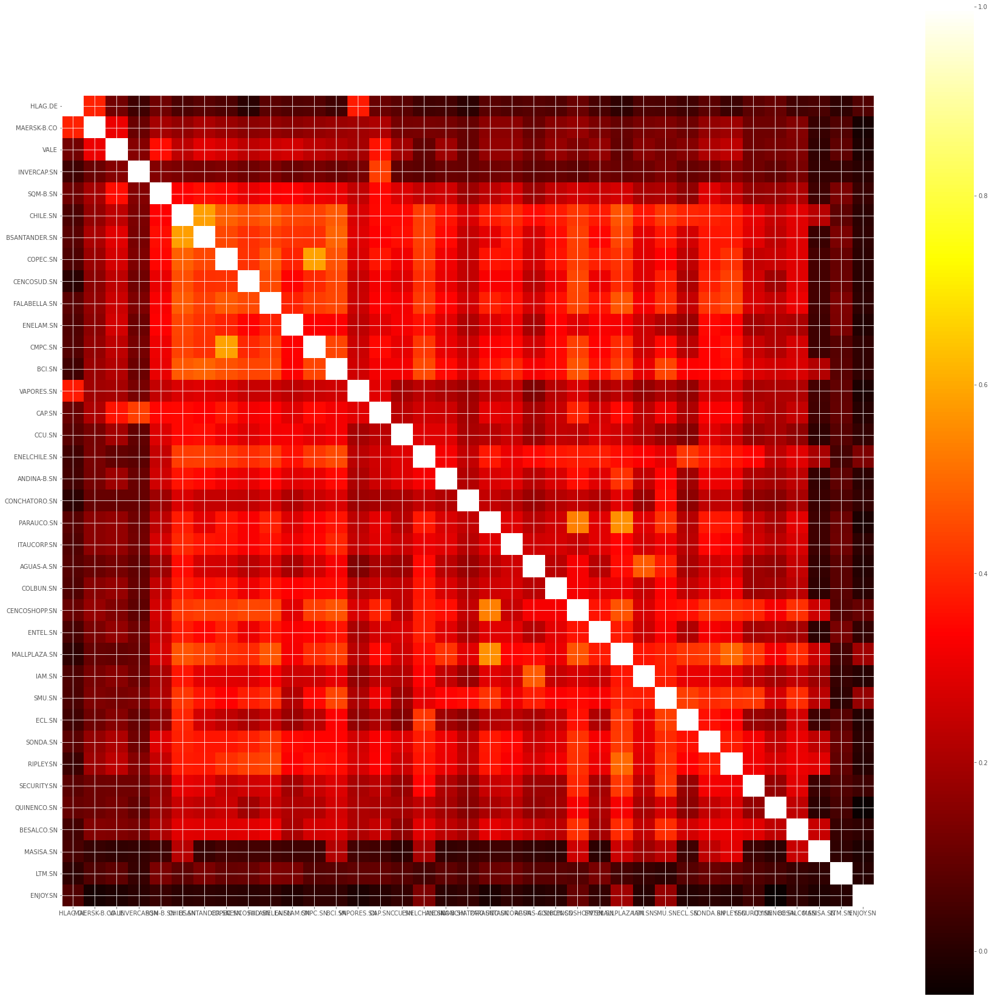

In [55]:
plt.imshow(corr, cmap='hot', interpolation='none')
plt.colorbar()
plt.xticks(range(len(corr)), corr.columns)
plt.yticks(range(len(corr)), corr.columns);

[texto del vínculo](https://)## Stocks mean and Risk calculation
Which stocks are risky and bearing returns

Kurtosis and skewness

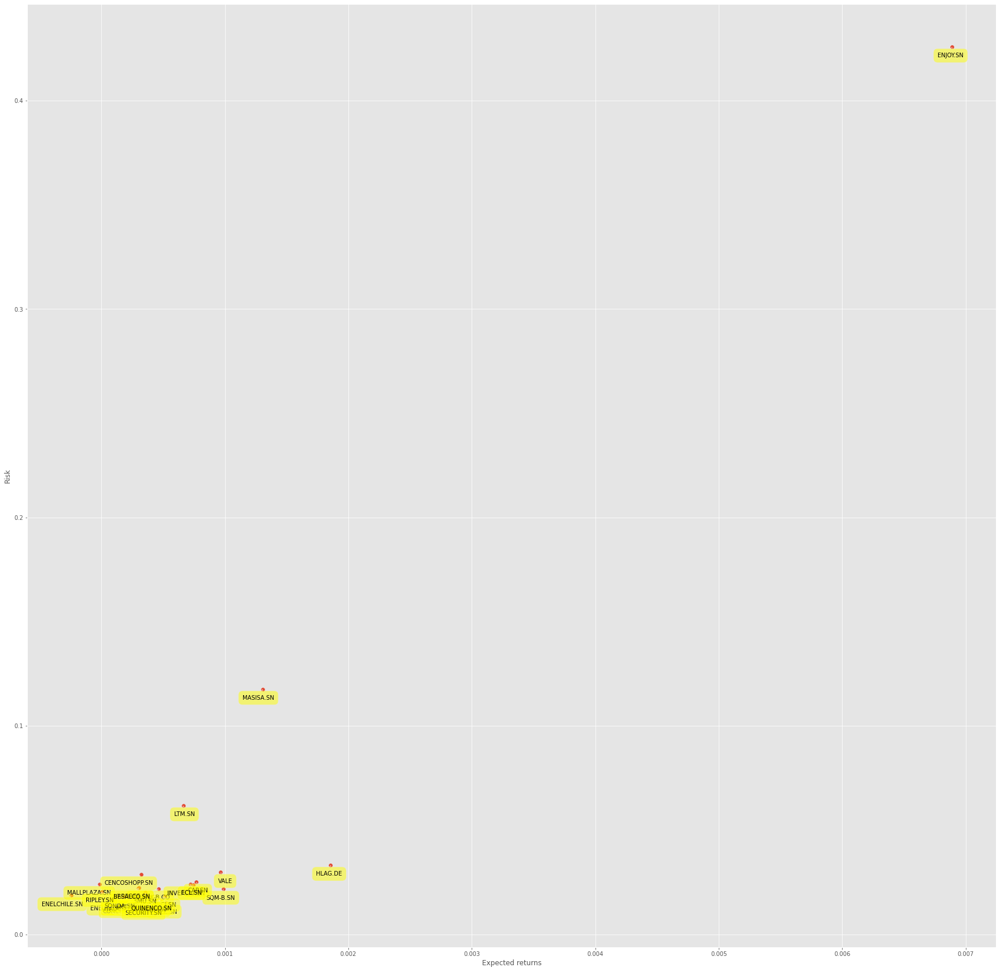

In [56]:
plt.scatter(retscomp.mean(), retscomp.std())
plt.xlabel('Expected returns')
plt.ylabel('Risk')
for label, x, y in zip(retscomp.columns, retscomp.mean(), retscomp.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (20, -20),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        bbox = dict(boxstyle = 'round,pad=0.7', fc = 'yellow', alpha = 0.5),
        arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3,rad=0'))

# Predicting the stocks price

To predict the return of the stocks in the next period - Prediction analysis
* Simple Linear Analysis
* Quadratic Linear Analysis (QDA)
* K Nearest Neighbor (KNN)

But first, let us extract the necessary columns first from df:
* Adj Close
* Adj Volume
* HL Percentage
* PCT Change

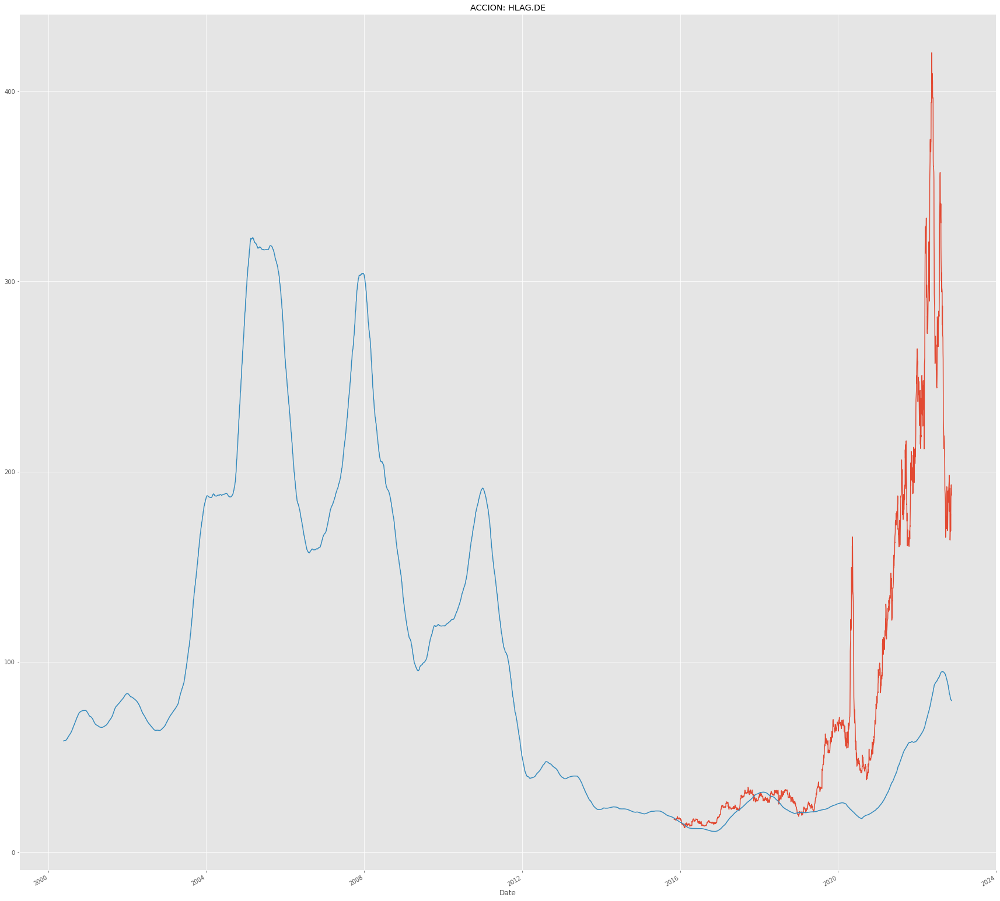

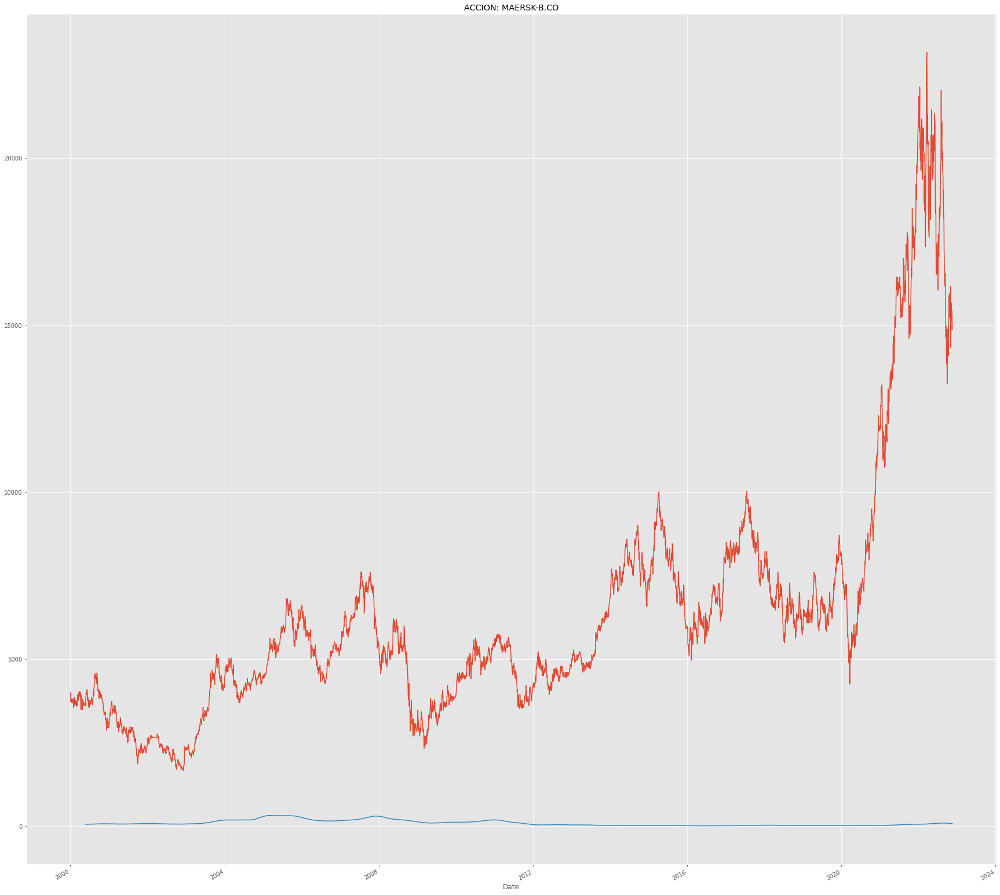

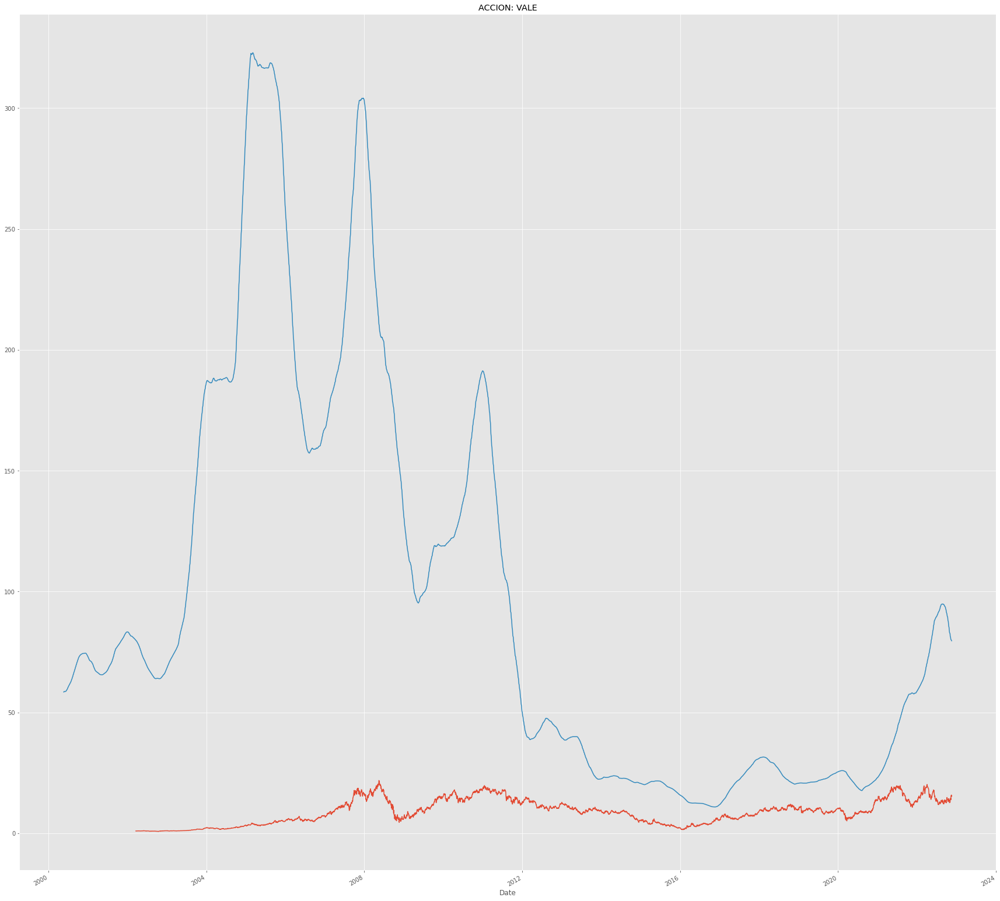

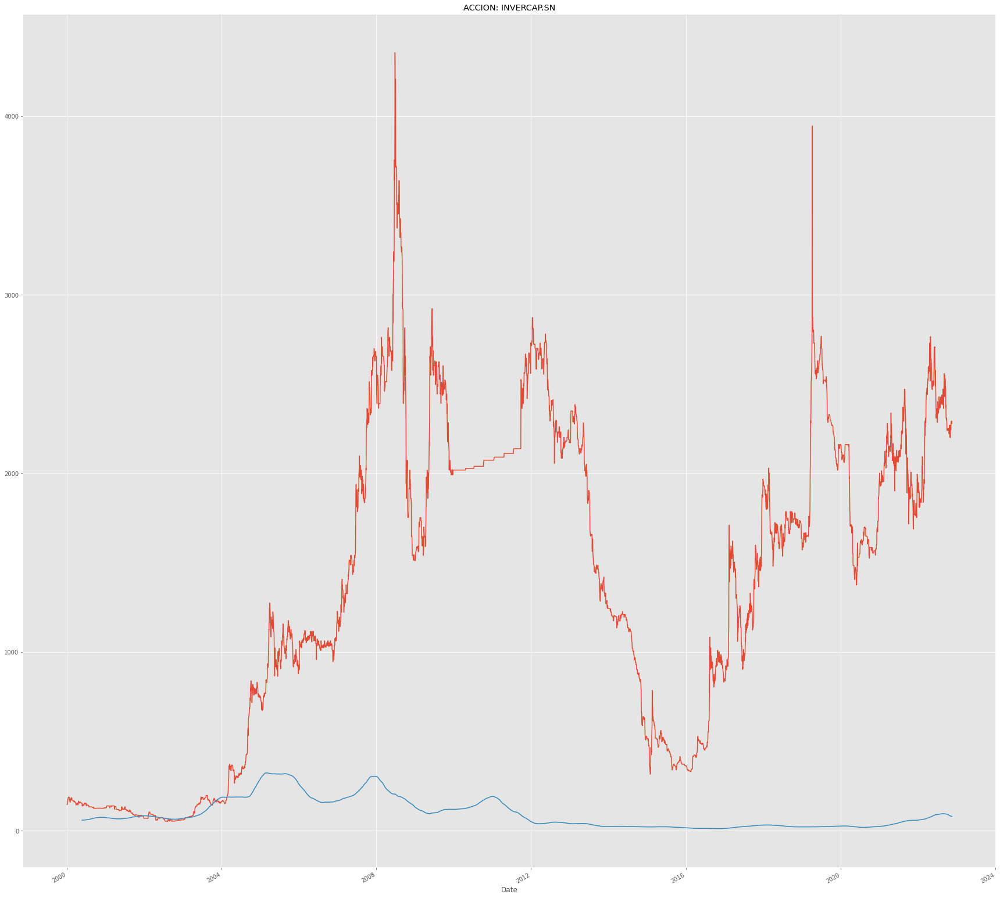

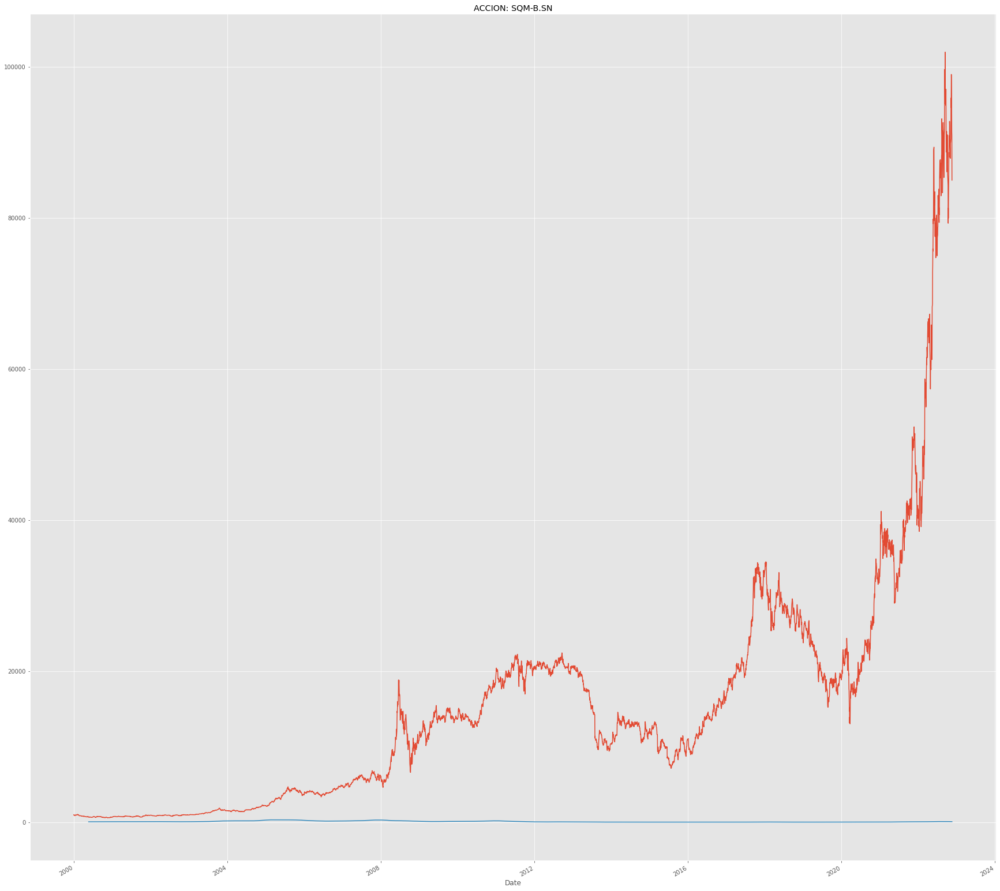

...

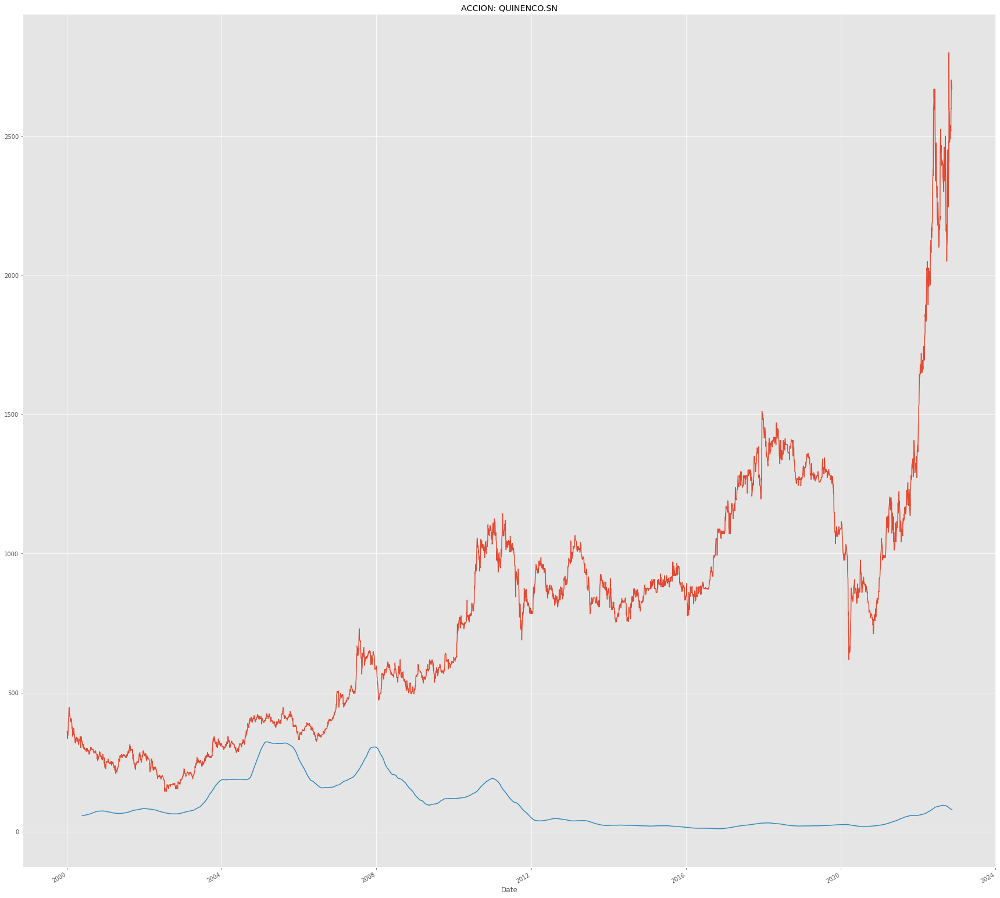

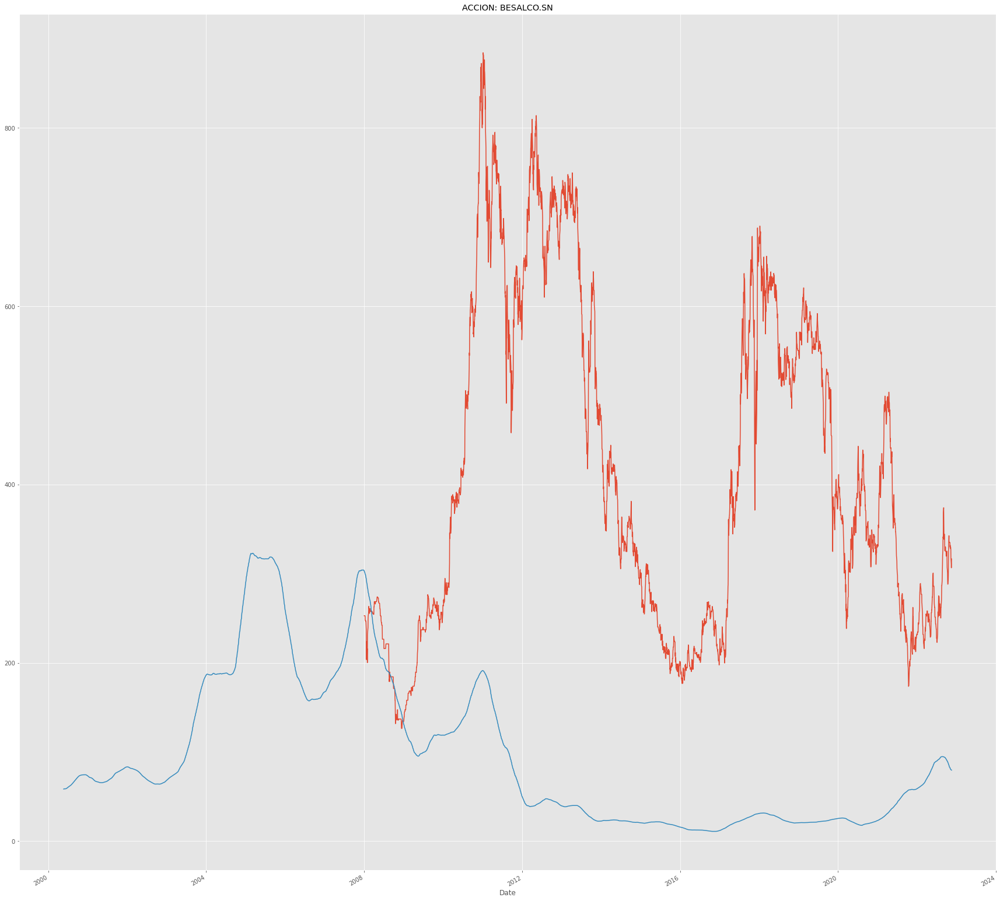

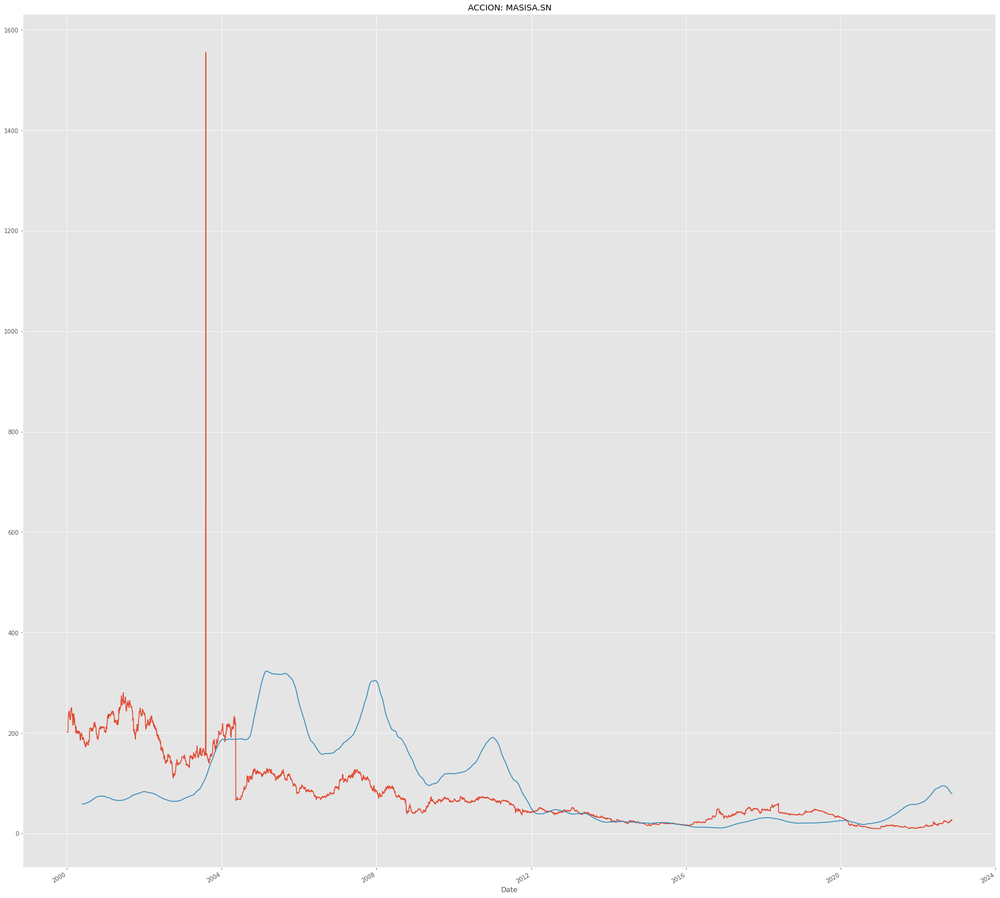

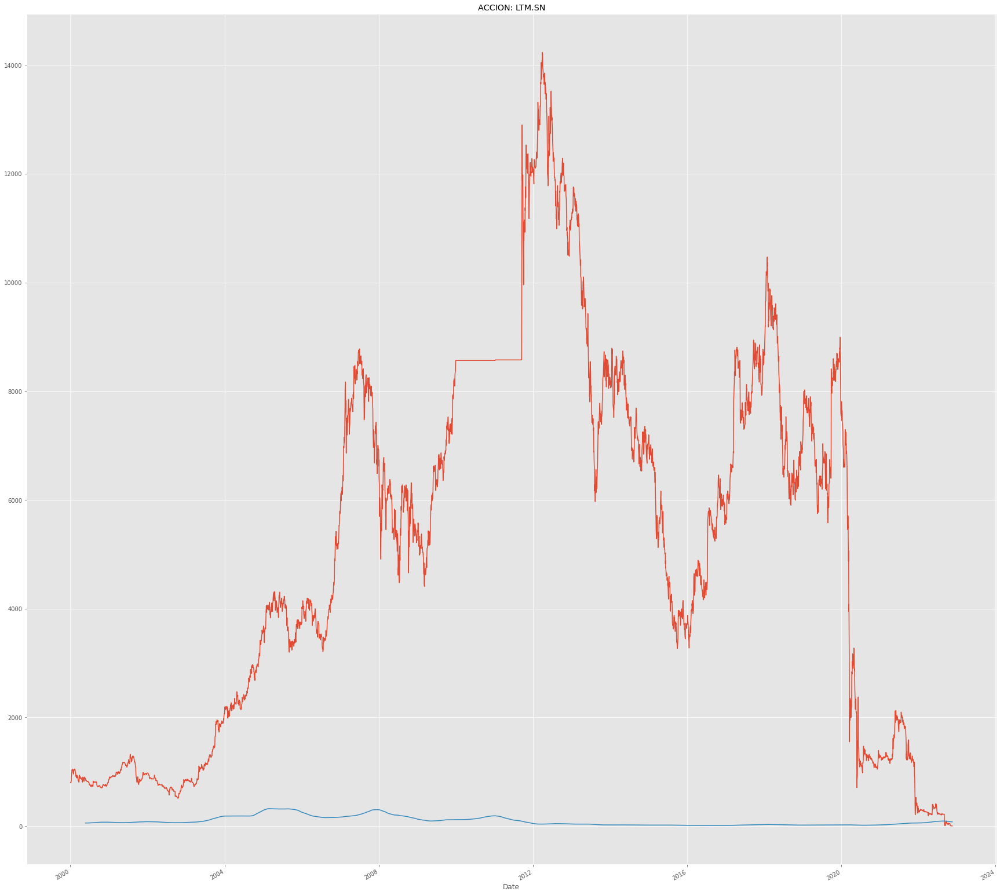

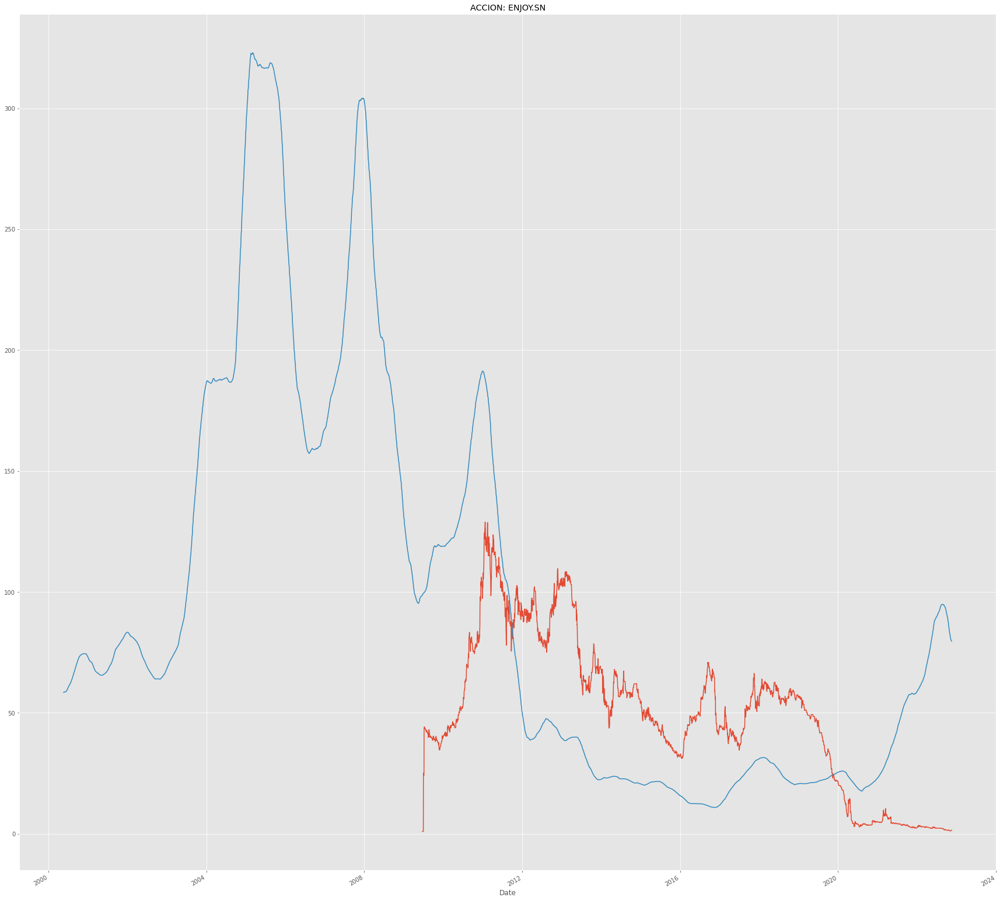

In [57]:
for i in ipsa:
  globals()["close_px_" + str(i).replace(".","")].plot(label=i)
  globals()["mavg" + str(i).replace(".","")].plot(label='mavg_'+i)

  globals()[str(i).replace(".","")].head()
  plt.title("ACCION: "+ str(i))
  plt.show()

In [58]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")] = globals()[str(i).replace(".","")].loc[:,['Adj Close','Volume']]
  globals()[str('dfreg')+str(i).replace(".","")]['HL_PCT'] = (df['High'] - df['Low']) / df['Close'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")]['PCT_change'] = (df['Close'] - df['Open']) / df['Open'] * 100.0
  globals()[str('dfreg')+str(i).replace(".","")].head()

In [59]:
import math
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

for i in ipsa:

  # Drop missing value
  globals()[str('dfreg')+str(i).replace(".","")].fillna(value=-99999, inplace=True)

  globals()[str('dfreg')+str(i).replace(".","")].shape
  # We want to separate 1 percent of the data to forecast
  globals()[str('forecast_out')+str(i).replace(".","")] = int(math.ceil(0.01 * len(globals()[str('dfreg')+str(i).replace(".","")])))

  # Separating the label here, we want to predict the AdjClose
  globals()[str('forecast_col')+str(i).replace(".","")] = 'Adj Close'
  globals()[str('dfreg')+str(i).replace(".","")]['label'] = globals()[str('dfreg')+str(i).replace(".","")][globals()[str('forecast_col')+str(i).replace(".","")]].shift(-globals()[str('forecast_out')+str(i).replace(".","")])
  
  globals()[str('X')+str(i).replace(".","")] = np.array(globals()[str('dfreg')+str(i).replace(".","")].drop(['label'], 1))
  

  # Scale the X so that everyone can have the same distribution for linear regression
  globals()[str('X')+str(i).replace(".","")] = preprocessing.scale(globals()[str('X')+str(i).replace(".","")])

  # Finally We want to find Data Series of late X and early X (train) for model generation and evaluation
  globals()[str('X_lately')+str(i).replace(".","")] =  globals()[str('X')+str(i).replace(".","")][-globals()[str('forecast_out')+str(i).replace(".","")]:]
  globals()[str('X')+str(i).replace(".","")] = globals()[str('X')+str(i).replace(".","")][:-globals()[str('forecast_out')+str(i).replace(".","")]]

  # Separate label and identify it as y
  # Separate label and identify it as y
  globals()[str('y')+str(i).replace(".","")] = np.array( globals()[str('dfreg')+str(i).replace(".","")]['label'])
  globals()[str('y')+str(i).replace(".","")] = globals()[str('y')+str(i).replace(".","")][:-int(globals()[str('forecast_out')+str(i).replace(".","")])]

  print('Dimension of X',globals()[str('X')+str(i).replace(".","")].shape)
  print('Dimension of y',globals()[str('y')+str(i).replace(".","")].shape)
  print("")

Dimension of X (1769, 4)
Dimension of y (1769,)

Dimension of X (5731, 4)
Dimension of y (5731,)

Dimension of X (5151, 4)
Dimension of y (5151,)

Dimension of X (5728, 4)
Dimension of y (5728,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5072, 4)
Dimension of y (5072,)

Dimension of X (5709, 4)
Dimension of y (5709,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (3683, 4)
Dimension of y (3683,)

Dimension of X (5727, 4)
Dimension of y (5727,)

Dimension of X (5735, 4)
Dimension of y (5735,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (1619, 4)
Dimension of y (1619,)

Dimension of X (5646, 4)
Dimension of y (5646,)

Dimension of X (5737, 4)
Dimension of y (5737,)

Dimension of X (5739, 4)
Dimension of y (5739,)

Dimension of X (4990

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only

/usr/local

In [60]:
# Separation of training and testing of model by cross validation train test split
for i in ipsa: 
  globals()[str('X_train')+str(i).replace(".","")], globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")] = train_test_split(globals()[str('X')+str(i).replace(".","")], globals()[str('y')+str(i).replace(".","")], test_size=0.2)

# Model Generation

* To predict the return of the stocks in the next period - Prediction analysis
    * Simple Linear Analysis
    * Quadratic Linear Analysis (QDA)
    * K Nearest Neighbor (KNN)

## Build the model

In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import datetime


from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

for i in ipsa:

  # Linear regression
  globals()[str('clfreg')+str(i).replace(".","")] = LinearRegression(n_jobs=-1)
  globals()[str('clfreg')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])


  # Quadratic Regression 2
  globals()[str('clfpoly2')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(2), Ridge())
  globals()[str('clfpoly2')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

  # Quadratic Regression 3
  globals()[str('clfpoly3')+str(i).replace(".","")] = make_pipeline(PolynomialFeatures(3), Ridge())
  globals()[str('clfpoly3')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])
      
  # KNN Regression
  globals()[str('clfknn')+str(i).replace(".","")] = KNeighborsRegressor(n_neighbors=2)
  globals()[str('clfknn')+str(i).replace(".","")].fit(globals()[str('X_train')+str(i).replace(".","")], globals()[str('y_train')+str(i).replace(".","")])

## Test the model

In [62]:
for i in ipsa:

  globals()[str('confidencereg')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly2')+str(i).replace(".","")] = globals()[str('clfpoly2')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidencepoly3')+str(i).replace(".","")] = globals()[str('clfpoly3')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])
  globals()[str('confidenceknn')+str(i).replace(".","")] = globals()[str('clfknn')+str(i).replace(".","")].score(globals()[str('X_test')+str(i).replace(".","")], globals()[str('y_test')+str(i).replace(".","")])

  print("The linear regression confidence is ",globals()[str('confidencereg')+str(i).replace(".","")])
  print("The quadratic regression 2 confidence is ",globals()[str('confidencepoly2')+str(i).replace(".","")])
  print("The quadratic regression 3 confidence is ",globals()[str('confidencepoly3')+str(i).replace(".","")])
  print("The knn regression confidence is ",globals()[str('confidenceknn')+str(i).replace(".","")])
  print("")

The linear regression confidence is  0.917511557343844
The quadratic regression 2 confidence is  0.9254451128134058
The quadratic regression 3 confidence is  0.9266410432608693
The knn regression confidence is  0.9176226591337625

The linear regression confidence is  0.9134897256567616
The quadratic regression 2 confidence is  0.9147568805686835
The quadratic regression 3 confidence is  0.924472598538754
The knn regression confidence is  0.9049949125508624

The linear regression confidence is  0.8424578238132674
The quadratic regression 2 confidence is  0.8564676470384757
The quadratic regression 3 confidence is  0.8614093994862769
The knn regression confidence is  0.812923974822028

The linear regression confidence is  0.863484562840979
The quadratic regression 2 confidence is  0.8350045793921583
The quadratic regression 3 confidence is  -0.23019194094326956
The knn regression confidence is  0.8606324869366034

The linear regression confidence is  0.9499968721116646
The quadratic regr

This means that the linear regression holds the most accuracy of it as being linear and justify the trend of stocks as being linear most of the times. 

However this does not mean we can just put stocks in it. There are still many issues to consider, especially with different companies that have different price trajectories over time. Google really is very linear: Up and to the right. Many companies aren't, so keep this in mind. 

We need to plot out the graph to make the most sense of it 

In [63]:
# Printing the forecast

for i in ipsa:
  globals()[str('forecast_set')+str(i).replace(".","")] = globals()[str('clfreg')+str(i).replace(".","")].predict(globals()[str('X_lately')+str(i).replace(".","")])
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'] = np.nan
  print(globals()[str('forecast_set')+str(i).replace(".","")], globals()[str('confidencereg')+str(i).replace(".","")], globals()[str('forecast_out')+str(i).replace(".","")])
  print("")

[190.8003214  192.71773043 184.98372832 175.91845331 177.10826587
 184.8784915  166.04036371 164.40054815 163.45900687 170.72919773
 175.72869406 165.71871975 173.76816202 182.26079075 189.3962392
 186.54227412 182.855406   185.04937279] 0.917511557343844 18

[17964.10460535 17724.67748398 17141.88277648 17173.85904153
 16599.34796715 16301.34048167 16403.67345918 16130.46846772
 16209.02827663 16483.43318336 16180.43446157 16073.76016006
 15517.90709678 14926.9594929  15126.73518396 14790.23313059
 14842.83443318 14362.08843092 13941.72444979 13975.99982521
 14453.5885936  14058.12760709 13312.80333614 13920.76210206
 14289.33714722 14949.05305824 14351.0942413  14392.01908677
 14131.35897546 14690.46773177 14098.95870937 14523.708356
 14732.35574899 15239.29388983 15199.88315185 15882.61775134
 15168.79769915 15753.43341146 15752.01933902 15831.77948254
 15931.3135634  15900.67781618 15616.01884446 15188.20217064
 15917.78443327 16291.93963496 15226.27366689 14379.53738379
 14583.976

# Plotting the Prediction

In [64]:
for i in ipsa:
  globals()[str('last_date')+str(i).replace(".","")] = globals()[str('dfreg')+str(i).replace(".","")].iloc[-1].name
  globals()[str('last_unix')+str(i).replace(".","")] = globals()[str('last_date')+str(i).replace(".","")]
  globals()[str('next_unix')+str(i).replace(".","")] = globals()[str('last_unix')+str(i).replace(".","")] + datetime.timedelta(days=1)

  for x in globals()[str('forecast_set')+str(i).replace(".","")]:
      globals()[str('next_date')+str(i).replace(".","")] = globals()[str('next_unix')+str(i).replace(".","")]
      globals()[str('next_unix')+str(i).replace(".","")] += datetime.timedelta(days=1)
      globals()[str('dfreg')+str(i).replace(".","")].loc[globals()[str('next_date')+str(i).replace(".","")]] = [np.nan for _ in range(len(globals()[str('dfreg')+str(i).replace(".","")].columns)-1)]+[x]

HLAG.DE
Date
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18    190.800321
2022-11-19    192.717730
2022-11-20    184.983728
2022-11-21    175.918453
2022-11-22    177.108266
2022-11-23    184.878491
2022-11-24    166.040364
2022-11-25    164.400548
2022-11-26    163.459007
2022-11-27    170.729198
2022-11-28    175.728694
2022-11-29    165.718720
2022-11-30    173.768162
2022-12-01    182.260791
2022-12-02    189.396239
2022-12-03    186.542274
2022-12-04    182.855406
2022-12-05    185.049373
Name: Forecast, dtype: float64
----------------------


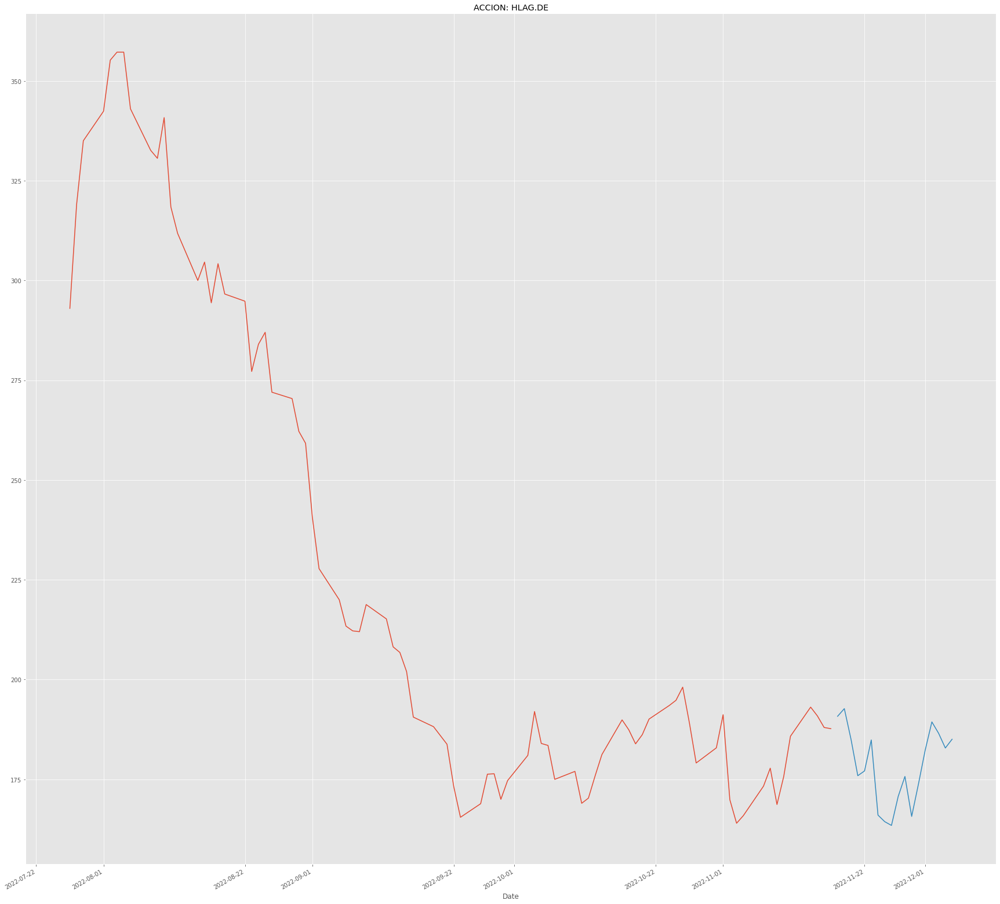


MAERSK-B.CO
Date
2022-12-16    14131.358975
2022-12-17    14690.467732
2022-12-18    14098.958709
2022-12-19    14523.708356
2022-12-20    14732.355749
2022-12-21    15239.293890
2022-12-22    15199.883152
2022-12-23    15882.617751
2022-12-24    15168.797699
2022-12-25    15753.433411
2022-12-26    15752.019339
2022-12-27    15831.779483
2022-12-28    15931.313563
2022-12-29    15900.677816
2022-12-30    15616.018844
2022-12-31    15188.202171
2023-01-01    15917.784433
2023-01-02    16291.939635
2023-01-03    15226.273667
2023-01-04    14379.537384
2023-01-05    14583.976911
2023-01-06    15303.448015
2023-01-07    15635.309968
2023-01-08    15122.428896
2023-01-09    15412.600035
2023-01-10    15429.820998
2023-01-11    15384.847127
2023-01-12    15273.703480
2023-01-13    14799.569103
2023-01-14    14946.297147
Name: Forecast, dtype: float64
----------------------


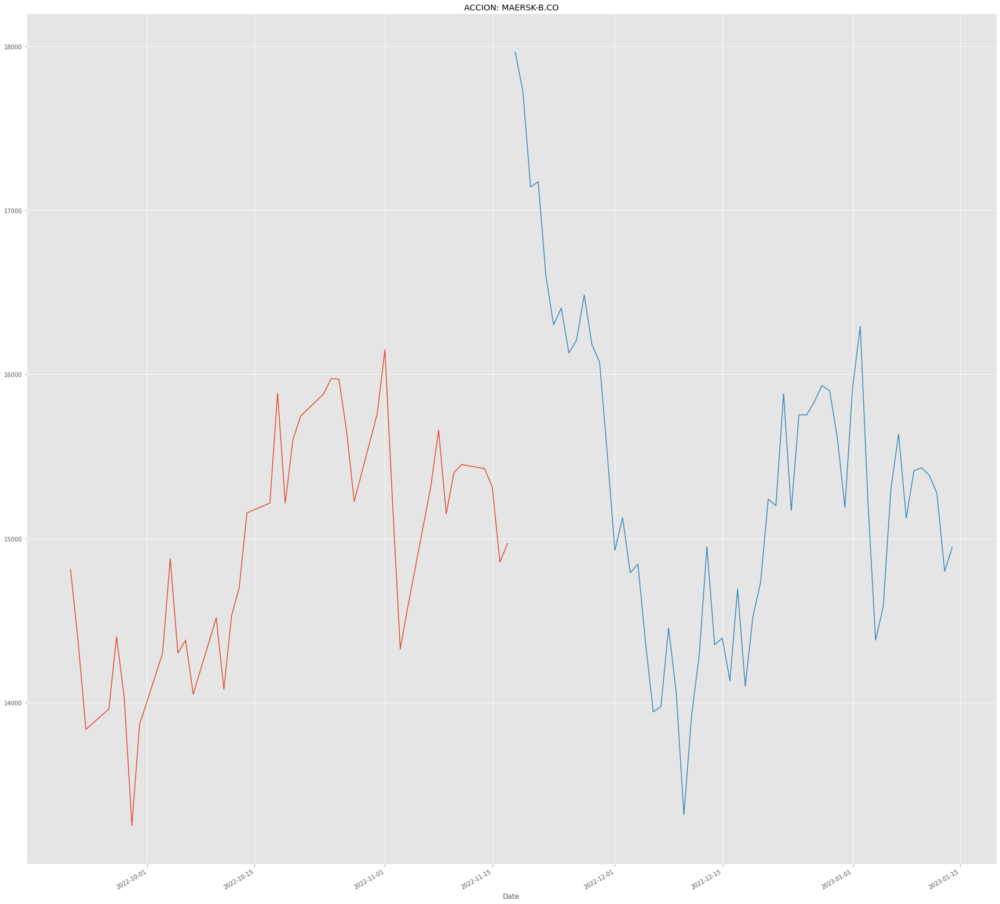


VALE
Date
2022-12-11    14.986460
2022-12-12    14.430315
2022-12-13    13.818889
2022-12-14    13.455451
2022-12-15    13.739896
2022-12-16    13.160026
2022-12-17    13.335071
2022-12-18    13.662057
2022-12-19    13.402914
2022-12-20    13.937616
2022-12-21    14.623393
2022-12-22    13.941549
2022-12-23    13.868195
2022-12-24    14.023107
2022-12-25    13.741514
2022-12-26    13.170610
2022-12-27    13.789192
2022-12-28    14.094014
2022-12-29    12.932336
2022-12-30    13.109483
2022-12-31    14.922408
2023-01-01    13.695244
2023-01-02    14.333088
2023-01-03    13.815069
2023-01-04    13.862791
2023-01-05    15.591075
2023-01-06    15.461048
2023-01-07    15.311949
2023-01-08    14.867709
2023-01-09    14.901780
Name: Forecast, dtype: float64
----------------------


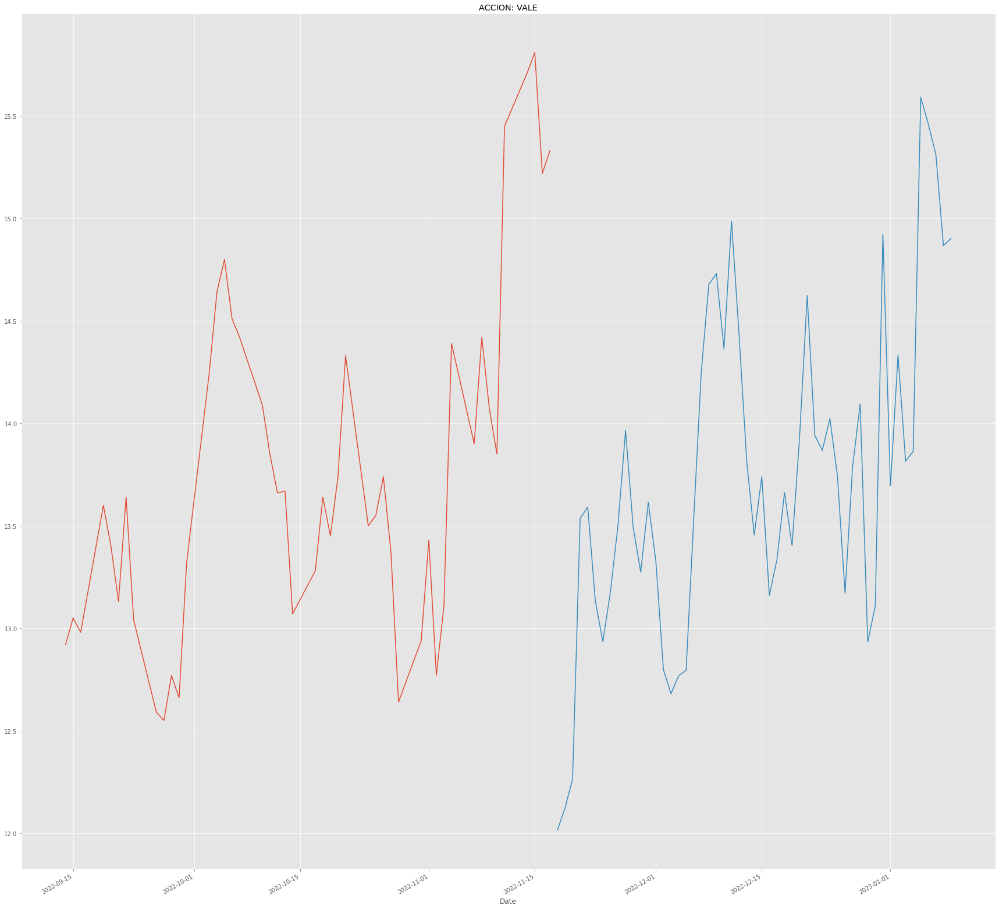


INVERCAP.SN
Date
2022-12-16    2204.414486
2022-12-17    2207.521565
2022-12-18    2210.517492
2022-12-19    2210.990211
2022-12-20    2207.050315
2022-12-21    2273.250918
2022-12-22    2203.470821
2022-12-23    2198.072203
2022-12-24    2212.929508
2022-12-25    2211.228488
2022-12-26    2215.015329
2022-12-27    2196.108313
2022-12-28    2182.141206
2022-12-29    2216.525683
2022-12-30    2213.913781
2022-12-31    2233.539961
2023-01-01    2201.558188
2023-01-02    2168.681347
2023-01-03    2167.039351
2023-01-04    2164.685333
2023-01-05    2233.990436
2023-01-06    2208.779762
2023-01-07    2208.687716
2023-01-08    2242.379831
2023-01-09    2250.117309
2023-01-10    2249.822424
2023-01-11    2252.612642
2023-01-12    2253.860956
2023-01-13    2260.145056
2023-01-14    2240.412923
Name: Forecast, dtype: float64
----------------------


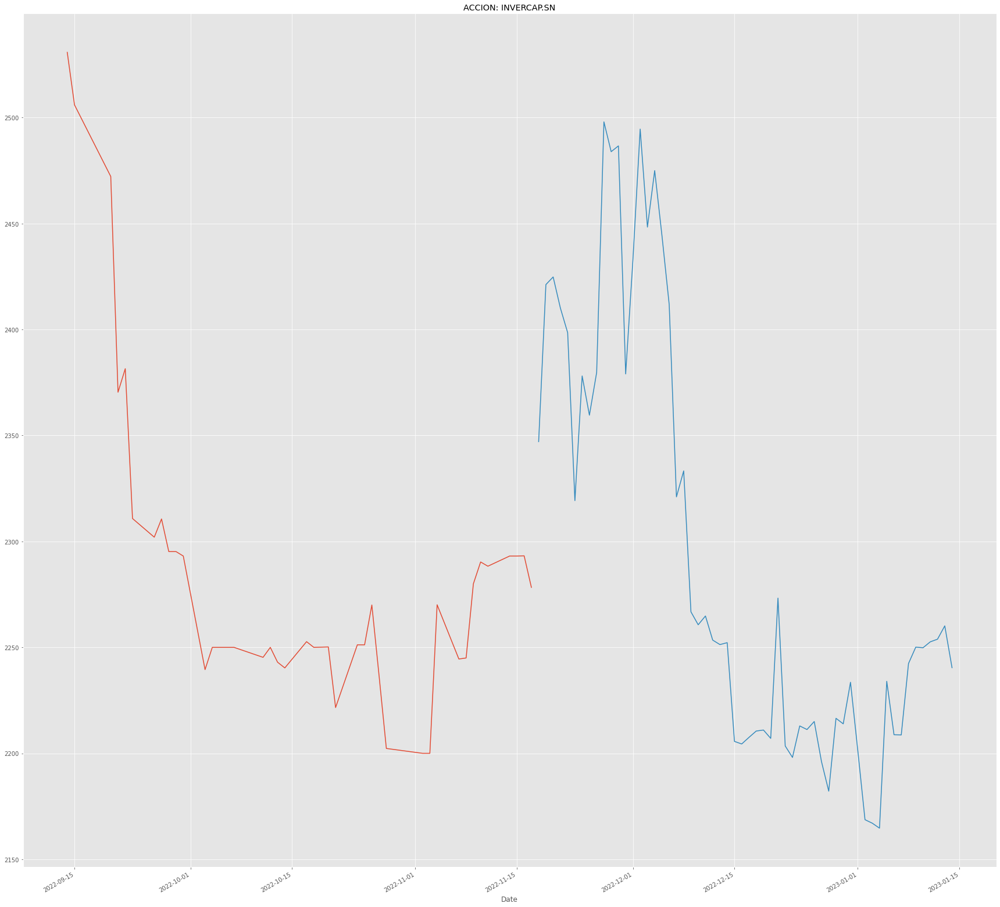


SQM-B.SN
Date
2022-12-16    101953.967645
2022-12-17     99128.185830
2022-12-18     98426.101075
2022-12-19     95125.599275
2022-12-20     93444.443849
2022-12-21     87393.835202
2022-12-22     90449.181684
2022-12-23     89405.739949
2022-12-24     94867.705308
2022-12-25     96354.093991
2022-12-26     97378.882500
2022-12-27    100600.773314
2022-12-28    101017.992350
2022-12-29     99142.201552
2022-12-30    102252.018089
2022-12-31    101451.910651
2023-01-01    100590.386948
2023-01-02     98923.303596
2023-01-03     96767.220542
2023-01-04    100106.044189
2023-01-05     99136.452294
2023-01-06     99836.487765
2023-01-07    105875.477452
2023-01-08    104109.200925
2023-01-09    106396.153198
2023-01-10    109193.395285
2023-01-11    105015.497028
2023-01-12    100585.996442
2023-01-13     99741.750291
2023-01-14     93611.616573
Name: Forecast, dtype: float64
----------------------


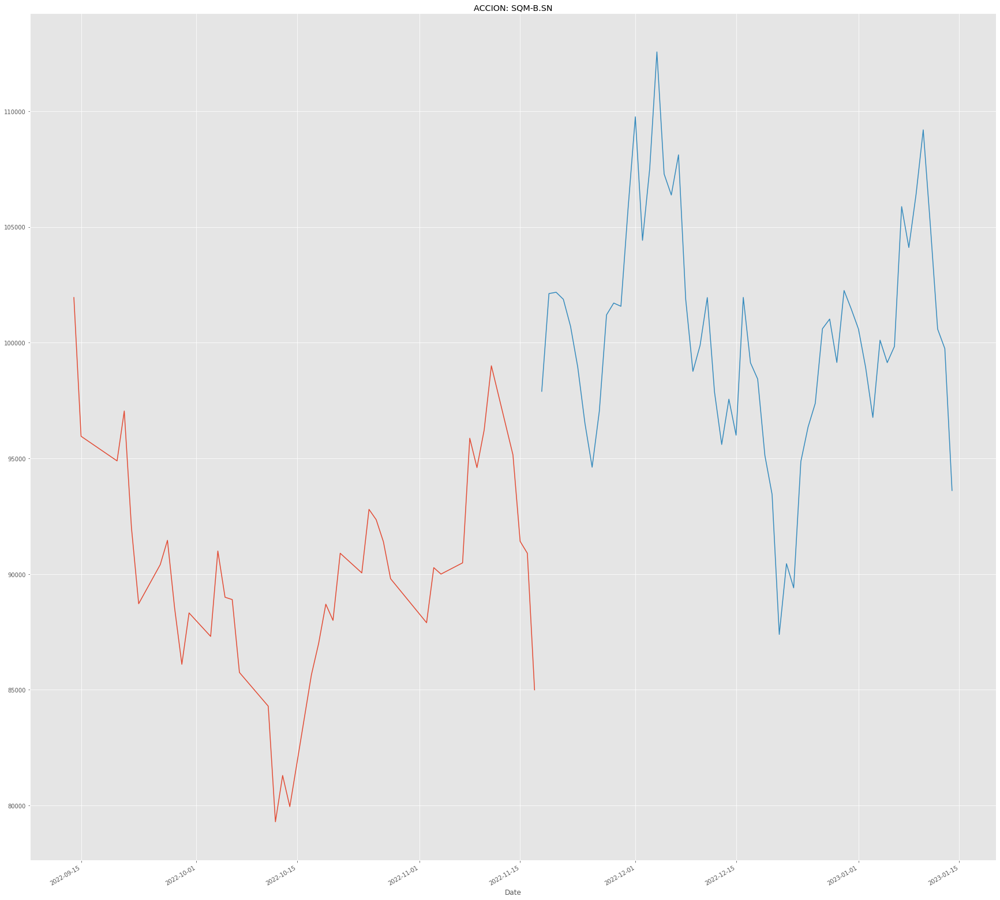


CHILE.SN
Date
2022-11-26    86.940312
2022-11-27    86.003491
2022-11-28    86.285006
2022-11-29    85.068931
2022-11-30    85.449218
2022-12-01    86.597666
2022-12-02    87.206056
2022-12-03    88.181778
2022-12-04    88.598062
2022-12-05    88.013396
2022-12-06    86.586976
2022-12-07    86.711427
2022-12-08    87.693221
2022-12-09    86.874465
2022-12-10    86.572647
2022-12-11    85.796041
2022-12-12    86.088870
2022-12-13    86.369824
2022-12-14    87.904313
2022-12-15    86.755218
2022-12-16    87.259258
2022-12-17    87.084916
2022-12-18    87.063814
2022-12-19    86.365630
2022-12-20    85.076241
2022-12-21    84.611066
2022-12-22    84.586928
2022-12-23    84.024273
2022-12-24    84.522447
2022-12-25    85.047919
Name: Forecast, dtype: float64
----------------------


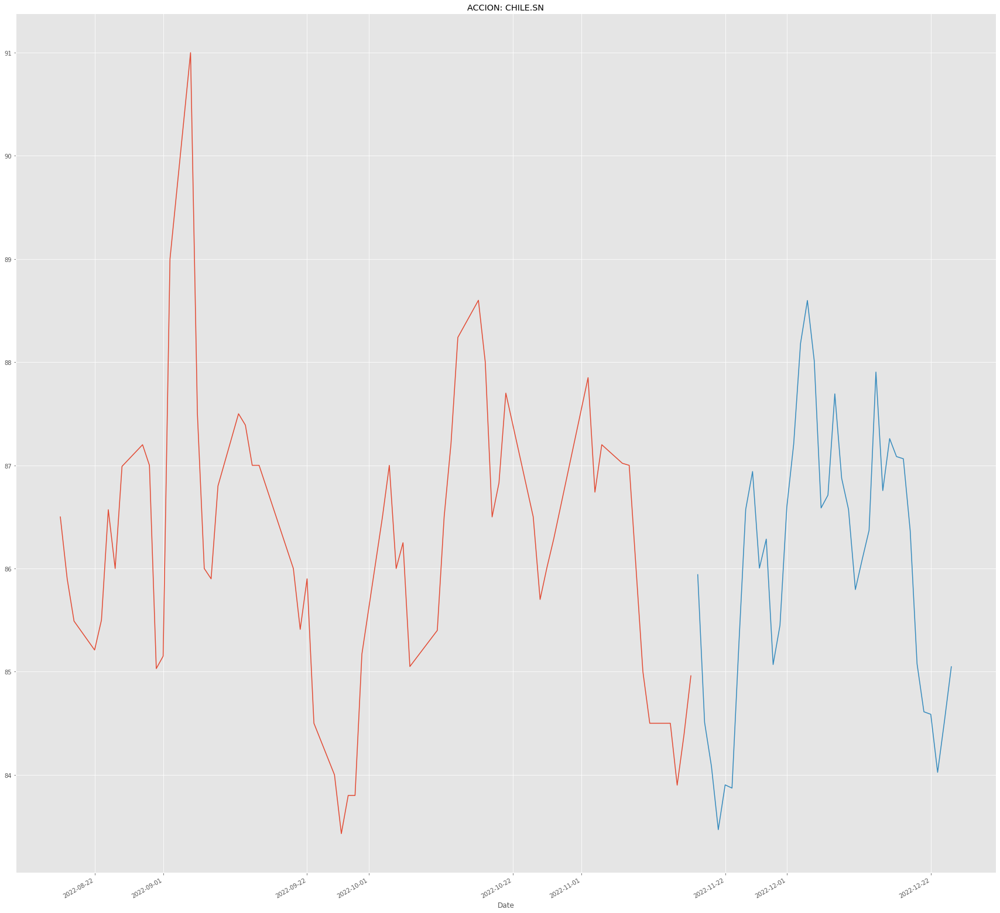


BSANTANDER.SN
Date
2022-12-10    33.787115
2022-12-11    33.799381
2022-12-12    33.273747
2022-12-13    33.132504
2022-12-14    32.915757
2022-12-15    33.402190
2022-12-16    33.326133
2022-12-17    32.850417
2022-12-18    34.410645
2022-12-19    34.465360
2022-12-20    33.530837
2022-12-21    32.721119
2022-12-22    33.565057
2022-12-23    33.584228
2022-12-24    34.021146
2022-12-25    33.890386
2022-12-26    34.194410
2022-12-27    33.646182
2022-12-28    33.551163
2022-12-29    33.049618
2022-12-30    33.173870
2022-12-31    33.534571
2023-01-01    34.554266
2023-01-02    33.765657
2023-01-03    33.702712
2023-01-04    33.776161
2023-01-05    33.643165
2023-01-06    33.248658
2023-01-07    32.976621
2023-01-08    32.907751
Name: Forecast, dtype: float64
----------------------


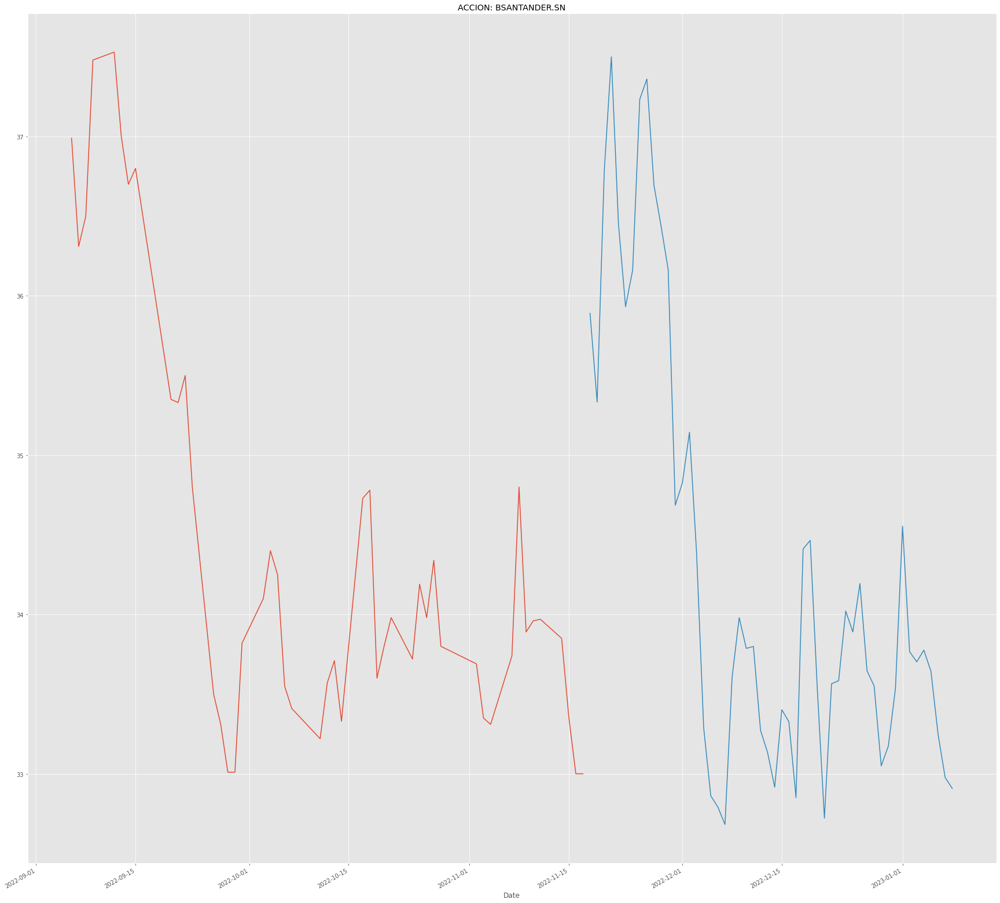


COPEC.SN
Date
2022-12-16    6468.954539
2022-12-17    6411.058522
2022-12-18    6405.682240
2022-12-19    6236.910379
2022-12-20    6051.985608
2022-12-21    6080.656566
2022-12-22    6132.916372
2022-12-23    6103.472938
2022-12-24    6320.930884
2022-12-25    6190.785965
2022-12-26    6190.700944
2022-12-27    6463.298674
2022-12-28    6272.265023
2022-12-29    6180.291098
2022-12-30    6386.229472
2022-12-31    6379.636905
2023-01-01    6557.082159
2023-01-02    6483.939970
2023-01-03    6447.611111
2023-01-04    6342.180180
2023-01-05    6475.561799
2023-01-06    6625.216927
2023-01-07    6840.580418
2023-01-08    6811.115449
2023-01-09    6675.825389
2023-01-10    6553.204504
2023-01-11    6534.162958
2023-01-12    6377.023756
2023-01-13    6350.944998
2023-01-14    6384.175403
Name: Forecast, dtype: float64
----------------------


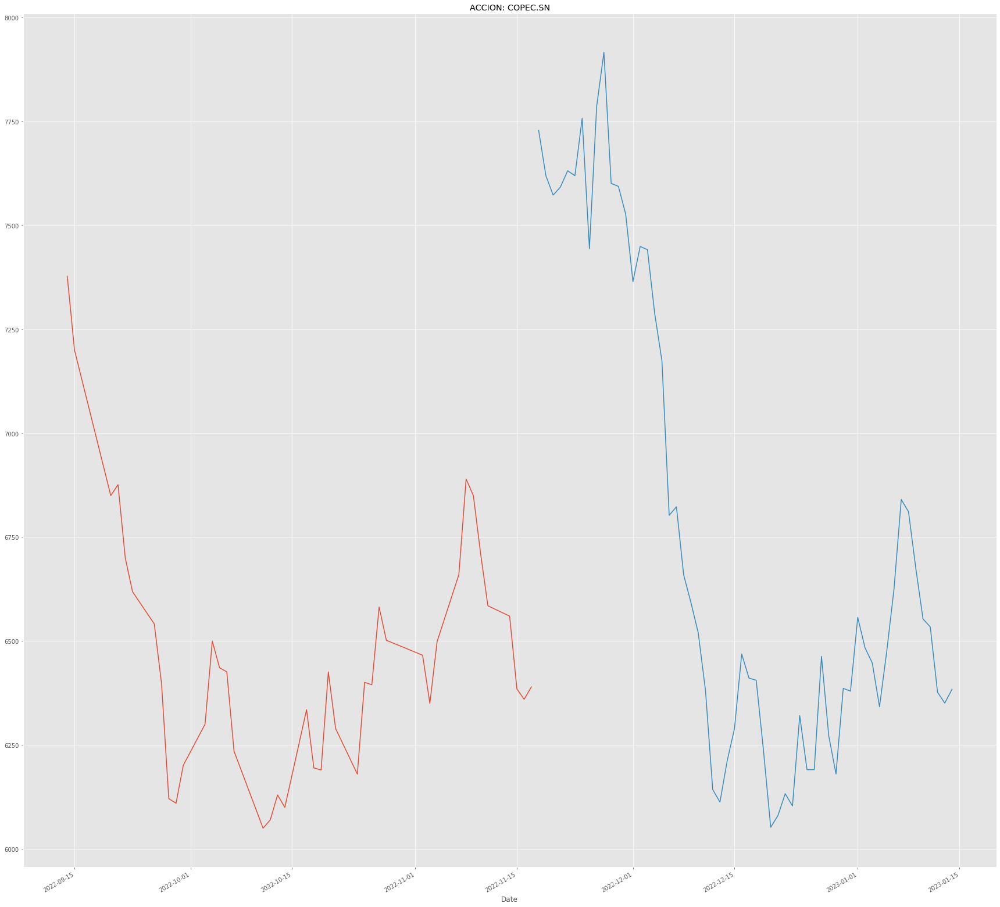


CENCOSUD.SN
Date
2022-12-16    1269.034648
2022-12-17    1268.180913
2022-12-18    1262.058257
2022-12-19    1252.177537
2022-12-20    1202.253095
2022-12-21    1192.303102
2022-12-22    1204.036045
2022-12-23    1212.143508
2022-12-24    1209.767104
2022-12-25    1209.560725
2022-12-26    1191.755012
2022-12-27    1233.290435
2022-12-28    1211.783375
2022-12-29    1213.649288
2022-12-30    1238.372983
2022-12-31    1259.235826
2023-01-01    1261.141211
2023-01-02    1271.760885
2023-01-03    1299.533264
2023-01-04    1296.972131
2023-01-05    1328.781215
2023-01-06    1357.141797
2023-01-07    1365.467722
2023-01-08    1338.247178
2023-01-09    1315.206714
2023-01-10    1301.453137
2023-01-11    1287.825170
2023-01-12    1290.865201
2023-01-13    1296.983522
2023-01-14    1299.285880
Name: Forecast, dtype: float64
----------------------


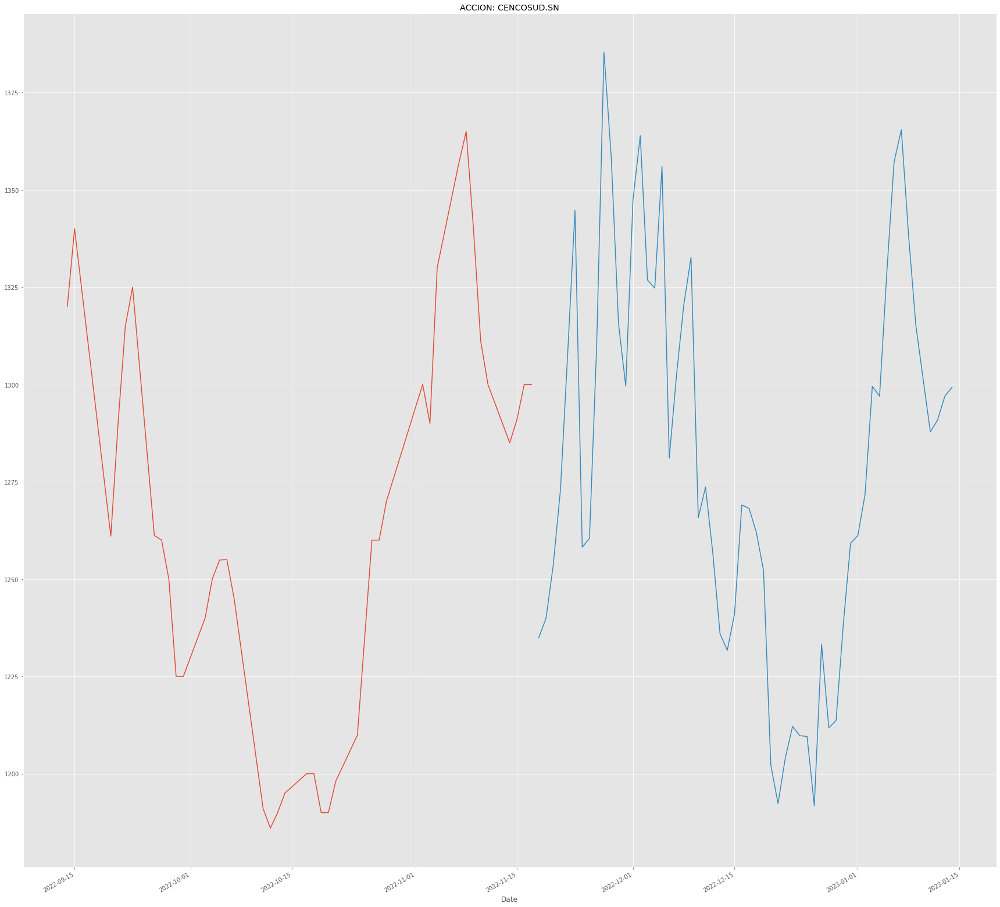


FALABELLA.SN
Date
2022-12-16    1929.624777
2022-12-17    1897.026717
2022-12-18    1954.928210
2022-12-19    1774.969235
2022-12-20    1820.351782
2022-12-21    1812.227443
2022-12-22    1790.851814
2022-12-23    1834.363882
2022-12-24    1852.795207
2022-12-25    1854.665283
2022-12-26    1830.161887
2022-12-27    1767.135569
2022-12-28    1773.599684
2022-12-29    1784.087870
2022-12-30    1815.991862
2022-12-31    1839.320431
2023-01-01    1863.998294
2023-01-02    1879.223978
2023-01-03    1891.847655
2023-01-04    1873.461353
2023-01-05    1882.622849
2023-01-06    1887.660644
2023-01-07    1867.046085
2023-01-08    1829.452224
2023-01-09    1788.429435
2023-01-10    1774.352853
2023-01-11    1722.186062
2023-01-12    1711.015698
2023-01-13    1690.627543
2023-01-14    1644.476294
Name: Forecast, dtype: float64
----------------------


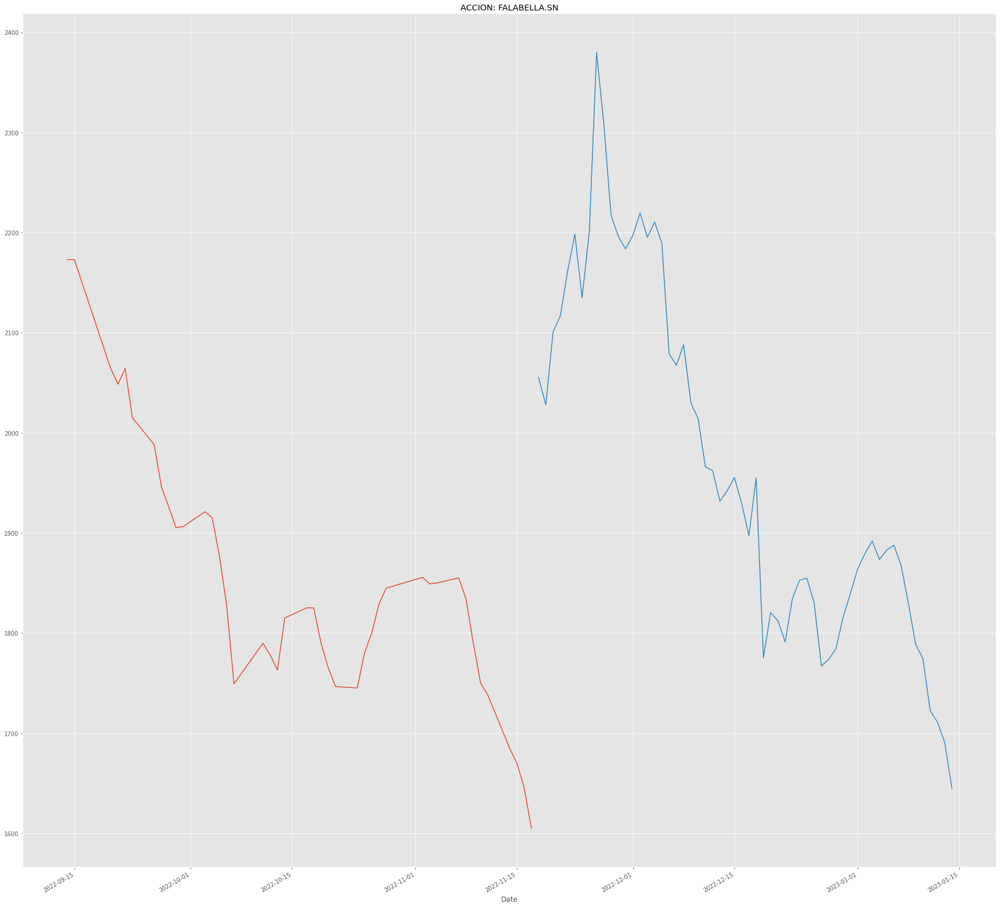


ENELAM.SN
Date
2022-12-16    100.297253
2022-12-17     99.901466
2022-12-18    101.485470
2022-12-19    102.585759
2022-12-20    103.955587
2022-12-21    104.144560
2022-12-22    103.794688
2022-12-23    103.526016
2022-12-24    103.946471
2022-12-25    103.571164
2022-12-26    103.102787
2022-12-27    101.733131
2022-12-28    104.849187
2022-12-29     97.925538
2022-12-30     98.065605
2022-12-31     94.146367
2023-01-01     92.349377
2023-01-02     92.748968
2023-01-03     95.089538
2023-01-04     93.462442
2023-01-05     93.783779
2023-01-06     94.056833
2023-01-07     95.253543
2023-01-08     95.184009
2023-01-09     94.179687
2023-01-10     94.061756
2023-01-11     93.412637
2023-01-12     94.124054
2023-01-13     91.782833
2023-01-14     90.033809
Name: Forecast, dtype: float64
----------------------


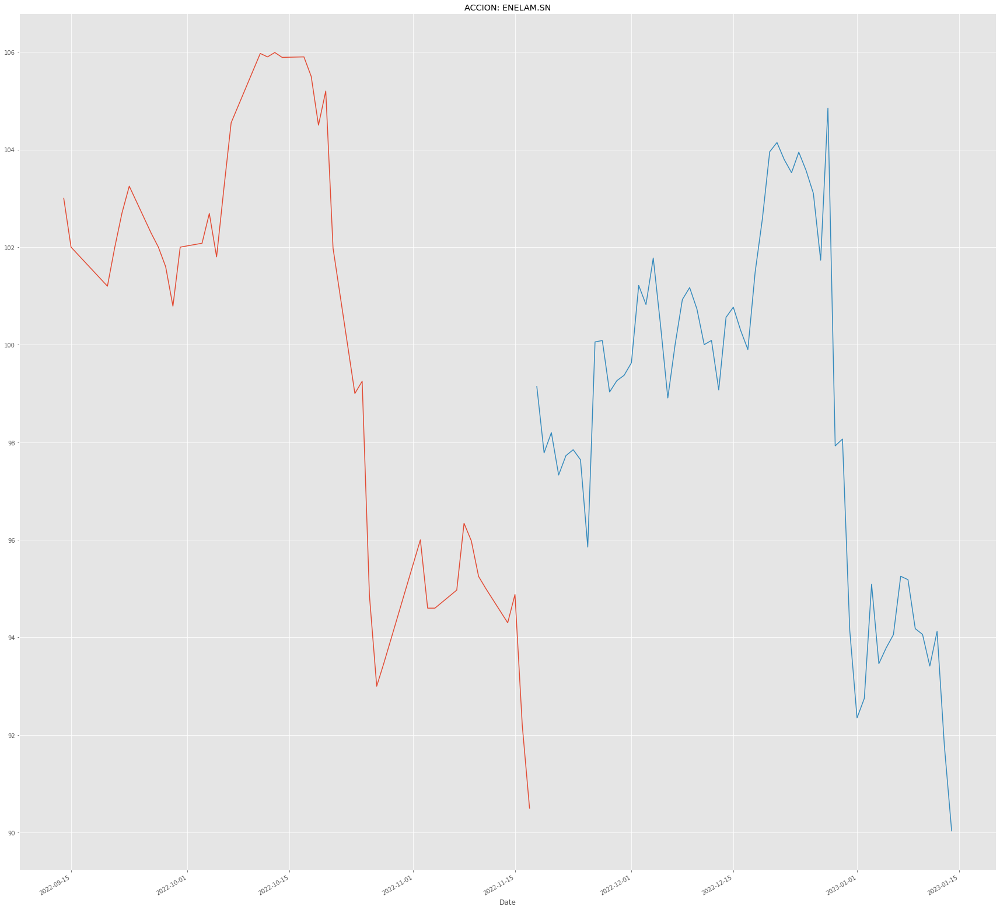


CMPC.SN
Date
2022-12-16    1512.580514
2022-12-17    1488.231409
2022-12-18    1501.486294
2022-12-19    1475.466170
2022-12-20    1380.533573
2022-12-21    1408.372446
2022-12-22    1369.214572
2022-12-23    1343.910675
2022-12-24    1362.872655
2022-12-25    1372.143880
2022-12-26    1372.352891
2022-12-27    1349.357436
2022-12-28    1391.228094
2022-12-29    1448.787672
2022-12-30    1418.982708
2022-12-31    1446.559150
2023-01-01    1477.474988
2023-01-02    1484.217226
2023-01-03    1458.775602
2023-01-04    1471.515324
2023-01-05    1491.314681
2023-01-06    1550.245830
2023-01-07    1617.849364
2023-01-08    1592.959268
2023-01-09    1557.482713
2023-01-10    1529.432923
2023-01-11    1542.497989
2023-01-12    1512.204263
2023-01-13    1498.088924
2023-01-14    1508.802590
Name: Forecast, dtype: float64
----------------------


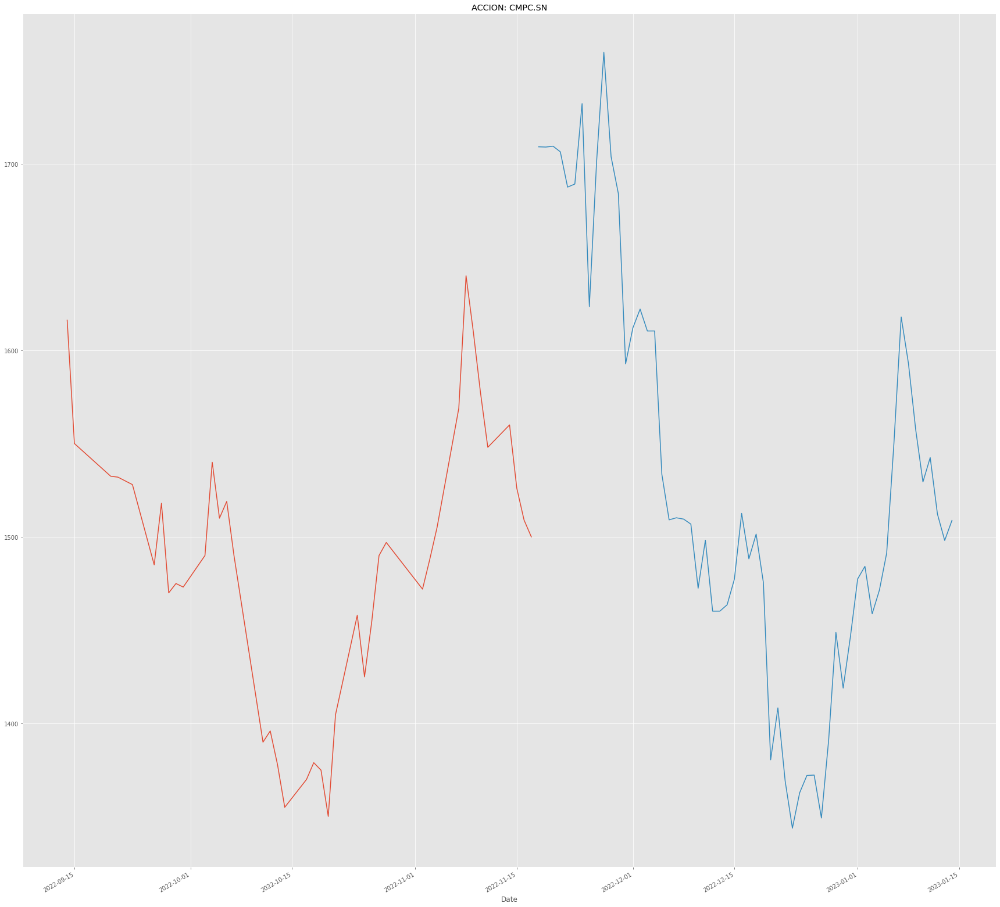


BCI.SN
Date
2022-11-26    25409.210932
2022-11-27    25358.412605
2022-11-28    25644.358280
2022-11-29    25007.872811
2022-11-30    24124.205598
2022-12-01    23791.447222
2022-12-02    23824.661654
2022-12-03    24084.189842
2022-12-04    25400.806192
2022-12-05    26074.003725
2022-12-06    25559.091078
2022-12-07    25604.082703
2022-12-08    25998.416933
2022-12-09    25928.278486
2022-12-10    26302.348546
2022-12-11    26232.538635
2022-12-12    26147.441322
2022-12-13    26204.530449
2022-12-14    26067.903086
2022-12-15    25326.753178
2022-12-16    25659.412324
2022-12-17    26106.243004
2022-12-18    26197.529570
2022-12-19    26128.981359
2022-12-20    25948.124746
2022-12-21    25911.364422
2022-12-22    25668.646603
2022-12-23    25872.047523
2022-12-24    25953.973458
2022-12-25    26074.662112
Name: Forecast, dtype: float64
----------------------


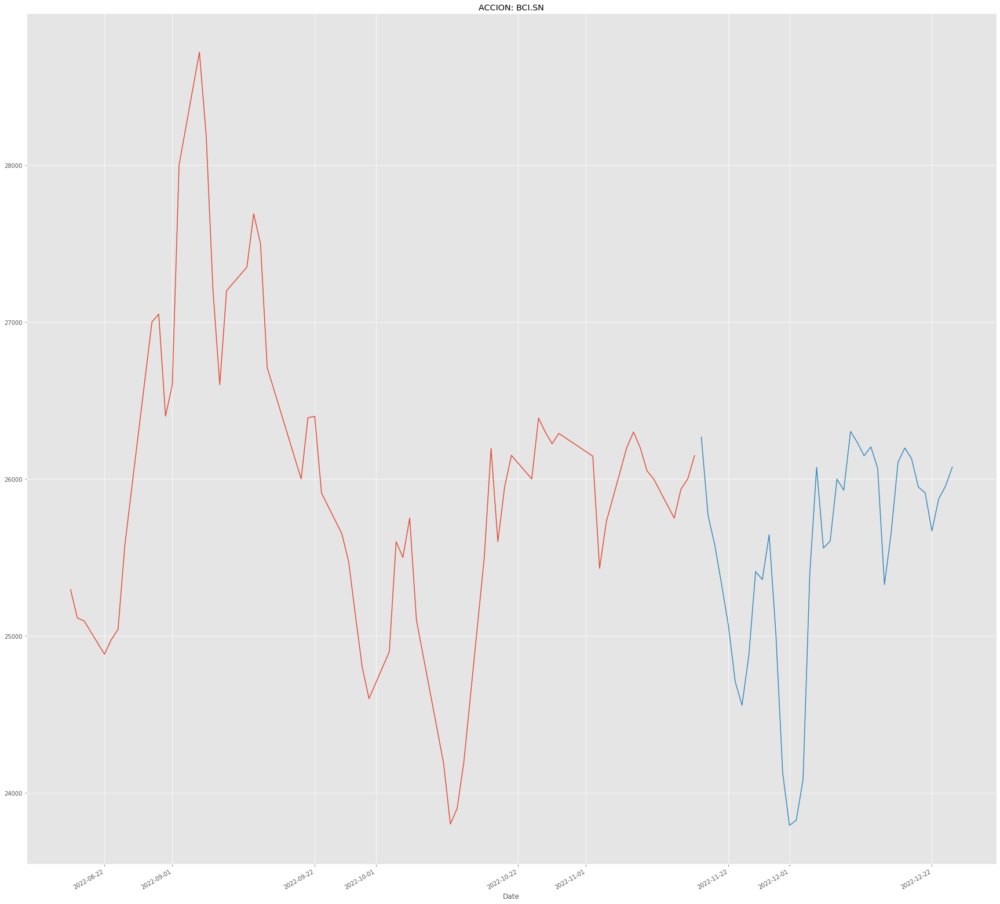


VAPORES.SN
Date
2022-12-16    76.176189
2022-12-17    73.468455
2022-12-18    73.107813
2022-12-19    68.847823
2022-12-20    67.250818
2022-12-21    63.452465
2022-12-22    63.347430
2022-12-23    64.579360
2022-12-24    66.411573
2022-12-25    65.187813
2022-12-26    64.338016
2022-12-27    76.599953
2022-12-28    70.801915
2022-12-29    66.260327
2022-12-30    66.332358
2022-12-31    65.873280
2023-01-01    68.021929
2023-01-02    67.634387
2023-01-03    66.178312
2023-01-04    65.072801
2023-01-05    66.740963
2023-01-06    71.643165
2023-01-07    74.753330
2023-01-08    72.245816
2023-01-09    73.372078
2023-01-10    74.361105
2023-01-11    75.729251
2023-01-12    73.668079
2023-01-13    73.728445
2023-01-14    73.969854
Name: Forecast, dtype: float64
----------------------


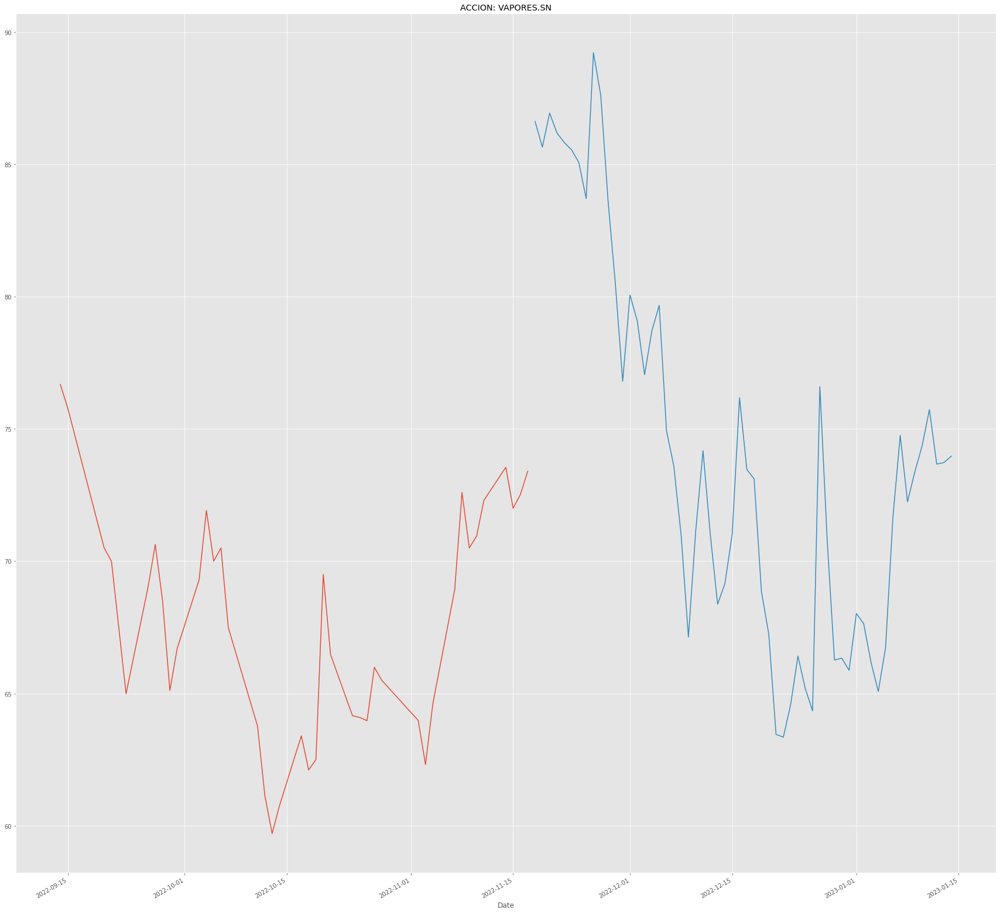


CAP.SN
Date
2022-12-16    6489.941423
2022-12-17    6291.159565
2022-12-18    6186.547525
2022-12-19    6092.810384
2022-12-20    5819.257867
2022-12-21    5685.422664
2022-12-22    5546.772014
2022-12-23    5629.018403
2022-12-24    5624.267389
2022-12-25    5718.144479
2022-12-26    5680.272094
2022-12-27    5460.192241
2022-12-28    5488.750106
2022-12-29    5456.253876
2022-12-30    5371.652849
2022-12-31    5329.898580
2023-01-01    5226.894535
2023-01-02    5097.506510
2023-01-03    5209.844302
2023-01-04    5108.444303
2023-01-05    5519.934697
2023-01-06    5472.555811
2023-01-07    5619.324510
2023-01-08    5571.415928
2023-01-09    5795.422032
2023-01-10    6021.177548
2023-01-11    6053.472754
2023-01-12    6253.384409
2023-01-13    6628.556694
2023-01-14    6157.141779
Name: Forecast, dtype: float64
----------------------


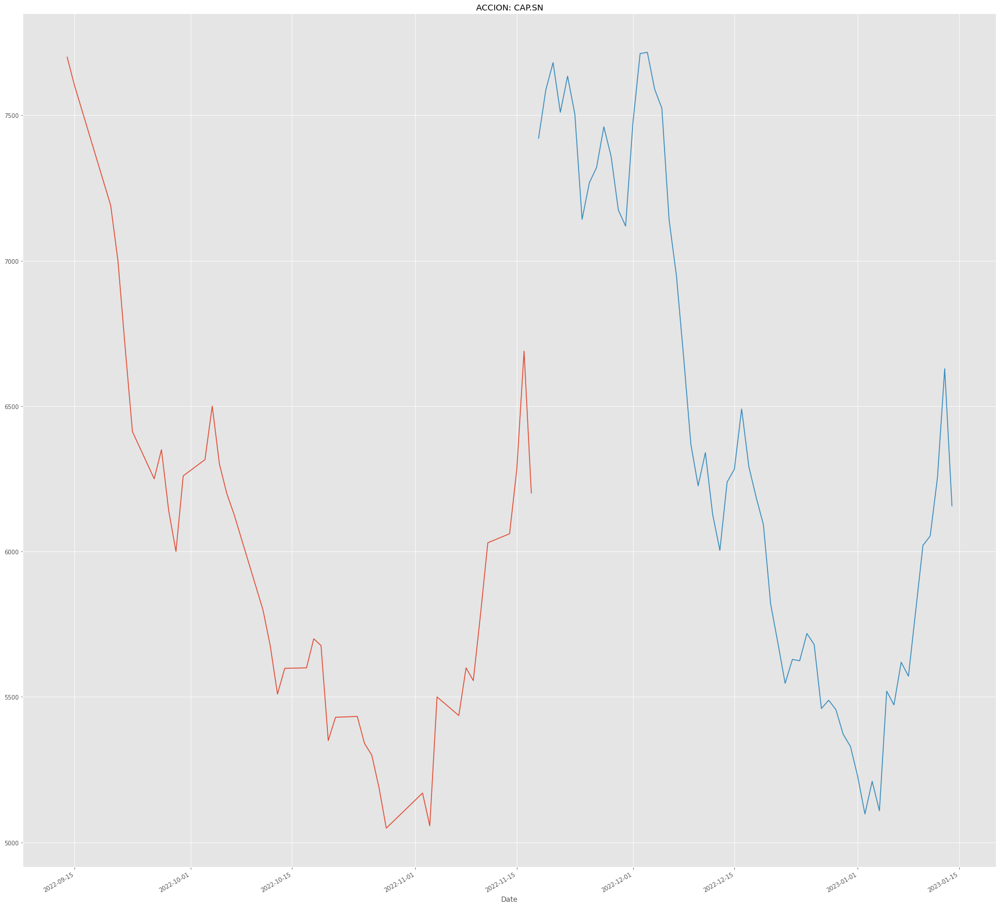


CCU.SN
Date
2022-12-16    5148.167940
2022-12-17    5098.775944
2022-12-18    5233.019749
2022-12-19    5003.663582
2022-12-20    4866.675624
2022-12-21    4896.955674
2022-12-22    4998.049422
2022-12-23    5001.783253
2022-12-24    5188.902396
2022-12-25    5278.015963
2022-12-26    5200.516852
2022-12-27    5191.915388
2022-12-28    5132.799567
2022-12-29    5063.805839
2022-12-30    5059.713005
2022-12-31    5024.200727
2023-01-01    5053.038567
2023-01-02    5176.301590
2023-01-03    5230.290429
2023-01-04    5179.581265
2023-01-05    5199.828322
2023-01-06    5189.924991
2023-01-07    5224.726918
2023-01-08    5161.911428
2023-01-09    5056.301425
2023-01-10    5102.645605
2023-01-11    5104.490185
2023-01-12    5175.547387
2023-01-13    5211.375123
2023-01-14    5200.207287
Name: Forecast, dtype: float64
----------------------


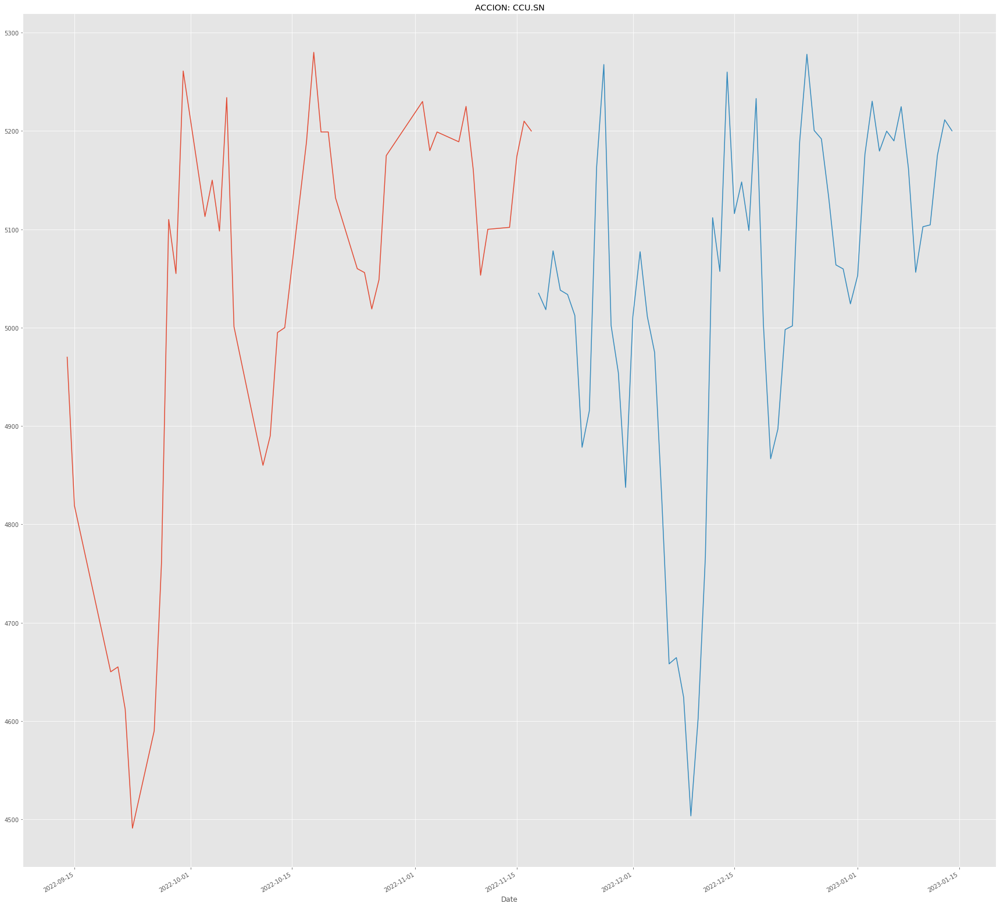


ENELCHILE.SN
Date
2022-10-28          NaN
2022-11-02          NaN
2022-11-03          NaN
2022-11-04          NaN
2022-11-07          NaN
2022-11-08          NaN
2022-11-09          NaN
2022-11-10          NaN
2022-11-11          NaN
2022-11-14          NaN
2022-11-15          NaN
2022-11-16          NaN
2022-11-17          NaN
2022-11-18    29.996767
2022-11-19    30.480353
2022-11-20    30.696099
2022-11-21    32.049485
2022-11-22    33.547231
2022-11-23    34.405203
2022-11-24    34.331496
2022-11-25    34.077779
2022-11-26    35.238841
2022-11-27    35.047861
2022-11-28    34.638363
2022-11-29    33.744697
2022-11-30    33.959743
2022-12-01    34.276060
2022-12-02    33.354211
2022-12-03    33.383248
2022-12-04    34.925891
Name: Forecast, dtype: float64
----------------------


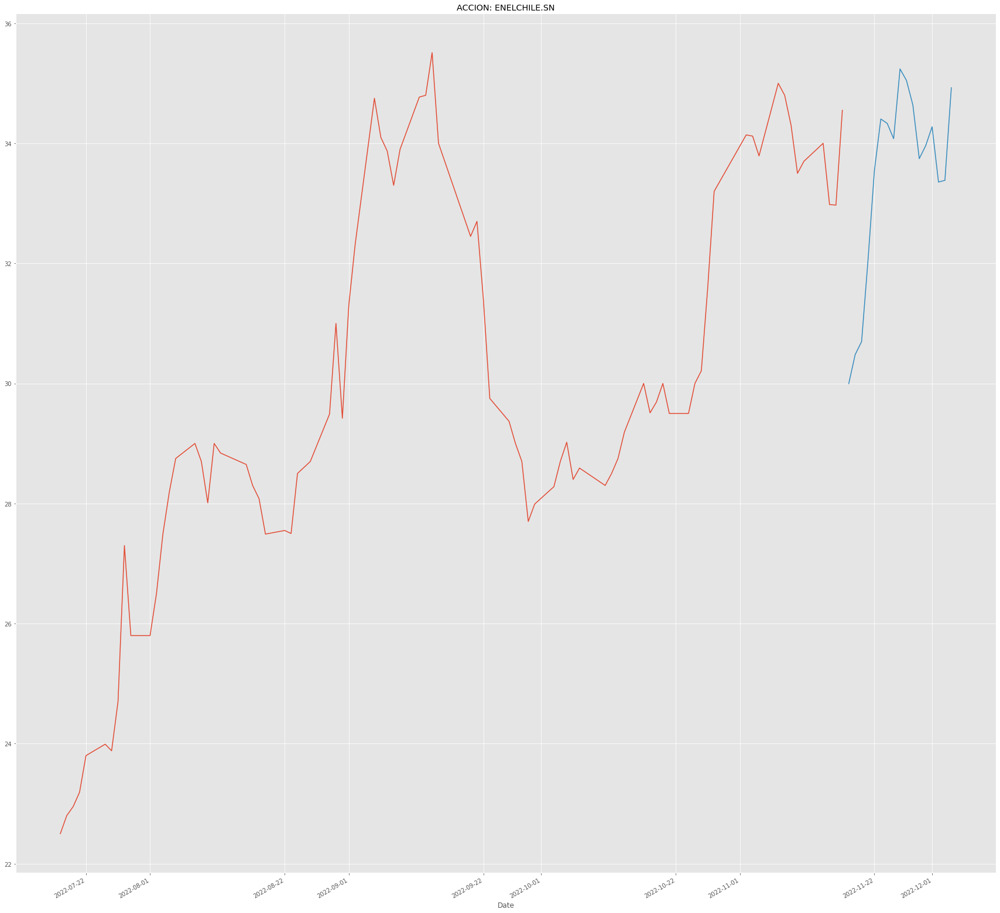


ANDINA-B.SN
Date
2022-12-16    1664.045403
2022-12-17    1631.498274
2022-12-18    1647.991912
2022-12-19    1616.054803
2022-12-20    1613.364144
2022-12-21    1639.763632
2022-12-22    1645.277999
2022-12-23    1639.066283
2022-12-24    1623.379651
2022-12-25    1608.256478
2022-12-26    1605.865364
2022-12-27    1610.173733
2022-12-28    1613.897794
2022-12-29    1611.313604
2022-12-30    1647.058361
2022-12-31    1635.201930
2023-01-01    1663.630253
2023-01-02    1644.193684
2023-01-03    1656.784296
2023-01-04    1643.090520
2023-01-05    1644.145456
2023-01-06    1665.549025
2023-01-07    1680.361500
2023-01-08    1653.928196
2023-01-09    1677.514489
2023-01-10    1664.406927
2023-01-11    1666.381338
2023-01-12    1691.471836
2023-01-13    1692.596578
2023-01-14    1719.999627
Name: Forecast, dtype: float64
----------------------


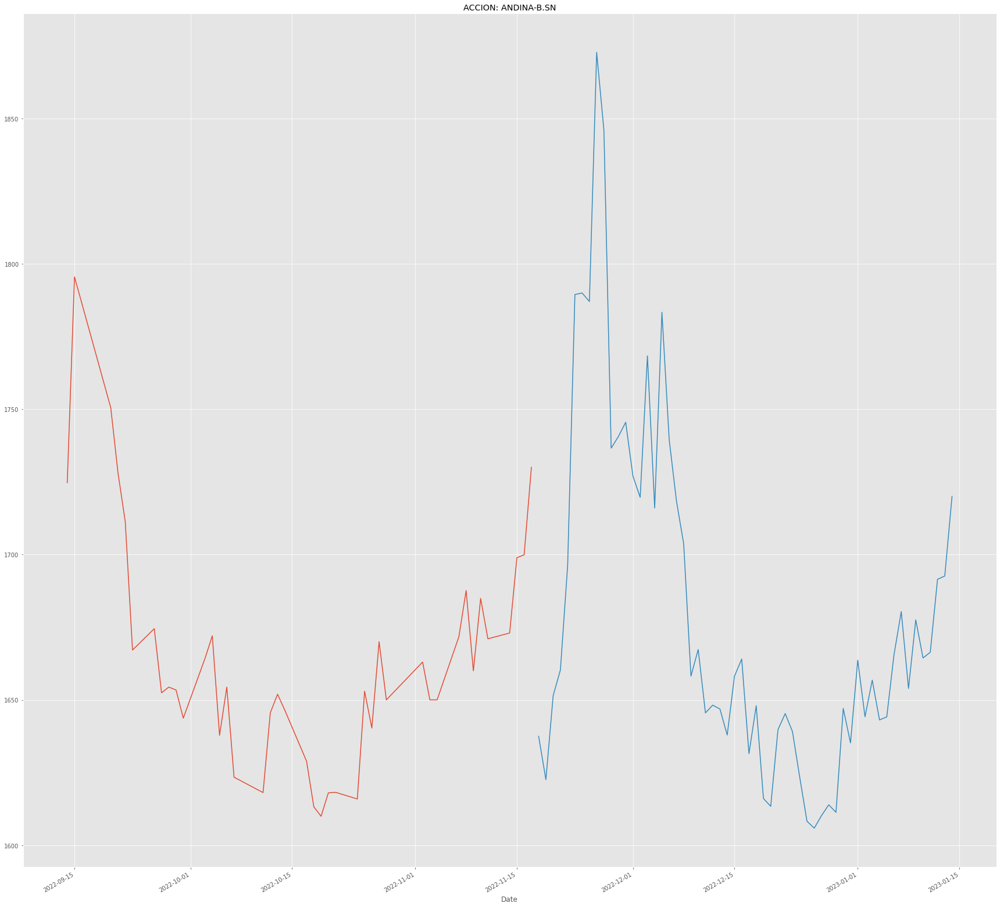


CONCHATORO.SN
Date
2022-12-16    1079.281190
2022-12-17    1075.994990
2022-12-18    1067.710369
2022-12-19    1055.046693
2022-12-20    1033.828346
2022-12-21    1045.247663
2022-12-22    1034.210940
2022-12-23    1032.974044
2022-12-24    1041.089658
2022-12-25    1050.492386
2022-12-26    1043.972934
2022-12-27    1049.806723
2022-12-28    1041.888678
2022-12-29    1035.018664
2022-12-30    1043.006397
2022-12-31    1057.935498
2023-01-01    1071.693375
2023-01-02    1059.242475
2023-01-03    1046.501338
2023-01-04    1054.107747
2023-01-05    1043.923110
2023-01-06    1070.036195
2023-01-07    1072.597736
2023-01-08    1067.774929
2023-01-09    1046.245472
2023-01-10    1034.141214
2023-01-11    1047.658805
2023-01-12    1058.518273
2023-01-13    1064.399798
2023-01-14    1066.241928
Name: Forecast, dtype: float64
----------------------


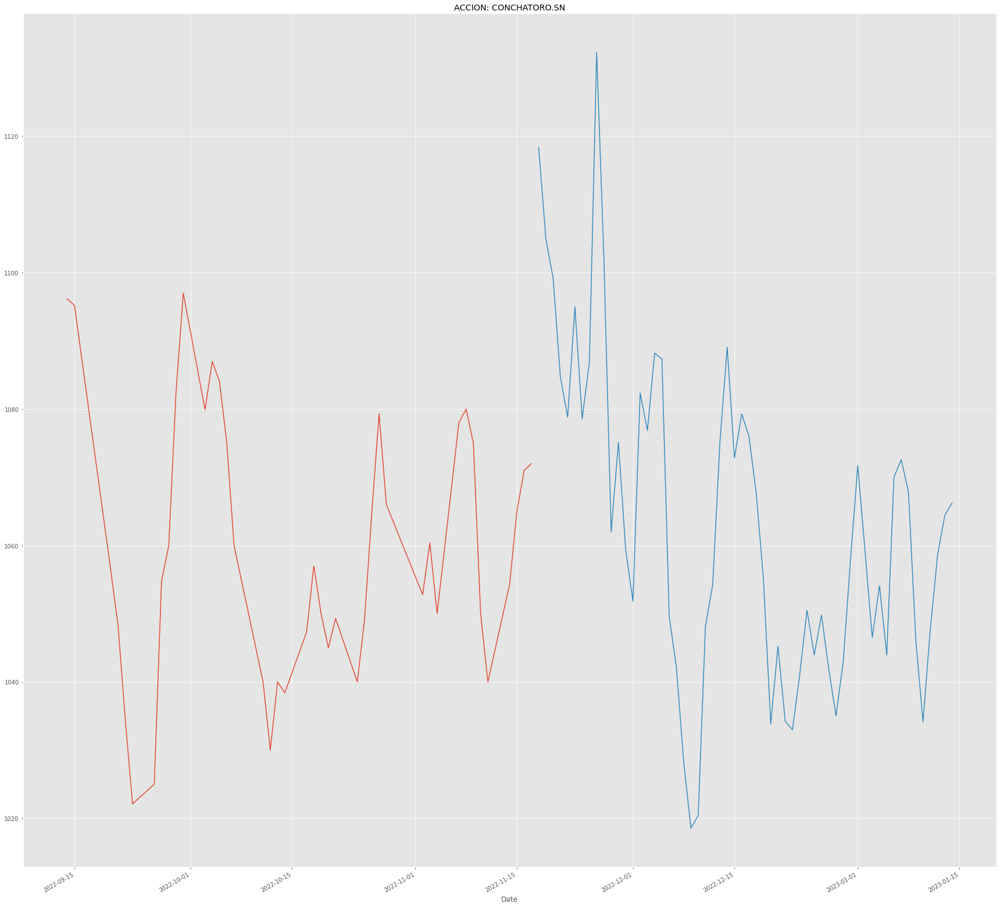


PARAUCO.SN
Date
2022-12-16    809.514440
2022-12-17    792.296955
2022-12-18    800.414653
2022-12-19    764.315674
2022-12-20    756.797875
2022-12-21    750.890669
2022-12-22    759.846641
2022-12-23    767.891546
2022-12-24    783.060184
2022-12-25    793.452829
2022-12-26    790.578830
2022-12-27    734.853473
2022-12-28    765.329319
2022-12-29    752.579155
2022-12-30    761.149685
2022-12-31    754.857597
2023-01-01    770.527130
2023-01-02    799.384967
2023-01-03    812.960277
2023-01-04    796.085868
2023-01-05    831.785253
2023-01-06    863.467279
2023-01-07    868.464397
2023-01-08    898.450659
2023-01-09    930.483243
2023-01-10    921.156138
2023-01-11    924.538192
2023-01-12    927.766451
2023-01-13    952.446932
2023-01-14    955.243710
Name: Forecast, dtype: float64
----------------------


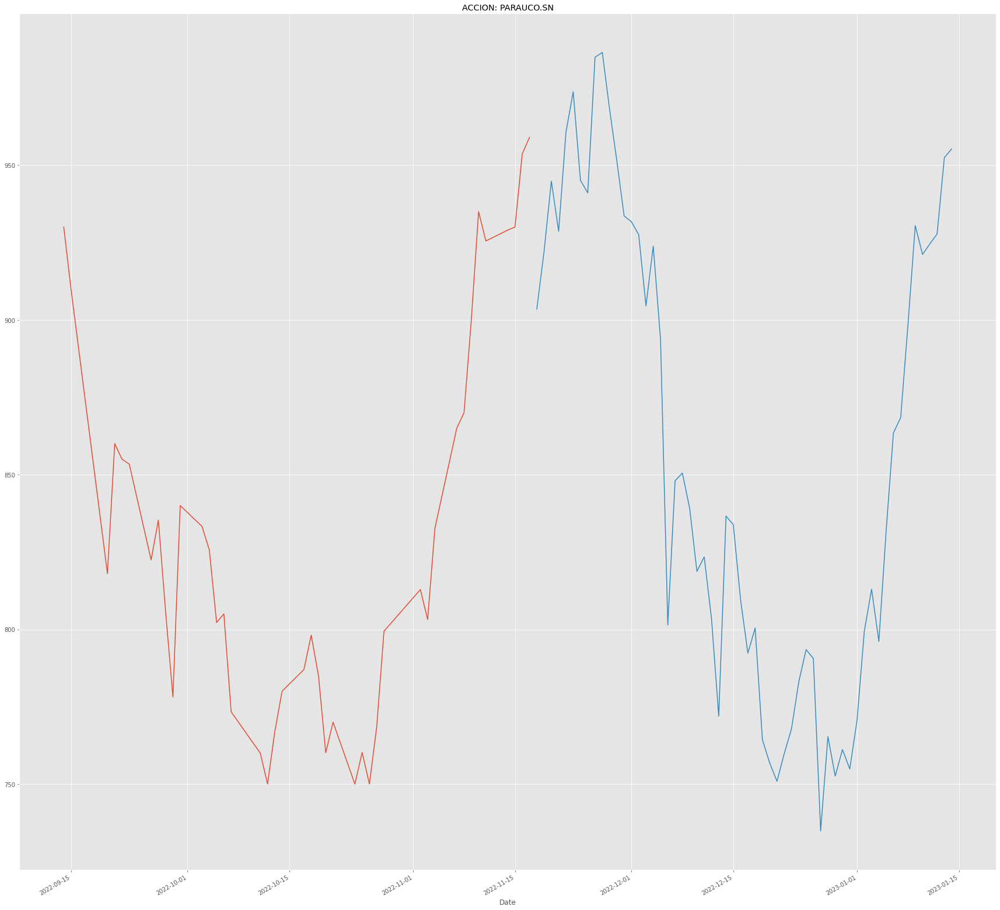


ITAUCORP.SN
Date
2022-12-09    1.949143
2022-12-10    1.960311
2022-12-11    1.926442
2022-12-12    1.884841
2022-12-13    1.837875
2022-12-14    1.832762
2022-12-15    1.908375
2022-12-16    1.905062
2022-12-17    1.898662
2022-12-18    1.901719
2022-12-19    1.864763
2022-12-20    1.960291
2022-12-21    1.915860
2022-12-22    1.874772
2022-12-23    1.856390
2022-12-24    1.910072
2022-12-25    1.882749
2022-12-26    1.895096
2022-12-27    1.875575
2022-12-28    1.887861
2022-12-29    1.904422
2022-12-30    1.931285
2022-12-31    1.979155
2023-01-01    1.963126
2023-01-02    1.983572
2023-01-03    1.993390
2023-01-04    1.994480
2023-01-05    1.972587
2023-01-06    1.976378
2023-01-07    1.947716
Name: Forecast, dtype: float64
----------------------


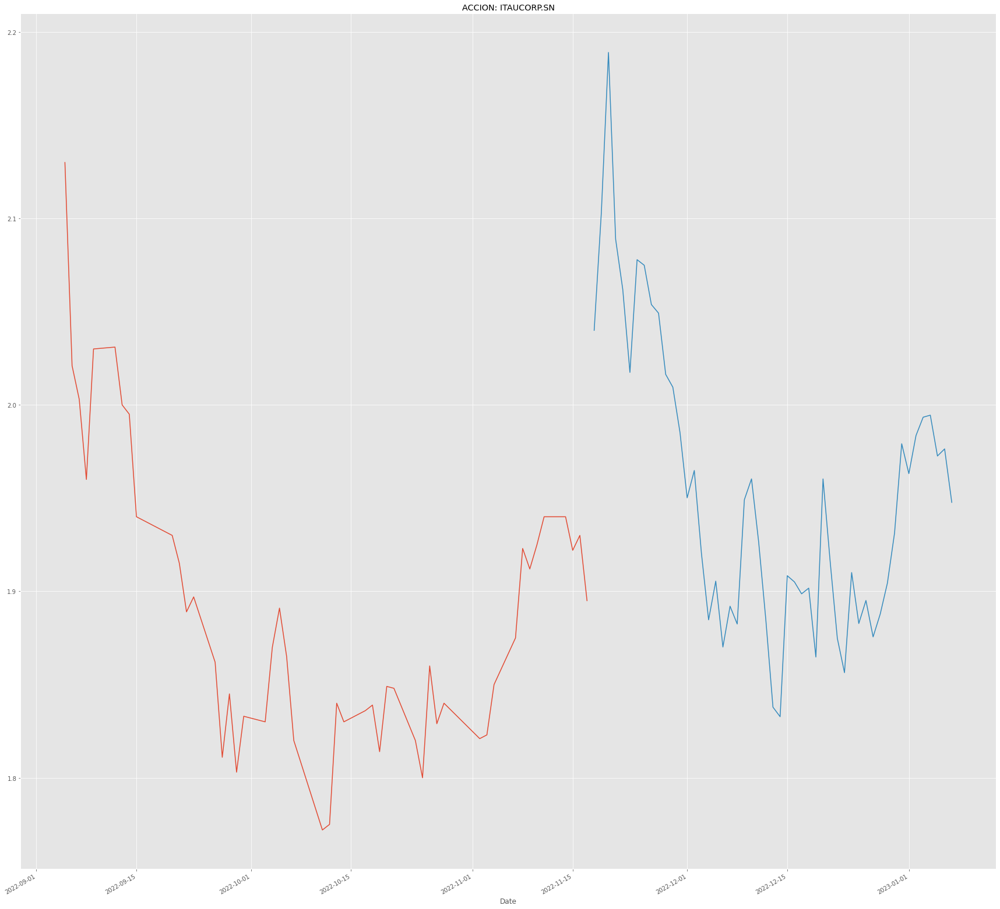


AGUAS-A.SN
Date
2022-12-16    191.585383
2022-12-17    189.746346
2022-12-18    191.959751
2022-12-19    193.763909
2022-12-20    190.708583
2022-12-21    188.744722
2022-12-22    188.730577
2022-12-23    190.953059
2022-12-24    193.732869
2022-12-25    193.725367
2022-12-26    192.093808
2022-12-27    192.562755
2022-12-28    192.894317
2022-12-29    192.641985
2022-12-30    193.153160
2022-12-31    194.515745
2023-01-01    198.531441
2023-01-02    199.526162
2023-01-03    199.518405
2023-01-04    198.672006
2023-01-05    197.067490
2023-01-06    198.577242
2023-01-07    199.542713
2023-01-08    198.529355
2023-01-09    198.634604
2023-01-10    198.560827
2023-01-11    197.596183
2023-01-12    198.527823
2023-01-13    198.369420
2023-01-14    197.576169
Name: Forecast, dtype: float64
----------------------


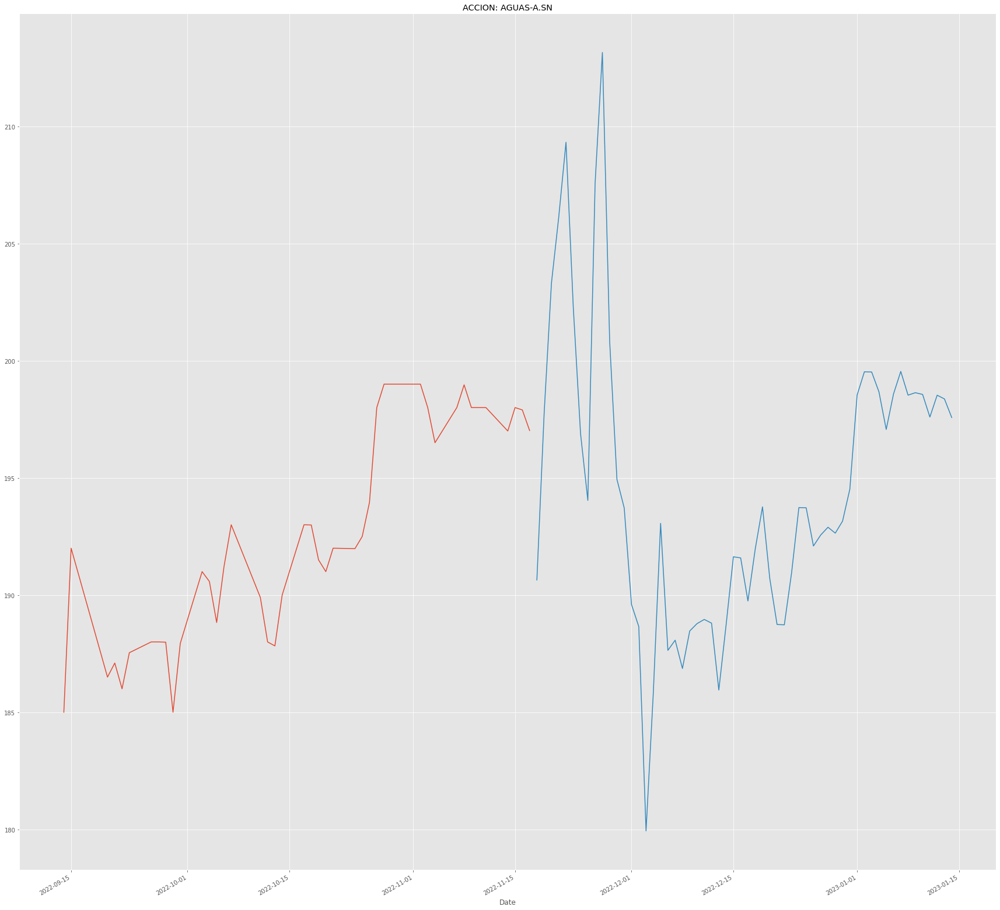


COLBUN.SN
Date
2022-12-16    83.999492
2022-12-17    84.368489
2022-12-18    83.668300
2022-12-19    82.048533
2022-12-20    80.525788
2022-12-21    80.504173
2022-12-22    80.059001
2022-12-23    81.235414
2022-12-24    83.327714
2022-12-25    84.608651
2022-12-26    86.285139
2022-12-27    88.244183
2022-12-28    88.201202
2022-12-29    86.498555
2022-12-30    87.238324
2022-12-31    87.460008
2023-01-01    90.259526
2023-01-02    93.735388
2023-01-03    94.474219
2023-01-04    94.289706
2023-01-05    93.629951
2023-01-06    94.528860
2023-01-07    92.866671
2023-01-08    92.598497
2023-01-09    92.111093
2023-01-10    90.918347
2023-01-11    90.262539
2023-01-12    88.855710
2023-01-13    88.100585
2023-01-14    87.279121
Name: Forecast, dtype: float64
----------------------


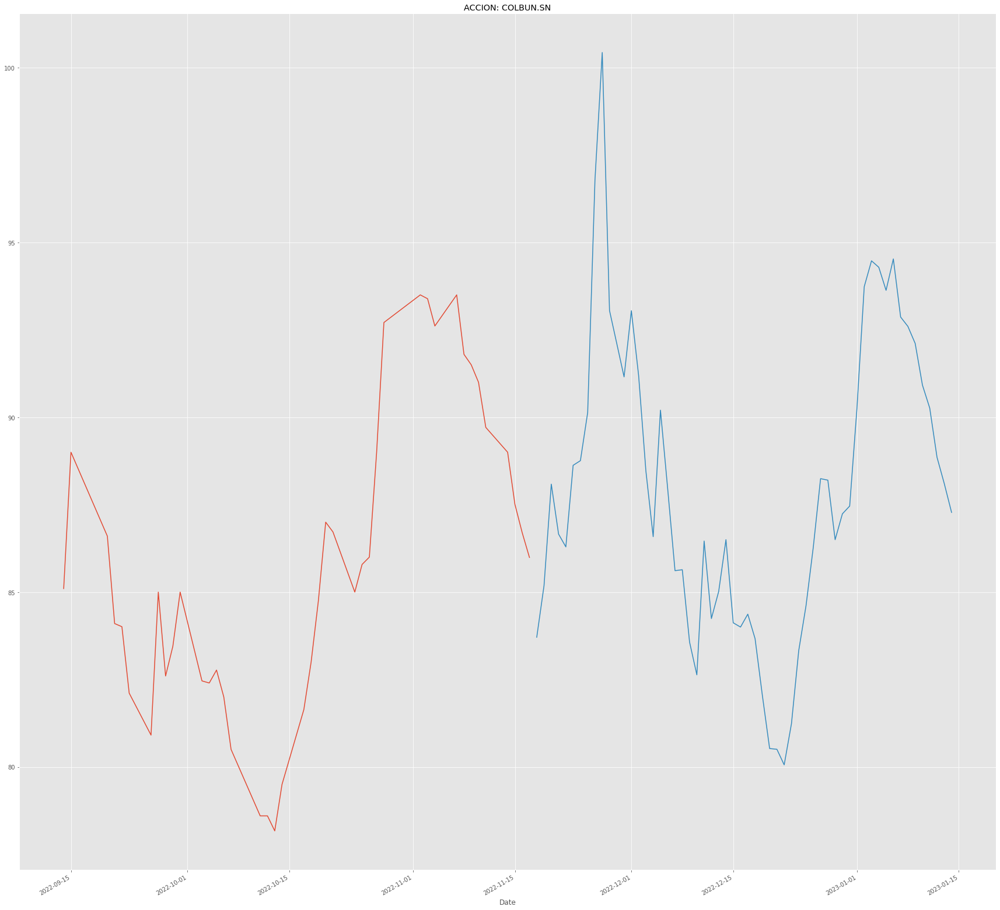


CENCOSHOPP.SN
Date
2022-10-18            NaN
2022-10-19            NaN
2022-10-20            NaN
2022-10-21            NaN
2022-10-24            NaN
2022-10-25            NaN
2022-10-26            NaN
2022-10-27            NaN
2022-10-28            NaN
2022-11-02            NaN
2022-11-03            NaN
2022-11-04            NaN
2022-11-07            NaN
2022-11-08            NaN
2022-11-09            NaN
2022-11-10            NaN
2022-11-11            NaN
2022-11-14            NaN
2022-11-15            NaN
2022-11-16            NaN
2022-11-17            NaN
2022-11-18    1018.297518
2022-11-19    1025.128466
2022-11-20    1091.252793
2022-11-21    1114.805918
2022-11-22    1124.858702
2022-11-23    1138.033431
2022-11-24    1163.347654
2022-11-25    1174.522000
2022-11-26    1160.290189
Name: Forecast, dtype: float64
----------------------


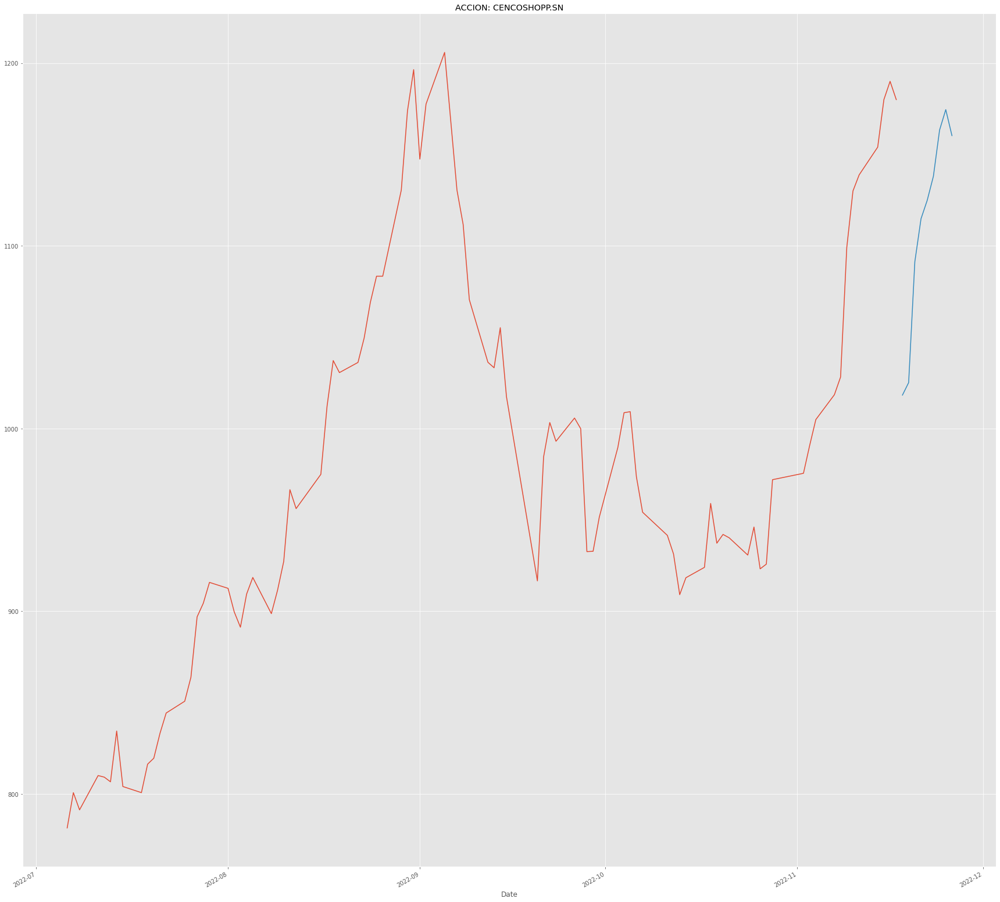


ENTEL.SN
Date
2022-12-16    2892.298678
2022-12-17    2886.313195
2022-12-18    2828.005401
2022-12-19    2790.582621
2022-12-20    2695.793344
2022-12-21    2675.169298
2022-12-22    2738.580745
2022-12-23    2805.622492
2022-12-24    2758.068457
2022-12-25    2813.516418
2022-12-26    2761.653913
2022-12-27    3310.356227
2022-12-28    3020.501289
2022-12-29    2953.677284
2022-12-30    2923.641439
2022-12-31    2911.946780
2023-01-01    2988.342989
2023-01-02    2988.855781
2023-01-03    2993.444200
2023-01-04    3033.617681
2023-01-05    3011.096959
2023-01-06    3024.822507
2023-01-07    3059.127171
2023-01-08    2979.062988
2023-01-09    2998.587302
2023-01-10    2975.059317
2023-01-11    2955.185494
2023-01-12    2885.550192
2023-01-13    2864.925240
2023-01-14    2873.208313
Name: Forecast, dtype: float64
----------------------


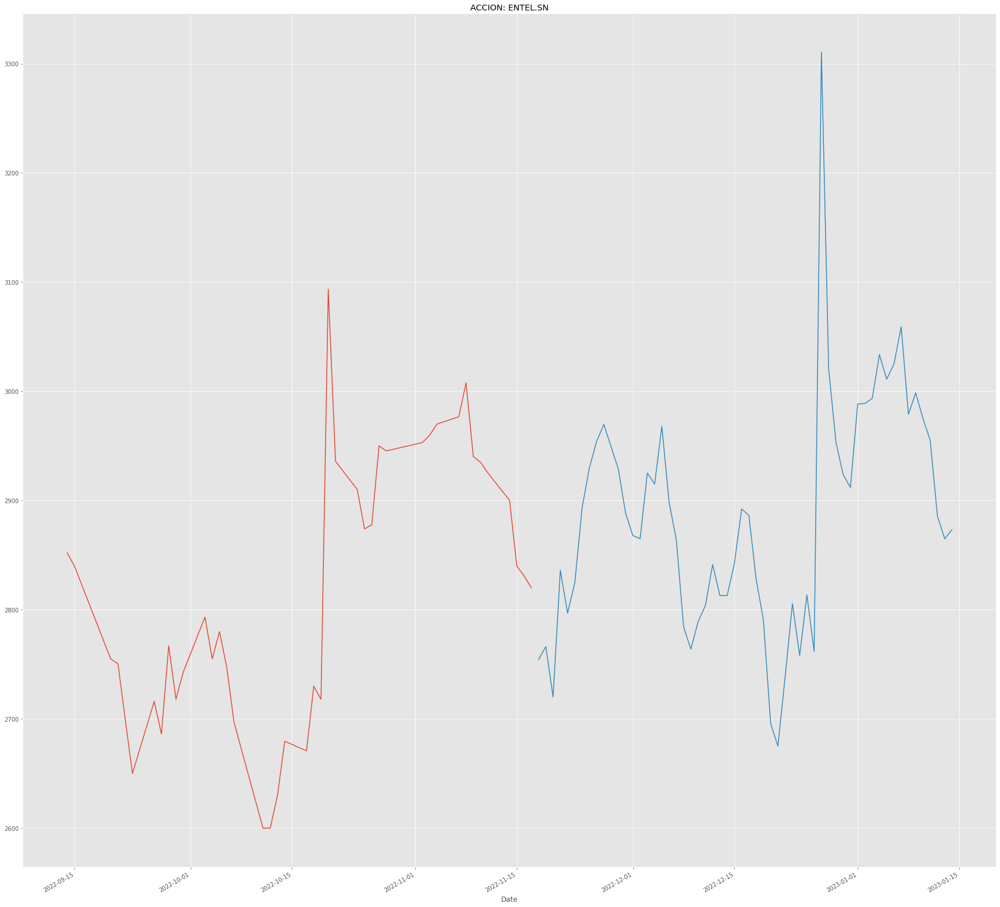


MALLPLAZA.SN
Date
2022-10-20           NaN
2022-10-21           NaN
2022-10-24           NaN
2022-10-25           NaN
2022-10-26           NaN
2022-10-27           NaN
2022-10-28           NaN
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18    818.029631
2022-11-19    846.331022
2022-11-20    842.585863
2022-11-21    862.135024
2022-11-22    888.290077
2022-11-23    888.820909
2022-11-24    911.284091
2022-11-25    912.578322
2022-11-26    927.462909
2022-11-27    939.734318
2022-11-28    953.251446
Name: Forecast, dtype: float64
----------------------


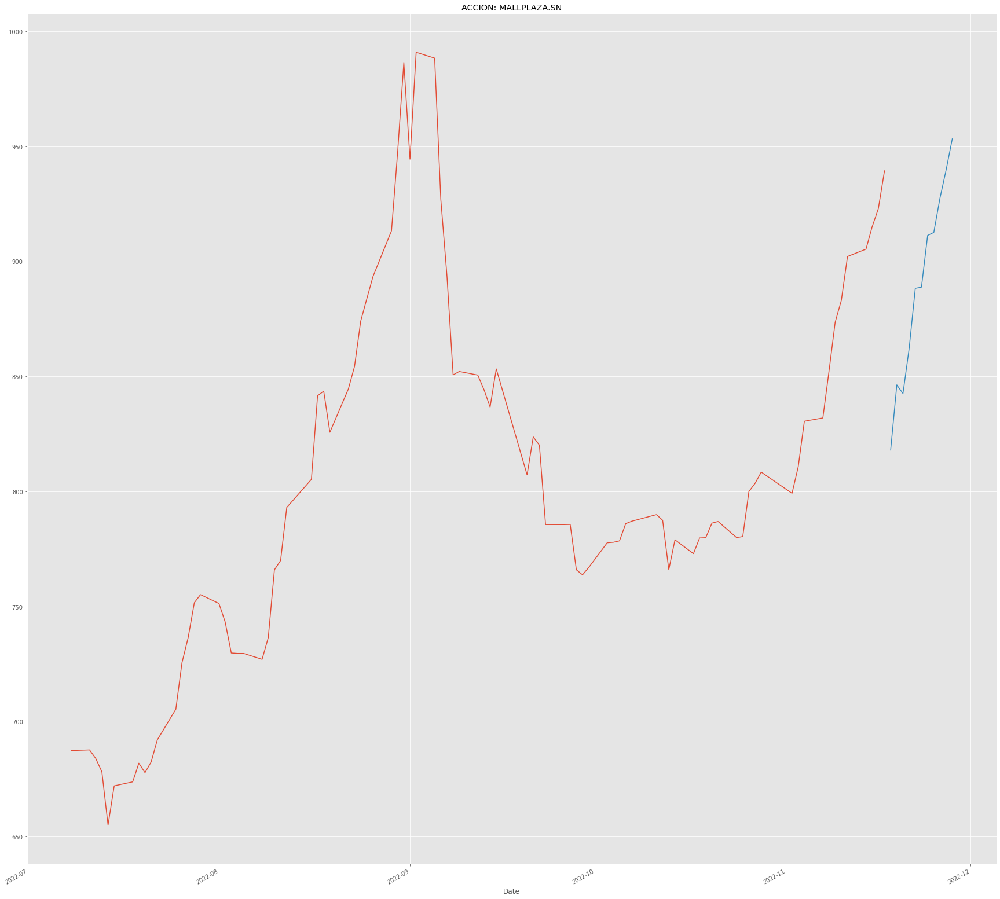


IAM.SN
Date
2022-12-01    406.291556
2022-12-02    395.670882
2022-12-03    392.362860
2022-12-04    386.681423
2022-12-05    382.185333
2022-12-06    389.397376
2022-12-07    391.483886
2022-12-08    391.029392
2022-12-09    410.436198
2022-12-10    412.655069
2022-12-11    404.982319
2022-12-12    385.797421
2022-12-13    393.081751
2022-12-14    409.648886
2022-12-15    417.455474
2022-12-16    431.126026
2022-12-17    443.104302
2022-12-18    452.574090
2022-12-19    444.924362
2022-12-20    443.232497
2022-12-21    444.877968
2022-12-22    452.484195
2022-12-23    451.978534
2022-12-24    458.612037
2022-12-25    462.285639
2022-12-26    462.611286
2022-12-27    464.854363
2022-12-28    460.430743
2022-12-29    460.095751
2022-12-30    458.615743
Name: Forecast, dtype: float64
----------------------


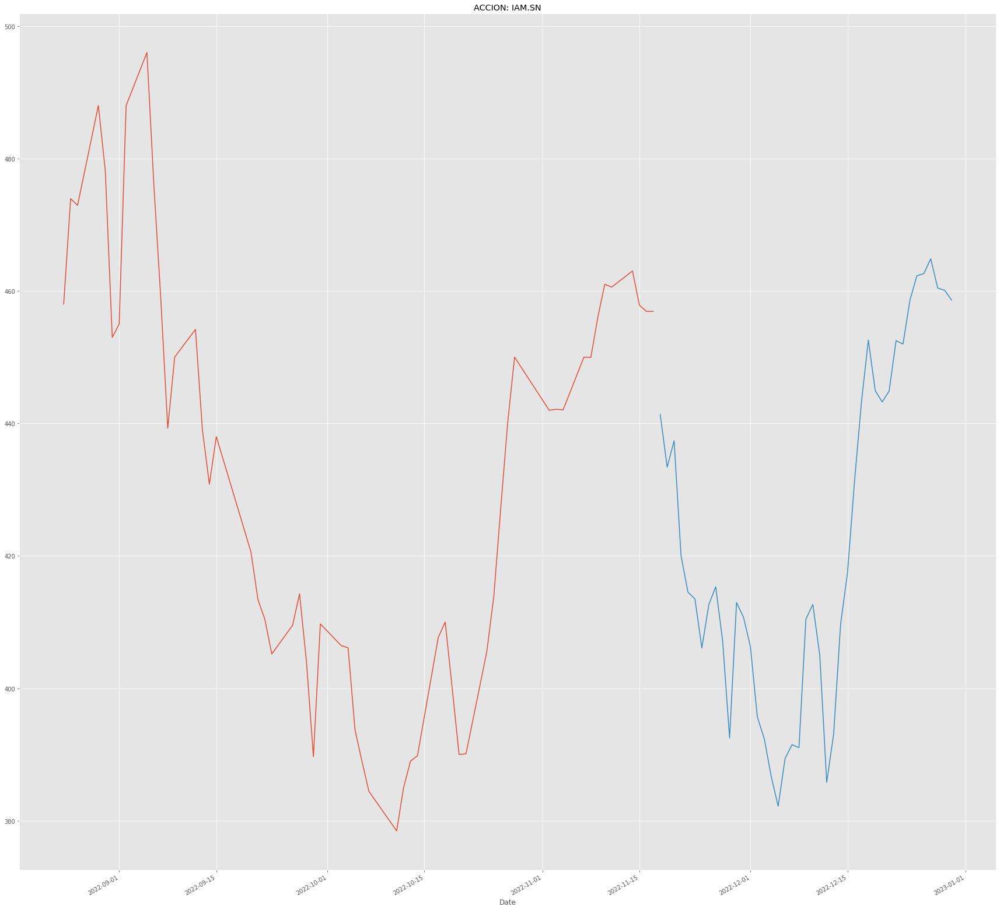


SMU.SN
Date
2022-10-26           NaN
2022-10-27           NaN
2022-10-28           NaN
2022-11-02           NaN
2022-11-03           NaN
2022-11-04           NaN
2022-11-07           NaN
2022-11-08           NaN
2022-11-09           NaN
2022-11-10           NaN
2022-11-11           NaN
2022-11-14           NaN
2022-11-15           NaN
2022-11-16           NaN
2022-11-17           NaN
2022-11-18     94.408856
2022-11-19     97.478997
2022-11-20     96.694317
2022-11-21     95.939938
2022-11-22     95.780172
2022-11-23     96.921350
2022-11-24     97.197537
2022-11-25     97.715665
2022-11-26     98.613516
2022-11-27    100.127632
2022-11-28    101.410018
2022-11-29    101.112912
2022-11-30    104.026486
2022-12-01    106.753814
2022-12-02    108.601279
Name: Forecast, dtype: float64
----------------------


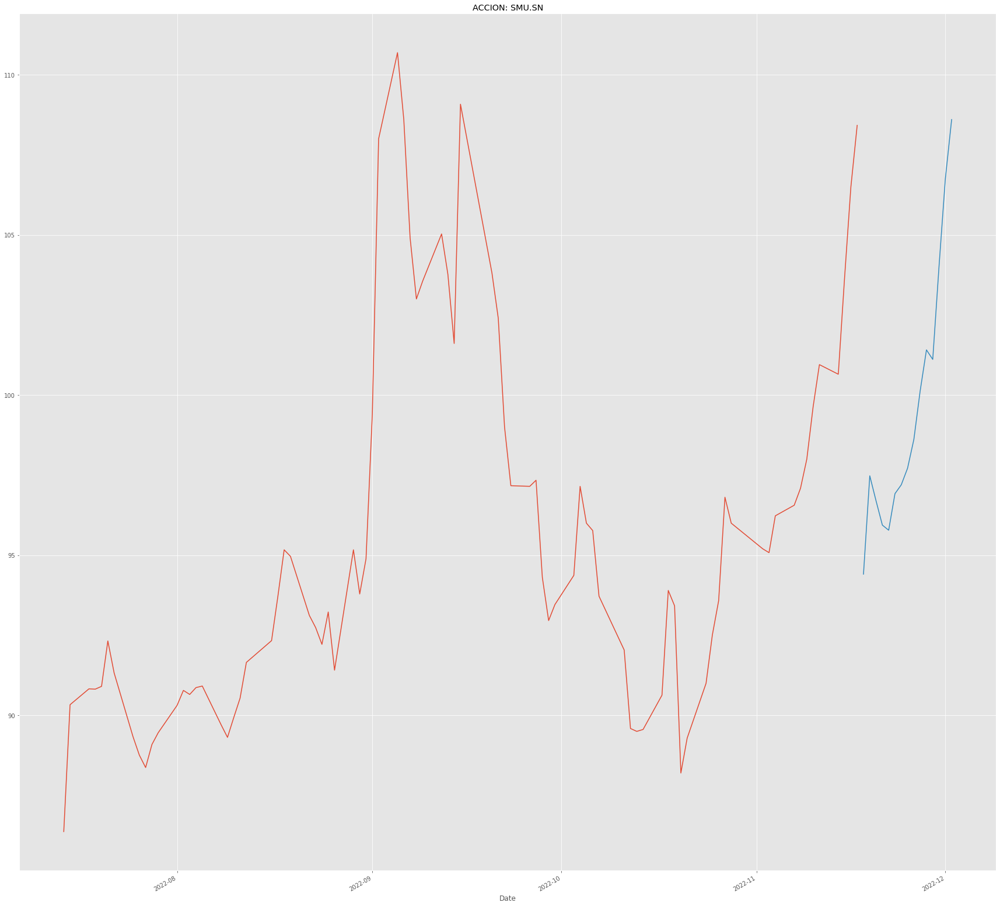


ECL.SN
Date
2022-12-16    478.353705
2022-12-17    474.796207
2022-12-18    497.225110
2022-12-19    477.428759
2022-12-20    463.064468
2022-12-21    467.027402
2022-12-22    480.391167
2022-12-23    494.359971
2022-12-24    508.164025
2022-12-25    515.755054
2022-12-26    500.421307
2022-12-27    498.728810
2022-12-28    513.668795
2022-12-29    504.651231
2022-12-30    526.767275
2022-12-31    534.307052
2023-01-01    549.512460
2023-01-02    561.904297
2023-01-03    557.833279
2023-01-04    551.004824
2023-01-05    542.059743
2023-01-06    535.354184
2023-01-07    536.298352
2023-01-08    525.954894
2023-01-09    525.295395
2023-01-10    509.206254
2023-01-11    521.539128
2023-01-12    509.709837
2023-01-13    513.450001
2023-01-14    512.216771
Name: Forecast, dtype: float64
----------------------


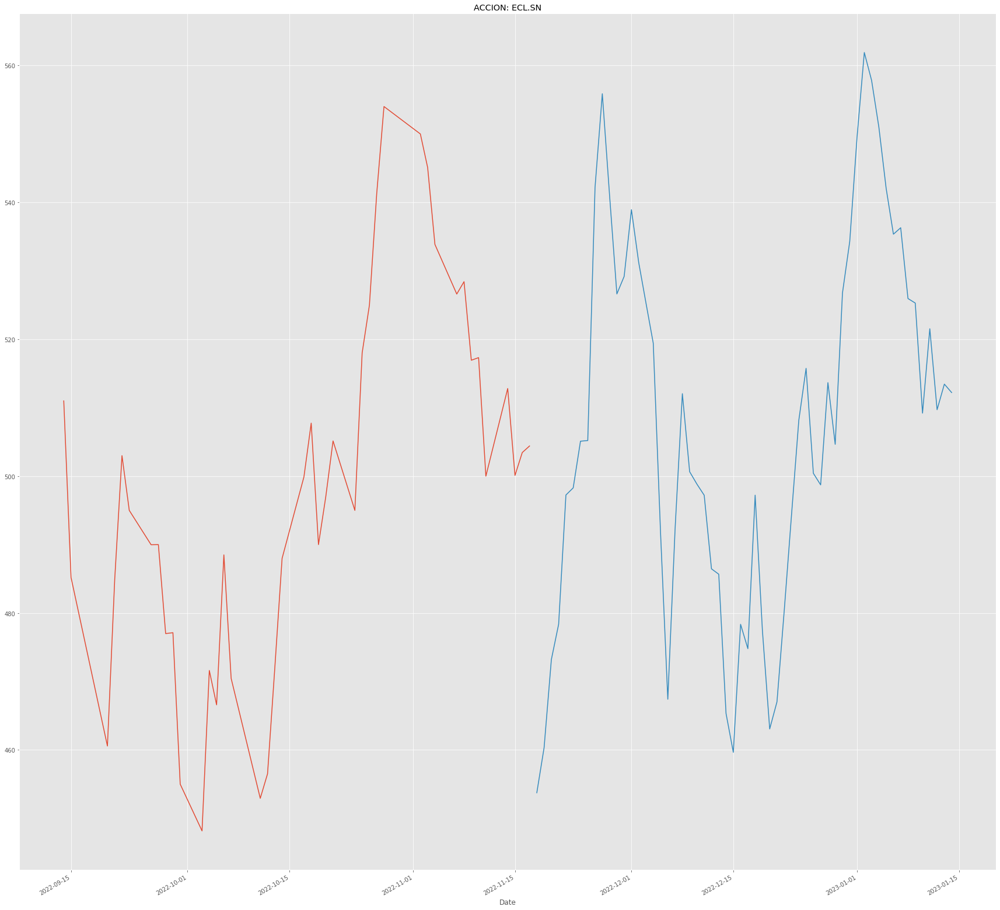


SONDA.SN
Date
2022-11-29    382.107837
2022-11-30    376.438930
2022-12-01    364.820038
2022-12-02    355.585859
2022-12-03    349.116407
2022-12-04    336.335681
2022-12-05    343.667351
2022-12-06    344.111156
2022-12-07    344.432580
2022-12-08    345.636558
2022-12-09    339.629373
2022-12-10    348.365817
2022-12-11    343.875095
2022-12-12    336.476457
2022-12-13    338.966539
2022-12-14    340.157989
2022-12-15    336.466597
2022-12-16    344.792003
2022-12-17    350.153208
2022-12-18    343.534668
2022-12-19    340.658056
2022-12-20    348.336675
2022-12-21    348.345103
2022-12-22    343.235668
2022-12-23    350.523063
2022-12-24    341.434611
2022-12-25    337.657844
2022-12-26    338.661300
2022-12-27    334.309695
2022-12-28    335.071678
Name: Forecast, dtype: float64
----------------------


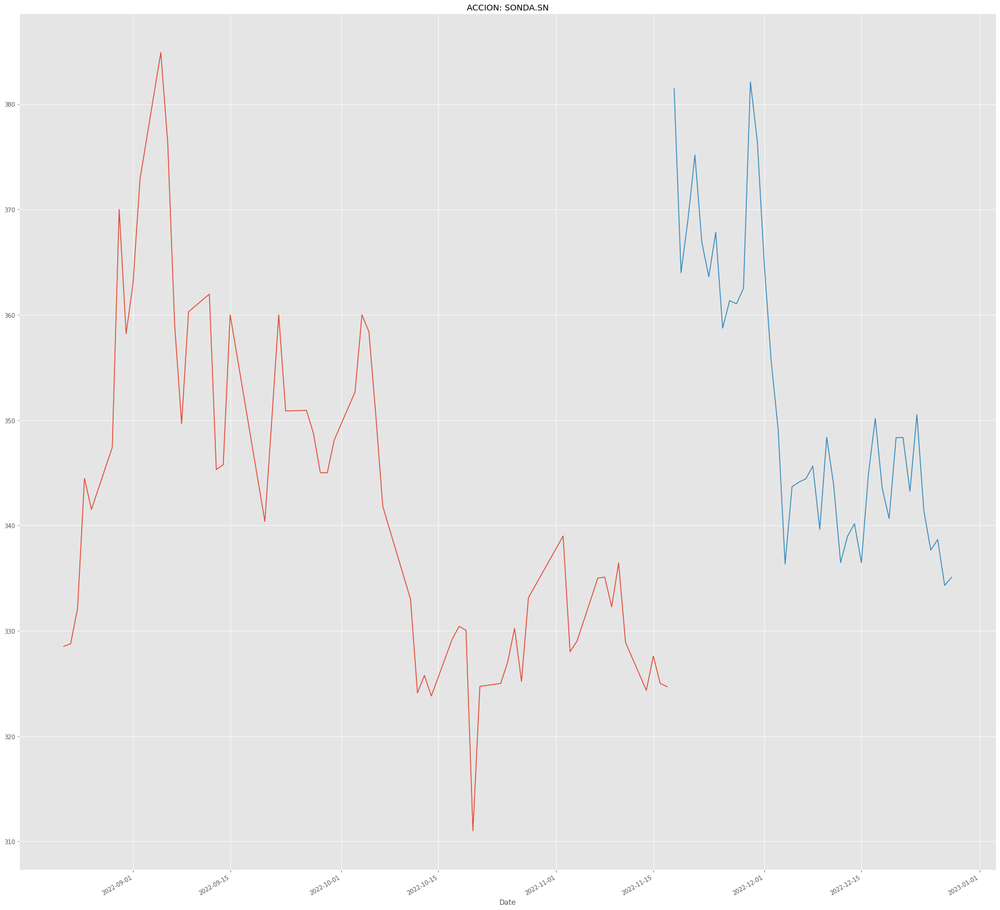


RIPLEY.SN
Date
2022-12-02    159.038385
2022-12-03    161.322295
2022-12-04    167.151796
2022-12-05    161.123430
2022-12-06    162.136395
2022-12-07    162.144040
2022-12-08    158.671638
2022-12-09    160.542567
2022-12-10    165.915162
2022-12-11    167.819071
2022-12-12    171.936647
2022-12-13    155.438712
2022-12-14    164.695667
2022-12-15    164.049879
2022-12-16    164.819001
2022-12-17    163.370408
2022-12-18    162.569417
2022-12-19    161.887153
2022-12-20    160.232630
2022-12-21    155.483393
2022-12-22    160.241131
2022-12-23    161.560915
2022-12-24    160.046958
2022-12-25    156.294805
2022-12-26    152.320596
2022-12-27    154.369983
2022-12-28    151.498562
2022-12-29    150.030752
2022-12-30    152.680062
2022-12-31    152.450185
Name: Forecast, dtype: float64
----------------------


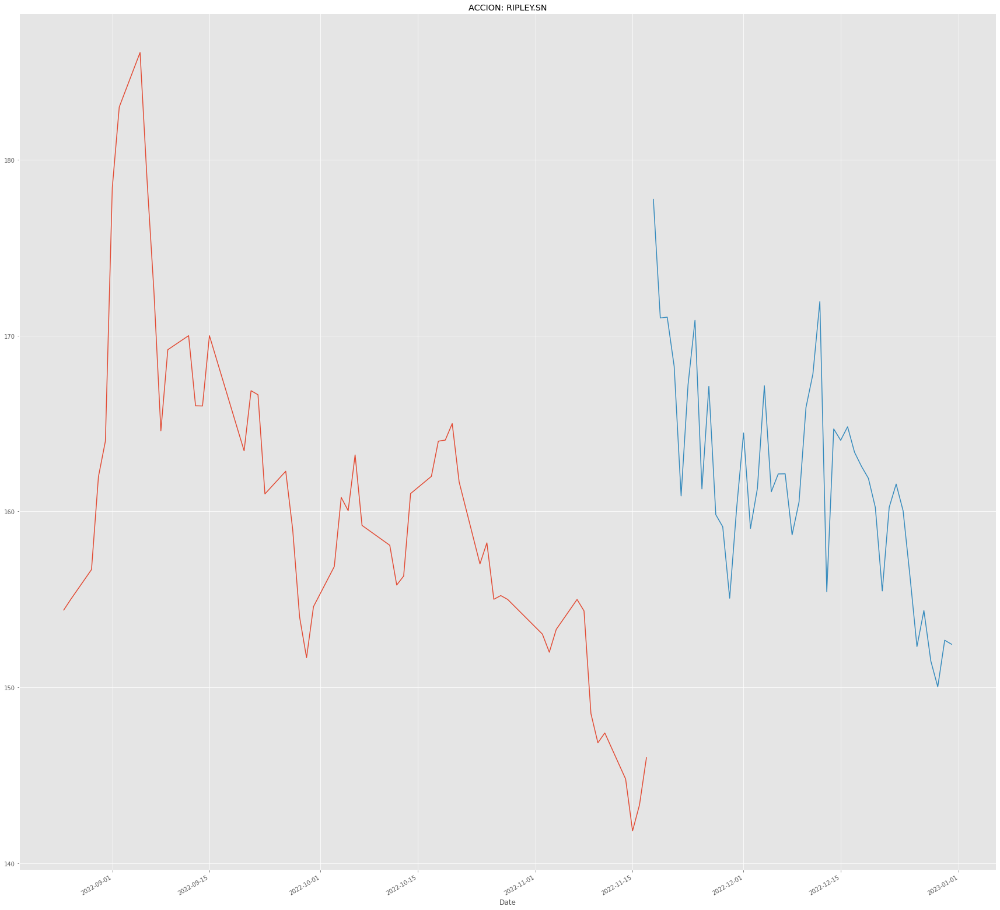


SECURITY.SN
Date
2022-12-16    144.298175
2022-12-17    143.784854
2022-12-18    144.434114
2022-12-19    145.962387
2022-12-20    143.414904
2022-12-21    142.830077
2022-12-22    146.838202
2022-12-23    147.442917
2022-12-24    147.886862
2022-12-25    146.012544
2022-12-26    146.584336
2022-12-27    150.398398
2022-12-28    148.547402
2022-12-29    150.101622
2022-12-30    149.689703
2022-12-31    149.319868
2023-01-01    158.300551
2023-01-02    157.438415
2023-01-03    152.538157
2023-01-04    153.058345
2023-01-05    155.081644
2023-01-06    154.801305
2023-01-07    152.891501
2023-01-08    150.240757
2023-01-09    150.518402
2023-01-10    154.680633
2023-01-11    155.899296
2023-01-12    153.554007
2023-01-13    153.922441
2023-01-14    155.120477
Name: Forecast, dtype: float64
----------------------


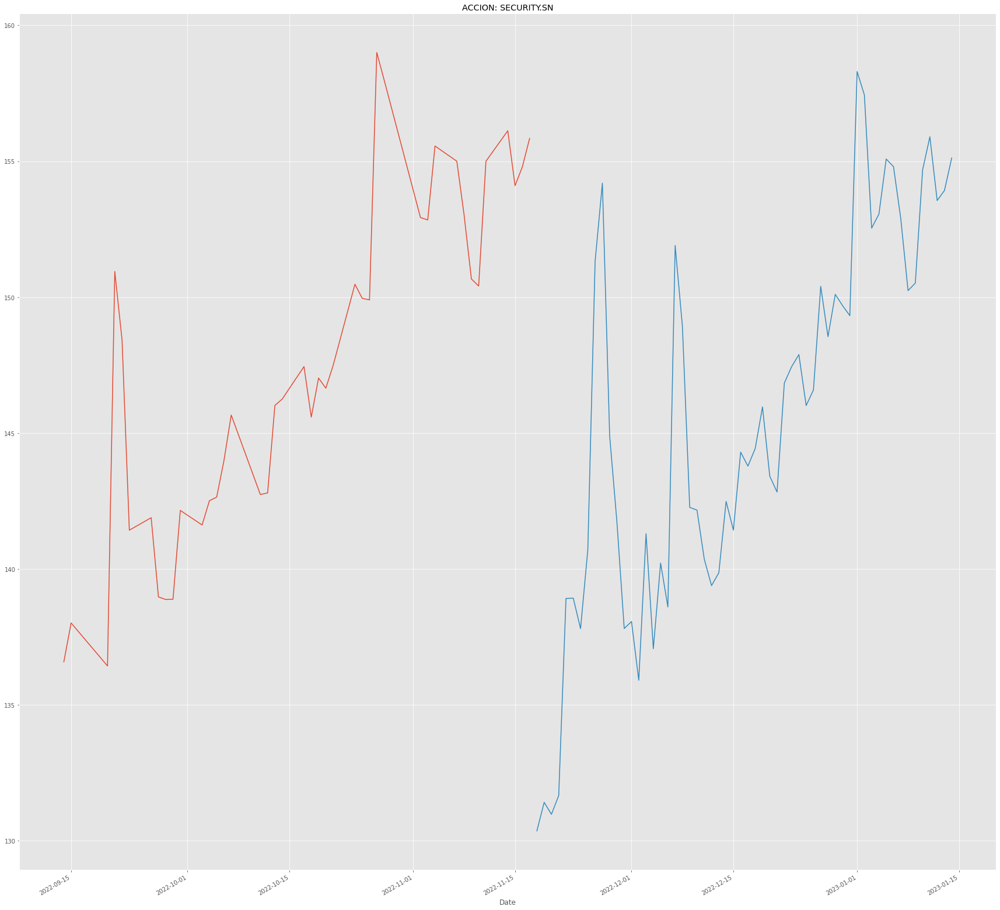


QUINENCO.SN
Date
2022-12-16    2512.062462
2022-12-17    2556.583003
2022-12-18    2505.163563
2022-12-19    2449.659205
2022-12-20    2375.078314
2022-12-21    2351.821804
2022-12-22    2341.025009
2022-12-23    2409.446645
2022-12-24    2474.491417
2022-12-25    2578.294301
2022-12-26    2490.153398
2022-12-27    2963.824593
2022-12-28    2708.011083
2022-12-29    2673.440098
2022-12-30    2600.908511
2022-12-31    2561.953035
2023-01-01    2566.848190
2023-01-02    2599.558205
2023-01-03    2579.117099
2023-01-04    2641.343639
2023-01-05    2625.279008
2023-01-06    2611.084130
2023-01-07    2698.226752
2023-01-08    2690.101124
2023-01-09    2762.692530
2023-01-10    2800.934641
2023-01-11    2768.354883
2023-01-12    2775.056014
2023-01-13    2763.929179
2023-01-14    2767.231352
Name: Forecast, dtype: float64
----------------------


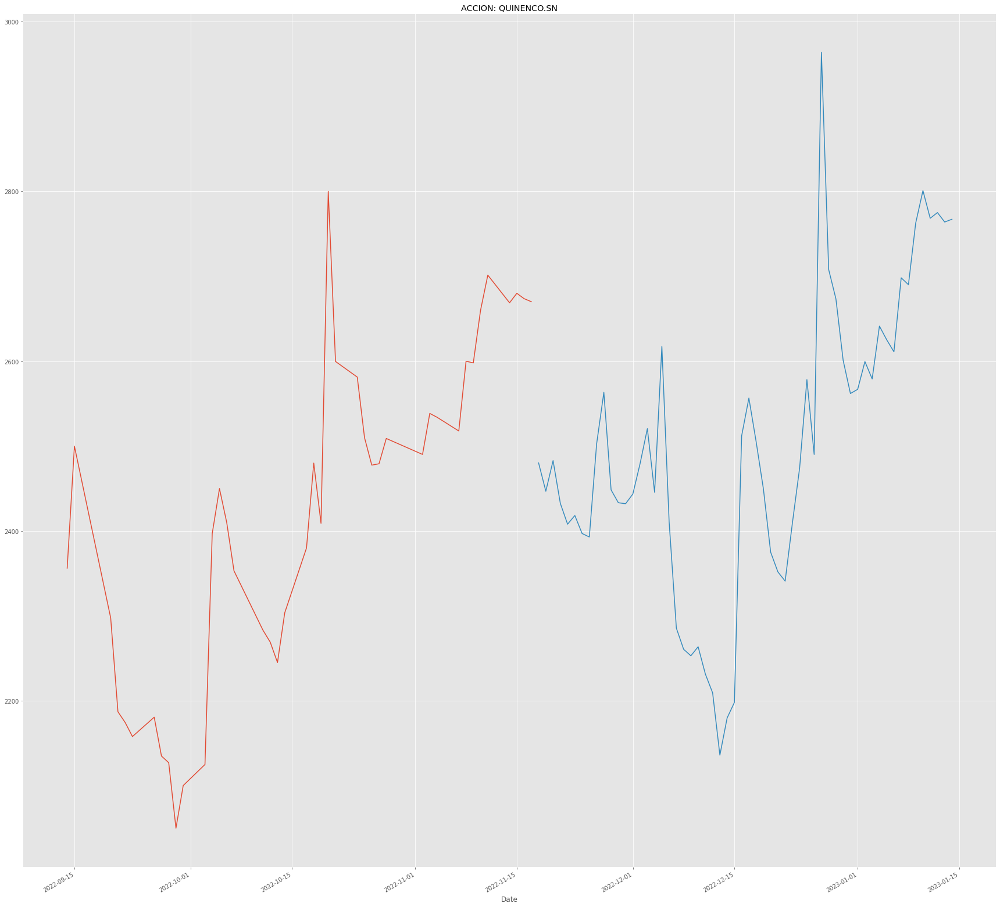


BESALCO.SN
Date
2022-11-26    336.877553
2022-11-27    336.499765
2022-11-28    324.317703
2022-11-29    316.477858
2022-11-30    312.341763
2022-12-01    300.839666
2022-12-02    301.473079
2022-12-03    302.861508
2022-12-04    304.808478
2022-12-05    309.578183
2022-12-06    316.089463
2022-12-07    341.875866
2022-12-08    343.747442
2022-12-09    348.457328
2022-12-10    344.877164
2022-12-11    340.652544
2022-12-12    341.996395
2022-12-13    341.348128
2022-12-14    341.148214
2022-12-15    338.745970
2022-12-16    338.679257
2022-12-17    335.958245
2022-12-18    338.021314
2022-12-19    336.367826
2022-12-20    336.042587
2022-12-21    325.774168
2022-12-22    320.228878
2022-12-23    314.715933
2022-12-24    320.168841
2022-12-25    323.559414
Name: Forecast, dtype: float64
----------------------


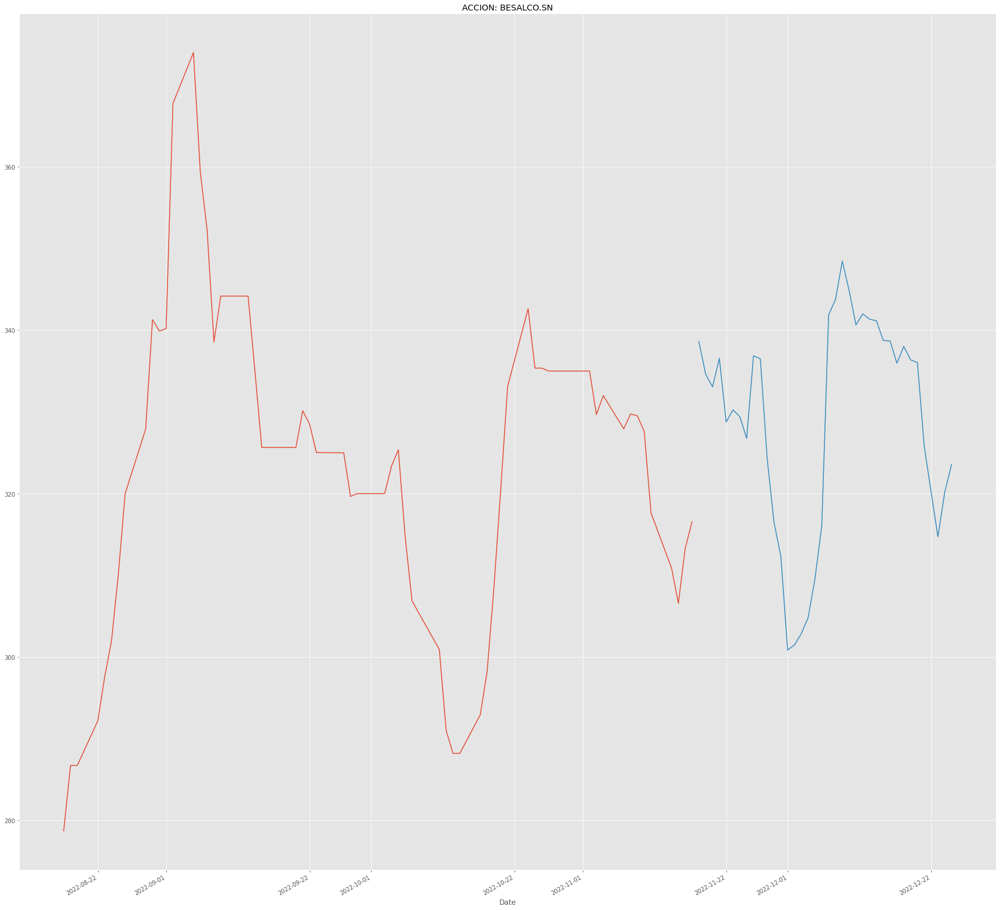


MASISA.SN
Date
2022-12-16    31.012533
2022-12-17    31.617903
2022-12-18    31.770162
2022-12-19    29.684381
2022-12-20    31.116366
2022-12-21    30.877532
2022-12-22    30.216828
2022-12-23    29.441867
2022-12-24    31.382765
2022-12-25    31.976527
2022-12-26    32.904545
2022-12-27    28.732675
2022-12-28    32.721965
2022-12-29    32.326460
2022-12-30    32.363121
2022-12-31    33.629842
2023-01-01    34.093774
2023-01-02    34.474707
2023-01-03    34.099832
2023-01-04    33.131849
2023-01-05    34.031694
2023-01-06    34.398827
2023-01-07    34.208374
2023-01-08    34.854767
2023-01-09    34.949737
2023-01-10    36.347179
2023-01-11    36.349177
2023-01-12    36.503164
2023-01-13    35.695800
2023-01-14    34.574696
Name: Forecast, dtype: float64
----------------------


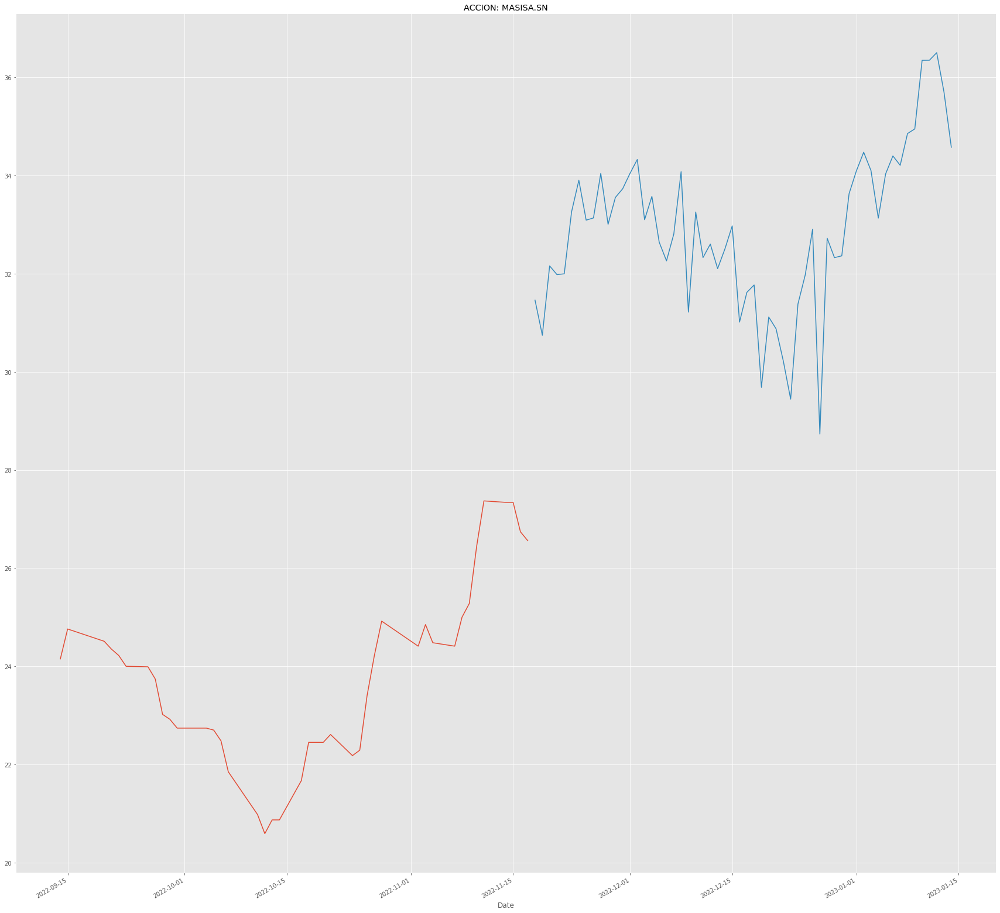


LTM.SN
Date
2022-12-16    447.133017
2022-12-17    268.409896
2022-12-18    250.393440
2022-12-19    225.979344
2022-12-20    252.136453
2022-12-21    247.713142
2022-12-22    277.454771
2022-12-23    274.466464
2022-12-24    264.535424
2022-12-25    270.134803
2022-12-26    252.623333
2022-12-27    334.457790
2022-12-28    289.577034
2022-12-29    247.873688
2022-12-30    315.709039
2022-12-31    250.862680
2023-01-01    319.335352
2023-01-02    384.137522
2023-01-03    309.824871
2023-01-04    566.917814
2023-01-05    367.599573
2023-01-06    365.971017
2023-01-07    568.745895
2023-01-08    404.818462
2023-01-09    368.992343
2023-01-10    343.361469
2023-01-11    779.694634
2023-01-12    208.790195
2023-01-13    238.352906
2023-01-14    421.509980
Name: Forecast, dtype: float64
----------------------


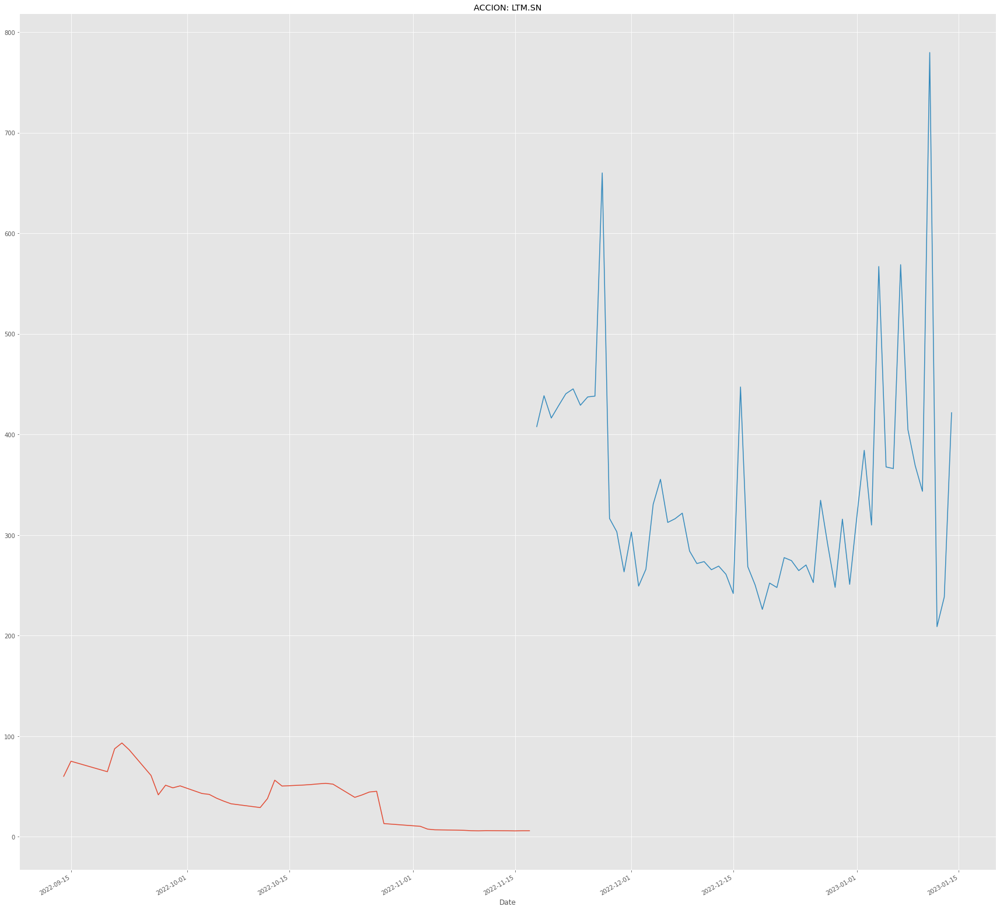


ENJOY.SN
Date
2022-11-22    2.068831
2022-11-23    2.091189
2022-11-24    2.329331
2022-11-25    1.948065
2022-11-26    2.366300
2022-11-27    2.239829
2022-11-28    2.111772
2022-11-29    1.857041
2022-11-30    2.305614
2022-12-01    3.067033
2022-12-02    4.138273
2022-12-03    1.527442
2022-12-04    2.389118
2022-12-05    2.356510
2022-12-06    2.435396
2022-12-07    2.464368
2022-12-08    2.437049
2022-12-09    2.175451
2022-12-10    2.062210
2022-12-11    1.830479
2022-12-12    2.072358
2022-12-13    2.106837
2022-12-14    2.143021
2022-12-15    2.246058
2022-12-16    1.993350
2022-12-17    2.223516
2022-12-18    2.337589
2022-12-19    2.281547
2022-12-20    2.964610
2022-12-21    2.301814
Name: Forecast, dtype: float64
----------------------


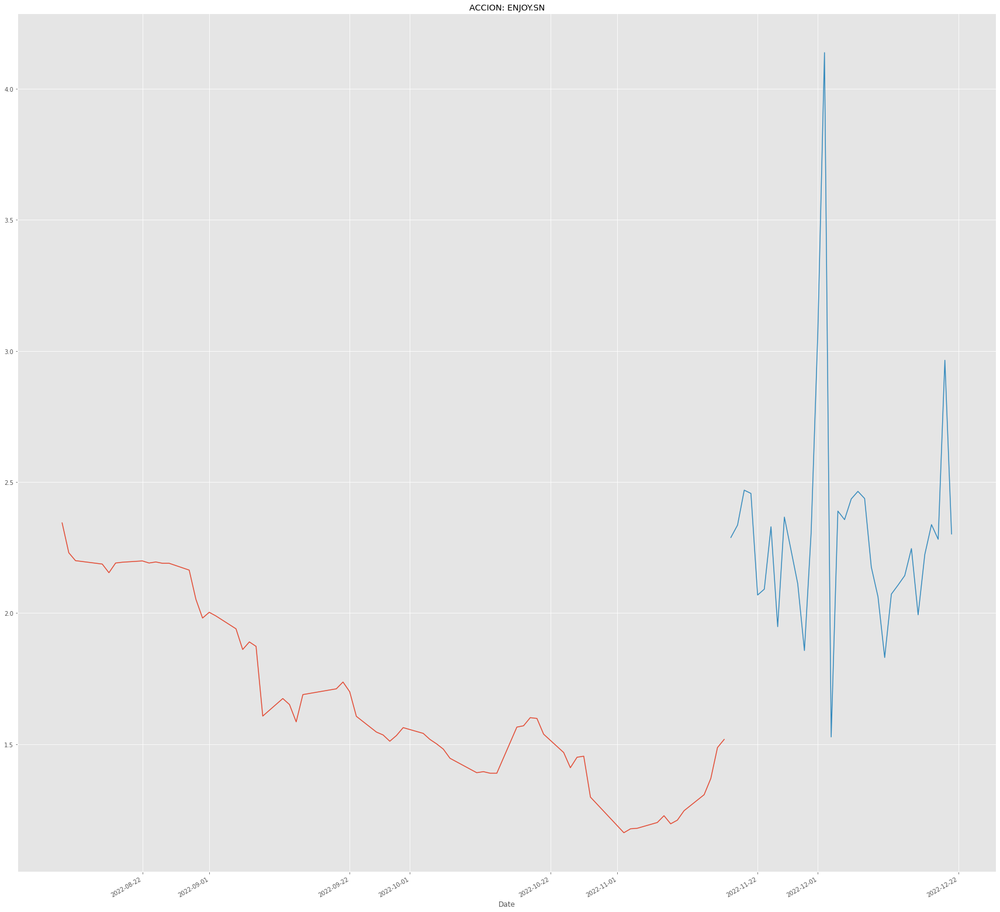

In [65]:
for i in ipsa:
  globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'].tail(100).plot()
  globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(100).plot()

  print(i)
  #print(globals()[str('dfreg')+str(i).replace(".","")]['Adj Close'])
  print(globals()[str('dfreg')+str(i).replace(".","")]['Forecast'].tail(30))
  print("----------------------")
  plt.title("ACCION: "+ str(i))
  plt.show()
  print()



# Challenges (To Be Continued):
* Assuming economic qualitative factors such as news (news sourcing and sentimental analysis)
* Assuming economic quantitative factors such as HPI of a certain country, economic inequality among origin of company
* Cleaning out the data
* Importing data files

# Next lesson:
## Lesson 4 Basic Python for Data Analytics (Predicting Employee Retention)

# Python: How to Get Live Market Data (Less Than 0.1-Second Lag).
This article is going to be a bit special. I am going to test the latest release from Yahoo Finance API for Python, which provide the possibility to get live data with less than a second lag for free.

Before to start
First of all, if you want to track my progress and before to start, you will need to have installed on your machine a Python 3 version and the following packages:
Pandas
NumPy
Yfinance
Plotly (Not mandatory, but useful for plotting)
If any of these packages are not already installed, you can use the pip command, as shown below.

In [66]:
!pip install yfinance
!pip install plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Once you have ensured that the following packages are installed, we can start.
If you already have experience with Python, you can jump to the second step. The first step will consist of importing data.
I. Import package
The first step will consist of importing the necessary packages.
You will start by importing your packages previously installed by using the following lines of code:

In [67]:
# Raw Package
import numpy as np
import pandas as pd

#Data Source
import yfinance as yf

#Data viz
import plotly.graph_objs as go


def print_real_time(accion_predecirss):
  #Interval required 1 minute
  accion = accion_predecirss
  data = yf.download(tickers=accion, period='1d', interval='1m')

  #declare figure
  fig = go.Figure()


  #Candlestick
  fig.add_trace(go.Candlestick(x=data.index,
                  open=data['Open'],
                  high=data['High'],
                  low=data['Low'],
                  close=data['Close'], name = 'market data'))

  # Add titles
  fig.update_layout(
      title='EVOLUCIÓN EN VIVO DEL PRECIO DE LA ACCIÓN: '+accion,
      yaxis_title='PRECIO DE LAS ACCION ' + accion)

  # X-Axes
  fig.update_xaxes(
      rangeslider_visible=True,
      rangeselector=dict(
          buttons=list([
              dict(count=15, label="15m", step="minute", stepmode="backward"),
              dict(count=45, label="45m", step="minute", stepmode="backward"),
              dict(count=1, label="HTD", step="hour", stepmode="todate"),
              dict(count=3, label="3h", step="hour", stepmode="backward"),
              dict(step="all")
          ])
      )
  )

  #Show
  fig.show()

  #while True:
    #print(data)

for count, value in enumerate(ipsa):
  print("*********************************************************")
  print(count, value)
  print_real_time(value)
  print("*********************************************************")


*********************************************************
0 HLAG.DE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
1 MAERSK-B.CO
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
2 VALE
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
3 INVERCAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
4 SQM-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
5 CHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
6 BSANTANDER.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
7 COPEC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
8 CENCOSUD.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
9 FALABELLA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
10 ENELAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
11 CMPC.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
12 BCI.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
13 VAPORES.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
14 CAP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
15 CCU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
16 ENELCHILE.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
17 ANDINA-B.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
18 CONCHATORO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
19 PARAUCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
20 ITAUCORP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
21 AGUAS-A.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
22 COLBUN.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
23 CENCOSHOPP.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
24 ENTEL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
25 MALLPLAZA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
26 IAM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
27 SMU.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
28 ECL.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
29 SONDA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
30 RIPLEY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
31 SECURITY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
32 QUINENCO.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
33 BESALCO.SN
[*********************100%***********************]  1 of 1 completed

1 Failed download:
- BESALCO.SN: No data found for this date range, symbol may be delisted


*********************************************************
*********************************************************
34 MASISA.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
35 LTM.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************
*********************************************************
36 ENJOY.SN
[*********************100%***********************]  1 of 1 completed


*********************************************************


In [68]:
def make_forecast(ticker, periods, hist='max'):
    """
    forecast the given ticker (stock) period days into the future (from today)

    inputs
    ------
    > ticker
        >> ticker of stock to forecast
    > periods
        >> number of days into the future to forecast (from today's date)
    > hist
        >> amount of historical data to consider
            > default: max
            > options: 1d, 5d, 1mo, 3mo, 6mo, 1y, 2y, 5y, 10y, ytd, max
    """
    # pull historical data from yahoo finance
    stock_data = yf.Ticker(ticker)

    hist_data = stock_data.history(hist, auto_adjust=True)

    # create new dataframe to hold dates (ds) & adjusted closing prices (y)
    df = pd.DataFrame()

    df['ds'] = hist_data.index.values
    df['y'] = hist_data['Close'].values

    # create a Prophet model from that data
    m = Prophet(daily_seasonality=False)
    m.fit(df)

    future = m.make_future_dataframe(periods, freq='D')

    forecast = m.predict(future)

    m.plot(forecast)

    #return forecast